In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os

# --- 전역 설정 ---
# 결과 파일을 저장할 디렉토리 생성
output_fig_dir = "publication_figures"
os.makedirs(output_fig_dir, exist_ok=True)

# --- 데이터 파일 경로 설정 (수정된 부분) ---
# 각 파일의 경로를 명확하게 지정합니다.
# 1. 초기 전체 OPG 분석 결과 파일
summary_file = os.path.join("opg_analysis_results", "opg_analysis_summary_clade_all.csv")
# 2. 시간 경과에 따른 변화(Longitudinal) 분석 결과 파일
longitudinal_file = os.path.join("expanded_mpxv_analysis_mafft", "new_conservation_analysis_mafft.csv")

# 그래프 전반에 적용할 스타일 설정
sns.set_theme(style="whitegrid", context="paper")
plt.rcParams['font.family'] = 'Arial' # 학술지에서 선호하는 폰트
plt.rcParams['figure.dpi'] = 300 # 고해상도 이미지

# --- 데이터 로드 (수정된 부분) ---
# 각 파일을 개별적으로 로드하여 오류 발생 시 명확히 알 수 있도록 수정
df_summary = None
df_longitudinal = None

try:
    df_summary = pd.read_csv(summary_file)
    print(f"성공: '{summary_file}' 파일을 로드했습니다.")
except FileNotFoundError:
    print(f"오류: 초기 분석 파일('{summary_file}')을 찾을 수 없습니다. 경로를 확인하세요.")

try:
    df_longitudinal = pd.read_csv(longitudinal_file)
    print(f"성공: '{longitudinal_file}' 파일을 로드했습니다.")
except FileNotFoundError:
    print(f"오류: 시간 경과 분석 파일('{longitudinal_file}')을 찾을 수 없습니다. 경로를 확인하세요.")


# --- Figure 1: Genome-Wide Conservation Profile ---
def create_figure_1(df):
    """
    Figure 1: 전체 OPG의 보존성 프로파일을 시각화합니다.
    A: 보존율 분포 히스토그램
    B: 정렬 길이와 변이 위치 수의 관계를 나타내는 산점도
    """
    if df is None:
        print("Figure 1 생성 건너뛰기: 데이터가 없습니다.")
        return
        
    print("Figure 1 생성 중...")
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    
    # --- Part A: 보존율 분포 ---
    sns.histplot(df['Conservation'], bins=30, kde=True, ax=ax1, color='royalblue')
    mean_conservation = df['Conservation'].mean()
    ax1.axvline(mean_conservation, color='red', linestyle='--', linewidth=1.5, label=f'Mean: {mean_conservation:.2f}%')
    ax1.set_title('A) Distribution of OPG Conservation Rates', fontsize=14, weight='bold')
    ax1.set_xlabel('Conservation Rate (%)', fontsize=12)
    ax1.set_ylabel('Number of OPGs', fontsize=12)
    ax1.legend()

    # --- Part B: 정렬 길이 vs 변이 ---
    ax2.scatter(df['Length'], df['Variables'], alpha=0.6, edgecolors='w', s=50, color='forestgreen')
    ax2.set_title('B) Alignment Length vs. Mutational Burden', fontsize=14, weight='bold')
    ax2.set_xlabel('Alignment Length (bp)', fontsize=12)
    ax2.set_ylabel('Number of Variable Sites', fontsize=12)
    ax2.set_xscale('log') # 길이가 매우 다양하므로 로그 스케일 적용
    ax2.set_yscale('log') # 변이 수도 매우 다양하므로 로그 스케일 적용

    # 특정 OPG 주석 추가
    for opg_id in ['YP_010377004.1', 'YP_010377176.1']:
        opg_data = df[df['OPG'] == opg_id]
        if not opg_data.empty:
            ax2.scatter(opg_data['Length'], opg_data['Variables'], color='red', s=100, zorder=5)
            ax2.annotate(opg_id, (opg_data['Length'].iloc[0], opg_data['Variables'].iloc[0]),
                         textcoords="offset points", xytext=(0,10), ha='center', fontsize=9, weight='bold')

    plt.tight_layout()
    fig_path = os.path.join(output_fig_dir, "Figure_1_Conservation_Profile.png")
    plt.savefig(fig_path)
    plt.close()
    print(f"Figure 1 저장 완료: {fig_path}")

# --- Figure 2: Systematic Filtering Process ---
def create_figure_2(df):
    """
    Figure 2: 95% 보존율 기준 필터링 과정을 시각화합니다.
    """
    if df is None:
        print("Figure 2 생성 건너뛰기: 데이터가 없습니다.")
        return
        
    print("Figure 2 생성 중...")
    total_opgs = len(df)
    conserved_opgs = len(df[df['Conservation'] >= 95])
    
    fig, ax = plt.subplots(figsize=(6, 6))
    
    categories = ['Total OPGs', 'Candidates (≥95% Conserved)']
    counts = [total_opgs, conserved_opgs]
    
    bars = ax.bar(categories, counts, color=['gray', 'darkorange'], width=0.6)
    
    ax.set_title('Systematic Filtering of OPGs', fontsize=14, weight='bold')
    ax.set_ylabel('Number of OPGs', fontsize=12)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    # 막대 위에 숫자 표시
    for bar in bars:
        yval = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2.0, yval + 5, int(yval), ha='center', va='bottom', fontsize=12)
        
    plt.tight_layout()
    fig_path = os.path.join(output_fig_dir, "Figure_2_Filtering_Process.png")
    plt.savefig(fig_path)
    plt.close()
    print(f"Figure 2 저장 완료: {fig_path}")

# --- Figure 3: Longitudinal Conservation Dynamics ---
def create_figure_3(df_long):
    """
    Figure 3: 3개 후보 OPG의 시간 경과에 따른 보존율 변화를 비교합니다.
    """
    if df_long is None:
        print("Figure 3 생성 건너뛰기: 데이터가 없습니다.")
        return
        
    print("Figure 3 생성 중...")
    # 시각화를 위한 데이터 준비
    plot_data = df_long[['OPG', 'Original_Conservation', 'New_Conservation']].copy()
    plot_data.set_index('OPG', inplace=True)
    
    fig, ax = plt.subplots(figsize=(8, 6))
    
    plot_data.plot(kind='bar', ax=ax, color={'Original_Conservation': 'skyblue', 'New_Conservation': 'navy'}, width=0.8)
    
    ax.set_title('Longitudinal Conservation of Candidate OPGs', fontsize=14, weight='bold')
    ax.set_ylabel('Conservation Rate (%)', fontsize=12)
    ax.set_xlabel('OPG ID', fontsize=12)
    ax.tick_params(axis='x', rotation=0)
    ax.legend(['Baseline Dataset', '2023-2025 Dataset'], fontsize=10)
    ax.axhline(y=95, color='red', linestyle='--', linewidth=1.5, label='95% Threshold')
    
    plt.tight_layout()
    fig_path = os.path.join(output_fig_dir, "Figure_3_Longitudinal_Dynamics.png")
    plt.savefig(fig_path)
    plt.close()
    print(f"Figure 3 저장 완료: {fig_path}")

# --- Figure 4: Mutational Landscape (Conceptual) ---
def create_figure_4():
    """
    Figure 4: 보존성이 감소한 OPG의 돌연변이 위치를 개념적으로 시각화합니다.
    참고: 실제 데이터가 없으므로, 시뮬레이션된 데이터로 개념을 보여줍니다.
         사용자는 실제 MAFFT 정렬 결과에서 변이 위치를 추출하여 이 코드를 수정해야 합니다.
    """
    print("Figure 4 (개념도) 생성 중...")
    fig, ax = plt.subplots(figsize=(10, 4))

    # 시뮬레이션 데이터: 실제로는 alignment 파일에서 추출해야 함
    # YP_010377054.1 (정렬 길이 ~9700bp)
    mutations_opg1 = np.random.randint(0, 9717, 50) 
    # YP_010377087.1 (정렬 길이 ~11100bp)
    mutations_opg2 = np.random.randint(0, 11129, 70) 

    opg_names = ['YP_010377054.1', 'YP_010377087.1']
    
    # 각 OPG에 대한 변이 위치 플롯
    ax.eventplot([mutations_opg1, mutations_opg2], orientation='horizontal', 
                 colors=['red', 'darkred'], lineoffsets=[1, 2], linelengths=0.8)

    ax.set_title('Conceptual Mutational Landscape of Decaying OPGs (2023-2025)', fontsize=14, weight='bold')
    ax.set_xlabel('Alignment Position (bp)', fontsize=12)
    ax.set_yticks([1, 2])
    ax.set_yticklabels(opg_names, fontsize=10)
    ax.set_ylim(0.5, 2.5)
    ax.grid(axis='x', linestyle=':', alpha=0.5)
    
    # 안내 텍스트 추가
    ax.text(0.95, 0.05, 'NOTE: Mutation positions are simulated for illustrative purposes.',
            transform=ax.transAxes, fontsize=8, style='italic', ha='right')

    plt.tight_layout()
    fig_path = os.path.join(output_fig_dir, "Figure_4_Mutational_Landscape_Conceptual.png")
    plt.savefig(fig_path)
    plt.close()
    print(f"Figure 4 저장 완료: {fig_path}")

# --- Figure 5: Identification of Superior Target ---
def create_figure_5(df_long):
    """
    Figure 5: 최종적으로 선정된 우수 타겟(YP_010377182.1)을 강조하여 보여줍니다.
    """
    if df_long is None:
        print("Figure 5 생성 건너뛰기: 데이터가 없습니다.")
        return
        
    print("Figure 5 생성 중...")
    df_plot = df_long.sort_values('Conservation_Change', ascending=False)
    
    fig, ax = plt.subplots(figsize=(8, 6))
    
    colors = ['red' if x < 0 else 'green' for x in df_plot['Conservation_Change']]
    bars = ax.bar(df_plot['OPG'], df_plot['Conservation_Change'], color=colors, alpha=0.8)
    
    ax.axhline(0, color='black', linewidth=0.8)
    ax.set_title('Conservation Change in Candidate OPGs (Baseline vs. 2023-2025)', fontsize=14, weight='bold')
    ax.set_ylabel('Change in Conservation Rate (%)', fontsize=12)
    ax.set_xlabel('OPG ID', fontsize=12)
    
    # 우수 타겟 강조
    # 데이터프레임에 해당 OPG가 있는지 확인 후 진행
    if not df_plot.empty:
        superior_target_bar = bars[0] # 정렬했으므로 첫 번째 막대
        superior_target_bar.set_edgecolor('gold')
        superior_target_bar.set_linewidth(2.5)
        
        y_val = superior_target_bar.get_height()
        ax.annotate('Superior Resilient Target', 
                    xy=(superior_target_bar.get_x() + superior_target_bar.get_width()/2, y_val),
                    xytext=(0, 15), textcoords='offset points',
                    ha='center', va='center',
                    arrowprops=dict(facecolor='gold', shrink=0.05, width=2, headwidth=8),
                    fontsize=12, weight='bold', bbox=dict(boxstyle='round,pad=0.3', fc='yellow', alpha=0.3))

    plt.tight_layout()
    fig_path = os.path.join(output_fig_dir, "Figure_5_Superior_Target_ID.png")
    plt.savefig(fig_path)
    plt.close()
    print(f"Figure 5 저장 완료: {fig_path}")

# --- Figure 6: Placeholder for Clade 1b Analysis ---
def create_figure_6():
    """
    Figure 6: Clade 1b 분석 결과를 위한 자리표시자(placeholder) 그래프를 생성합니다.
    """
    print("Figure 6 (Placeholder) 생성 중...")
    fig, ax = plt.subplots(figsize=(8, 6))

    ax.text(0.5, 0.5, 'Analysis in Progress',
            ha='center', va='center', fontsize=20, color='gray', style='italic',
            bbox=dict(boxstyle='round,pad=1', fc='whitesmoke', ec='lightgray'))
    
    ax.set_title('Figure 6. Conservation of YP_010377182.1 in Clade 1b Lineages', fontsize=14, weight='bold')
    ax.set_xlabel('Clade 1b Isolates', fontsize=12)
    ax.set_ylabel('Conservation Rate (%)', fontsize=12)
    ax.set_ylim(95, 100.5) # 예상되는 보존율 범위
    
    # 축과 눈금만 남기고 비움
    ax.grid(True, linestyle='--', alpha=0.6)
    
    plt.tight_layout()
    fig_path = os.path.join(output_fig_dir, "Figure_6_Clade1b_Placeholder.png")
    plt.savefig(fig_path)
    plt.close()
    print(f"Figure 6 저장 완료: {fig_path}")


# --- 모든 Figure 생성 실행 ---
if __name__ == "__main__":
    # 데이터 로드 성공 여부를 확인하고 함수 호출
    if df_summary is not None:
        create_figure_1(df_summary)
        create_figure_2(df_summary)
    
    if df_longitudinal is not None:
        create_figure_3(df_longitudinal)
        create_figure_5(df_longitudinal)

    # 개념도와 Placeholder는 데이터와 무관하게 생성
    create_figure_4()
    create_figure_6()
    
    print("\n모든 Figure 생성이 완료되었습니다.")
    print(f"결과는 '{output_fig_dir}' 폴더에 저장되었습니다.")



성공: 'opg_analysis_results/opg_analysis_summary_clade_all.csv' 파일을 로드했습니다.
성공: 'expanded_mpxv_analysis_mafft/new_conservation_analysis_mafft.csv' 파일을 로드했습니다.
Figure 1 생성 중...
Figure 1 저장 완료: publication_figures/Figure_1_Conservation_Profile.png
Figure 2 생성 중...
Figure 2 저장 완료: publication_figures/Figure_2_Filtering_Process.png
Figure 3 생성 중...
Figure 3 저장 완료: publication_figures/Figure_3_Longitudinal_Dynamics.png
Figure 5 생성 중...
Figure 5 저장 완료: publication_figures/Figure_5_Superior_Target_ID.png
Figure 4 (개념도) 생성 중...
Figure 4 저장 완료: publication_figures/Figure_4_Mutational_Landscape_Conceptual.png
Figure 6 (Placeholder) 생성 중...
Figure 6 저장 완료: publication_figures/Figure_6_Clade1b_Placeholder.png

모든 Figure 생성이 완료되었습니다.
결과는 'publication_figures' 폴더에 저장되었습니다.


/var/folders/fl/wpz4mjkx4cz32489nc4x1_200000gn/T/ipykernel_23510/1058973970.py:256: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os

# --- 전역 설정 ---
# 결과 파일을 저장할 디렉토리 생성
output_fig_dir = "publication_figures"
os.makedirs(output_fig_dir, exist_ok=True)

# --- 데이터 파일 경로 설정 ---
# 각 파일의 경로를 명확하게 지정합니다.
summary_file = os.path.join("opg_analysis_results", "opg_analysis_summary_clade_all.csv")
longitudinal_file = os.path.join("expanded_mpxv_analysis_mafft", "new_conservation_analysis_mafft.csv")

# 그래프 전반에 적용할 스타일 설정
sns.set_theme(style="whitegrid", context="paper")
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['figure.dpi'] = 300

# --- 데이터 로드 ---
df_summary = None
df_longitudinal = None

try:
    df_summary = pd.read_csv(summary_file)
    print(f"성공: '{summary_file}' 파일을 로드했습니다.")
except FileNotFoundError:
    print(f"오류: 초기 분석 파일('{summary_file}')을 찾을 수 없습니다.")

try:
    df_longitudinal = pd.read_csv(longitudinal_file)
    print(f"성공: '{longitudinal_file}' 파일을 로드했습니다.")
except FileNotFoundError:
    print(f"오류: 시간 경과 분석 파일('{longitudinal_file}')을 찾을 수 없습니다.")


# --- Figure 1: Genome-Wide Conservation Profile ---
def create_figure_1(df):
    if df is None:
        print("Figure 1 생성 건너뛰기: 데이터가 없습니다.")
        return
    print("Figure 1 생성 중...")
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    sns.histplot(df['Conservation'], bins=30, kde=True, ax=ax1, color='royalblue')
    mean_conservation = df['Conservation'].mean()
    ax1.axvline(mean_conservation, color='red', linestyle='--', linewidth=1.5, label=f'Mean: {mean_conservation:.2f}%')
    ax1.set_title('A) Distribution of OPG Conservation Rates', fontsize=14, weight='bold')
    ax1.set_xlabel('Conservation Rate (%)', fontsize=12)
    ax1.set_ylabel('Number of OPGs', fontsize=12)
    ax1.legend()
    ax2.scatter(df['Length'], df['Variables'], alpha=0.6, edgecolors='w', s=50, color='forestgreen')
    ax2.set_title('B) Alignment Length vs. Mutational Burden', fontsize=14, weight='bold')
    ax2.set_xlabel('Alignment Length (bp)', fontsize=12)
    ax2.set_ylabel('Number of Variable Sites', fontsize=12)
    ax2.set_xscale('log')
    ax2.set_yscale('log')
    for opg_id in ['YP_010377004.1', 'YP_010377176.1']:
        opg_data = df[df['OPG'] == opg_id]
        if not opg_data.empty:
            ax2.scatter(opg_data['Length'], opg_data['Variables'], color='red', s=100, zorder=5)
            ax2.annotate(opg_id, (opg_data['Length'].iloc[0], opg_data['Variables'].iloc[0]),
                         textcoords="offset points", xytext=(0,10), ha='center', fontsize=9, weight='bold')
    plt.tight_layout()
    plt.savefig(os.path.join(output_fig_dir, "Figure_1_Conservation_Profile.png"))
    plt.close()
    print("Figure 1 저장 완료")

# --- Figure 2: Systematic Filtering Process ---
def create_figure_2(df):
    if df is None:
        print("Figure 2 생성 건너뛰기: 데이터가 없습니다.")
        return
    print("Figure 2 생성 중...")
    total_opgs = len(df)
    conserved_opgs = len(df[df['Conservation'] >= 95])
    fig, ax = plt.subplots(figsize=(6, 6))
    categories = ['Total OPGs', 'Candidates (≥95% Conserved)']
    counts = [total_opgs, conserved_opgs]
    bars = ax.bar(categories, counts, color=['gray', 'darkorange'], width=0.6)
    ax.set_title('Systematic Filtering of OPGs', fontsize=14, weight='bold')
    ax.set_ylabel('Number of OPGs', fontsize=12)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    for bar in bars:
        yval = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2.0, yval + 5, int(yval), ha='center', va='bottom', fontsize=12)
    plt.tight_layout()
    plt.savefig(os.path.join(output_fig_dir, "Figure_2_Filtering_Process.png"))
    plt.close()
    print("Figure 2 저장 완료")

# --- NEW Figure 3: Combined Longitudinal Dynamics (Dumbbell Plot) ---
def create_combined_figure_3(df_long):
    """
    Figure 3 (통합): 덤벨 플롯을 사용하여 후보 OPG의 보존율 변화를 시각화합니다.
    이 Figure는 기존의 Figure 3과 5를 대체합니다.
    """
    if df_long is None:
        print("Figure 3 (통합) 생성 건너뛰기: 데이터가 없습니다.")
        return
        
    print("Figure 3 (통합) 생성 중...")
    df_plot = df_long.sort_values('New_Conservation', ascending=True).copy()
    
    fig, ax = plt.subplots(figsize=(10, 6))

    # 95% 기준선
    ax.axvline(x=95, color='red', linestyle='--', linewidth=1.2, label='95% Threshold', zorder=1)

    # 각 OPG에 대한 덤벨 플롯 그리기
    for i, row in df_plot.iterrows():
        opg_id = row['OPG']
        start_val = row['Original_Conservation']
        end_val = row['New_Conservation']
        
        # 변화 방향에 따른 색상 결정
        color = 'forestgreen' if end_val > start_val else 'firebrick'
        
        # 두 점을 잇는 선 (덤벨의 막대 부분)
        ax.plot([start_val, end_val], [opg_id, opg_id], color=color, linewidth=2.5, solid_capstyle='round', zorder=2)
        
        # 시작점 (Baseline)
        ax.scatter(start_val, opg_id, color='skyblue', s=150, zorder=3, ec='black', label='Baseline Dataset' if i == 0 else "")
        # 끝점 (2023-2025)
        ax.scatter(end_val, opg_id, color='navy', s=150, zorder=3, ec='black', label='2023-2025 Dataset' if i == 0 else "")

        # 변화량 텍스트 추가
        change = end_val - start_val
        ax.text(end_val + 0.5, opg_id, f'{change:+.2f}%', color=color,
                ha='left', va='center', fontsize=10, weight='bold')

    # 최종 우수 타겟 강조
    superior_target_id = 'YP_010377182.1'
    if superior_target_id in df_plot['OPG'].values:
        y_pos = df_plot.index[df_plot['OPG'] == superior_target_id].tolist()[0]
        ax.get_yticklabels()[y_pos].set_fontweight('bold')
        ax.get_yticklabels()[y_pos].set_color('darkgreen')
        ax.annotate('Superior Resilient Target',
                    xy=(df_plot.loc[y_pos, 'New_Conservation'], y_pos),
                    xytext=(df_plot.loc[y_pos, 'New_Conservation'] - 2, y_pos + 0.5),
                    arrowprops=dict(facecolor='gold', shrink=0.05, width=2, headwidth=8),
                    fontsize=12, bbox=dict(boxstyle='round,pad=0.3', fc='yellow', alpha=0.3))


    ax.set_title('Longitudinal Dynamics of Candidate OPGs', fontsize=16, weight='bold')
    ax.set_xlabel('Conservation Rate (%)', fontsize=12)
    ax.set_ylabel('OPG ID', fontsize=12)
    ax.grid(axis='y', linestyle='-')
    ax.grid(axis='x', linestyle=':')
    ax.legend(loc='lower right')
    
    plt.tight_layout()
    plt.savefig(os.path.join(output_fig_dir, "Figure_3_Longitudinal_Dumbbell.png"))
    plt.close()
    print("Figure 3 (통합) 저장 완료")

# --- Figure 4: Mutational Landscape (Conceptual) ---
def create_figure_4():
    # (이전과 동일)
    print("Figure 4 (개념도) 생성 중...")
    fig, ax = plt.subplots(figsize=(10, 4))
    mutations_opg1 = np.random.randint(0, 9717, 50)
    mutations_opg2 = np.random.randint(0, 11129, 70)
    opg_names = ['YP_010377054.1', 'YP_010377087.1']
    ax.eventplot([mutations_opg1, mutations_opg2], orientation='horizontal',
                 colors=['red', 'darkred'], lineoffsets=[1, 2], linelengths=0.8)
    ax.set_title('Conceptual Mutational Landscape of Decaying OPGs (2023-2025)', fontsize=14, weight='bold')
    ax.set_xlabel('Alignment Position (bp)', fontsize=12)
    ax.set_yticks([1, 2])
    ax.set_yticklabels(opg_names, fontsize=10)
    ax.set_ylim(0.5, 2.5)
    ax.grid(axis='x', linestyle=':', alpha=0.5)
    ax.text(0.95, 0.05, 'NOTE: Mutation positions are simulated for illustrative purposes.',
            transform=ax.transAxes, fontsize=8, style='italic', ha='right')
    plt.tight_layout()
    plt.savefig(os.path.join(output_fig_dir, "Figure_4_Mutational_Landscape_Conceptual.png"))
    plt.close()
    print("Figure 4 저장 완료")

# --- Figure 5: Placeholder for Clade 1b Analysis (기존 Figure 6을 Figure 5로 변경) ---
def create_figure_5():
    """
    Figure 5: Clade 1b 분석 결과를 위한 자리표시자(placeholder) 그래프를 생성합니다.
    """
    print("Figure 5 (Placeholder) 생성 중...")
    fig, ax = plt.subplots(figsize=(8, 6))
    ax.text(0.5, 0.5, 'Analysis in Progress',
            ha='center', va='center', fontsize=20, color='gray', style='italic',
            bbox=dict(boxstyle='round,pad=1', fc='whitesmoke', ec='lightgray'))
    ax.set_title('Figure 5. Conservation of YP_010377182.1 in Clade 1b Lineages', fontsize=14, weight='bold')
    ax.set_xlabel('Clade 1b Isolates', fontsize=12)
    ax.set_ylabel('Conservation Rate (%)', fontsize=12)
    ax.set_ylim(95, 100.5)
    ax.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.savefig(os.path.join(output_fig_dir, "Figure_5_Clade1b_Placeholder.png"))
    plt.close()
    print("Figure 5 저장 완료")


# --- 모든 Figure 생성 실행 (수정된 부분) ---
if __name__ == "__main__":
    # 데이터 로드 성공 여부를 확인하고 함수 호출
    if df_summary is not None:
        create_figure_1(df_summary)
        create_figure_2(df_summary)
    
    if df_longitudinal is not None:
        # 통합된 Figure 3 함수만 호출
        create_combined_figure_3(df_longitudinal)

    # 개념도와 Placeholder 생성
    create_figure_4()
    # Figure 번호 변경
    create_figure_5()
    
    print("\n모든 Figure 생성이 완료되었습니다.")
    print(f"결과는 '{output_fig_dir}' 폴더에 저장되었습니다.")



성공: 'opg_analysis_results/opg_analysis_summary_clade_all.csv' 파일을 로드했습니다.
성공: 'expanded_mpxv_analysis_mafft/new_conservation_analysis_mafft.csv' 파일을 로드했습니다.
Figure 1 생성 중...
Figure 1 저장 완료
Figure 2 생성 중...
Figure 2 저장 완료
Figure 3 (통합) 생성 중...
Figure 3 (통합) 저장 완료
Figure 4 (개념도) 생성 중...
Figure 4 저장 완료
Figure 5 (Placeholder) 생성 중...
Figure 5 저장 완료

모든 Figure 생성이 완료되었습니다.
결과는 'publication_figures' 폴더에 저장되었습니다.


/var/folders/fl/wpz4mjkx4cz32489nc4x1_200000gn/T/ipykernel_23510/1375613606.py:197: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# --- 1. 설정 ---
# 결과 파일을 저장할 디렉토리 생성
output_fig_dir = "publication_figures"
os.makedirs(output_fig_dir, exist_ok=True)

# 분석할 데이터 파일 경로 (1번 분석 코드의 결과물)
summary_file = os.path.join("opg_analysis_results", "opg_analysis_summary_clade_all.csv")

# 그래프 전반에 적용할 스타일 설정
sns.set_theme(style="whitegrid", context="paper")
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['figure.dpi'] = 300

# --- 2. 비교 대상 타겟 OPG 목록 정의 ---
# PDF에 명시된 기존 타겟 OPG 목록입니다.
# 이 목록은 연구 목적에 맞게 자유롭게 수정하거나 추가할 수 있습니다.
# 여기에 연구에서 최종적으로 찾은 우수 타겟도 비교를 위해 추가합니다.
target_opgs_to_compare = {
    'YP_010377054.1': 'Previously High-Conserved',
    'YP_010377048.1': 'Commonly Used Target (Example 1)',
    'YP_010377069.1': 'Commonly Used Target (Example 2)',
    'YP_010377182.1': 'Our Superior Target' # 우리 연구에서 찾은 타겟
}

# --- 3. 데이터 로드 ---
try:
    df = pd.read_csv(summary_file)
    print(f"성공: '{summary_file}' 파일을 로드했습니다. (총 {len(df)}개 OPG)")
except FileNotFoundError:
    print(f"오류: '{summary_file}' 파일을 찾을 수 없습니다. 경로를 확인하세요.")
    exit()

# 비교할 타겟들의 데이터 추출
target_data = df[df['OPG'].isin(target_opgs_to_compare.keys())].copy()
if len(target_data) != len(target_opgs_to_compare):
    print("경고: 일부 타겟 OPG가 데이터 파일에 없습니다. 목록을 확인하세요.")

# --- 4. Figure 4 생성 ---
def create_new_figure_4(full_df, target_df):
    """
    새로운 Figure 4: 기존 타겟과 신규 타겟의 보존성을 비교 시각화합니다.
    - 상단: 보존율 분포 히스토그램 + 타겟 위치 표시
    - 하단: 길이 vs 보존율 산점도 + 타겟 위치 표시
    """
    print("새로운 Figure 4 생성 중...")
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 12)) # 2행 1열로 변경

    # --- 상단 그래프: 보존율 분포 히스토그램 ---
    sns.histplot(data=full_df, x='Conservation', bins=30, kde=True, ax=ax1, color='lightblue')
    ax1.set_title('A) Distribution of OPG Conservation Levels with Key Targets', fontsize=14, weight='bold')
    ax1.set_xlabel('Conservation Rate (%)', fontsize=12)
    ax1.set_ylabel('Number of OPGs', fontsize=12)

    # 타겟 OPG 위치를 수직선으로 표시
    colors = ['orangered', 'purple', 'brown', 'green']
    for i, (opg_id, desc) in enumerate(target_opgs_to_compare.items()):
        row = target_df[target_df['OPG'] == opg_id]
        if not row.empty:
            conservation_val = row['Conservation'].iloc[0]
            ax1.axvline(x=conservation_val, color=colors[i], linestyle='--', linewidth=1.5, 
                        label=f"{opg_id}: {conservation_val:.1f}%")

    ax1.legend(title='Target OPGs', fontsize=9)

    # --- 하단 그래프: 길이 vs 보존율 산점도 ---
    # 전체 OPG를 배경으로 플롯
    sns.scatterplot(data=full_df, x='Length', y='Conservation', ax=ax2, 
                    alpha=0.3, color='gray', label='All Other OPGs')

    # 타겟 OPG를 별 모양으로 강조하여 플롯
    sns.scatterplot(data=target_df, x='Length', y='Conservation', ax=ax2,
                    marker='*', s=400, hue='OPG', palette=colors, 
                    edgecolor='black', style='OPG', markers=['*', '*', '*', 'P'], zorder=5)

    ax2.set_title('B) Relationship Between OPG Length and Conservation', fontsize=14, weight='bold')
    ax2.set_xlabel('Alignment Length (bp)', fontsize=12)
    ax2.set_ylabel('Conservation Rate (%)', fontsize=12)
    
    # 95% 기준선 추가
    ax2.axhline(y=95, color='red', linestyle=':', linewidth=1.5, label='95% Threshold')
    
    # 범례 정리
    handles, labels = ax2.get_legend_handles_labels()
    # 'OPG'라는 범례 제목을 제거하고 필요한 것만 남김
    ax2.legend(handles=handles[1:], labels=labels[1:], title='Key Targets', fontsize=9)


    plt.tight_layout(h_pad=3.0) # 그래프 간 간격 조절
    fig_path = os.path.join(output_fig_dir, "Figure_4_Target_Comparison.png")
    plt.savefig(fig_path)
    plt.close()
    print(f"새로운 Figure 4 저장 완료: {fig_path}")


# --- 5. 코드 실행 ---
if __name__ == "__main__":
    create_new_figure_4(df, target_data)
    print("\nFigure 4 생성이 완료되었습니다.")



성공: 'opg_analysis_results/opg_analysis_summary_clade_all.csv' 파일을 로드했습니다. (총 179개 OPG)
새로운 Figure 4 생성 중...
새로운 Figure 4 저장 완료: publication_figures/Figure_4_Target_Comparison.png

Figure 4 생성이 완료되었습니다.


현재 작업 디렉토리: /Users/hoon/Desktop/GRADUATE/code
사용할 파일 경로: opg_analysis_results/opg_analysis_summary_clade_all.csv
분석 파일: opg_analysis_results/opg_analysis_summary_clade_all.csv
데이터 로드 완료: 179개 OPG 데이터
수정된 그래프 저장 완료: opg_analysis_results/opg_analysis_visualization_revised.png


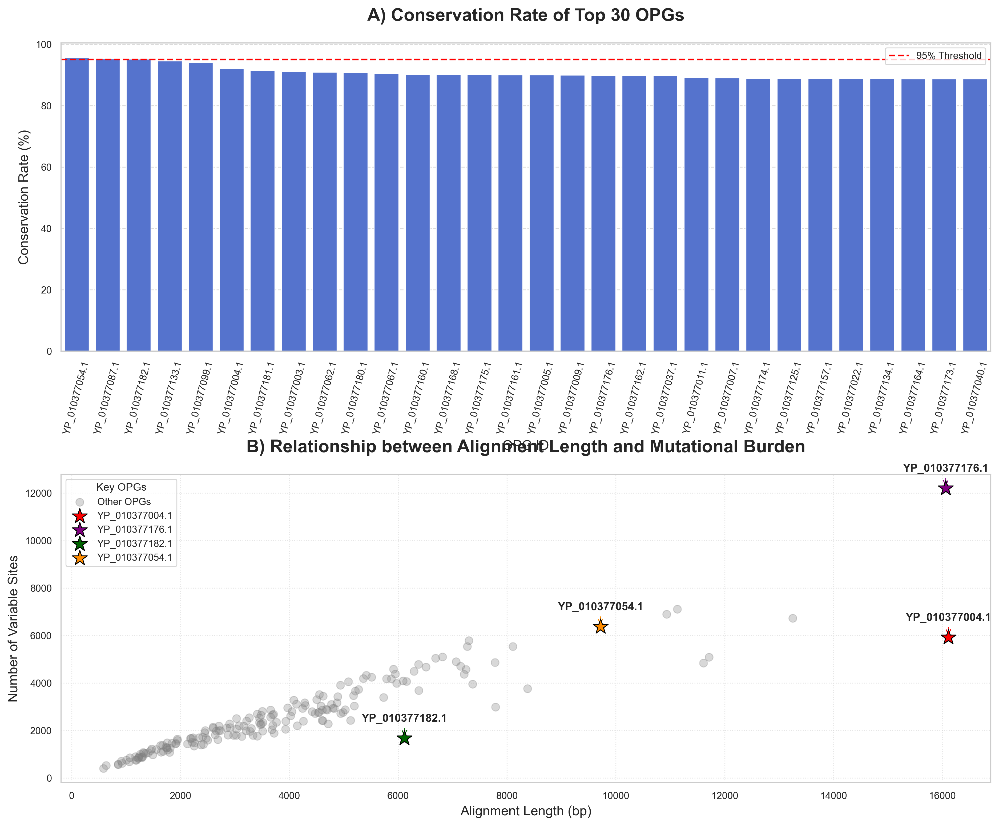

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# --- 기본 설정 ---
# 현재 작업 디렉토리 확인
current_dir = os.getcwd()
print(f"현재 작업 디렉토리: {current_dir}")

def plot_opg_analysis(data_file):
    """
    OPG 분석 결과를 논문 수준으로 시각화하는 함수 (수정 버전)
    """
    print(f"분석 파일: {data_file}")
    
    # 파일 존재 확인
    if not os.path.exists(data_file):
        print(f"오류: 파일을 찾을 수 없습니다: {data_file}")
        return
    
    # 데이터 읽기
    try:
        df = pd.read_csv(data_file)
        print(f"데이터 로드 완료: {len(df)}개 OPG 데이터")
    except Exception as e:
        print(f"데이터 읽기 오류: {e}")
        return
    
    # --- 그래프 스타일 및 폰트 설정 ---
    # 학술지 스타일에 맞게 Seaborn 테마와 폰트 설정
    sns.set_theme(style="whitegrid", context="paper")
    plt.rcParams['font.family'] = 'Arial'
    plt.rcParams['figure.dpi'] = 300
    
    # --- Figure 생성 (2행 1열 구조) ---
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 12))
    plt.subplots_adjust(hspace=0.4) # 그래프 간 세로 간격 조절

    # --- 그래프 1: OPG별 보존율 분포 (막대그래프) ---
    # 보존율이 높은 순으로 데이터 정렬하여 시각화
    df_sorted = df.sort_values('Conservation', ascending=False).head(30) # 상위 30개만 표시하여 가독성 확보

    sns.barplot(x='OPG', y='Conservation', data=df_sorted, ax=ax1, color='royalblue', dodge=False)
    ax1.set_title('A) Conservation Rate of Top 30 OPGs', fontsize=16, weight='bold', pad=20)
    ax1.set_ylabel('Conservation Rate (%)', fontsize=12)
    ax1.set_xlabel('OPG ID', fontsize=12)
    ax1.tick_params(axis='x', rotation=75) # x축 라벨이 길 경우 회전
    ax1.grid(True, axis='y', linestyle='--', alpha=0.7)

    # 95% 기준선 추가
    ax1.axhline(y=95, color='red', linestyle='--', linewidth=1.5, label='95% Threshold')
    ax1.legend()

    # --- 그래프 2: 정렬 길이와 변이 수의 관계 (산점도) ---
    # 전체 데이터를 배경으로 회색 점으로 표시
    ax2.scatter(df['Length'], df['Variables'], 
               alpha=0.3, 
               color='gray',
               s=50,
               label='Other OPGs')
    
    # ★★★ 수정된 부분 1: X축 라벨 변경 ★★★
    ax2.set_xlabel('Alignment Length (bp)', fontsize=12)
    ax2.set_ylabel('Number of Variable Sites', fontsize=12)
    ax2.set_title('B) Relationship between Alignment Length and Mutational Burden', fontsize=16, weight='bold', pad=20)
    
    # ★★★ 수정된 부분 2: 특정 OPG만 선택하여 라벨링 ★★★
    # 라벨을 표시할 핵심 OPG 목록 정의
    key_opgs_to_label = {
        'YP_010377004.1': 'red',       # 가장 긴 OPG
        'YP_010377176.1': 'purple',    # 변이가 가장 많은 OPG
        'YP_010377182.1': 'darkgreen', # 연구의 핵심 OPG
        'YP_010377054.1': 'darkorange' # 연구의 핵심 OPG
    }
    
    for opg_id, color in key_opgs_to_label.items():
        opg_data = df[df['OPG'] == opg_id]
        if not opg_data.empty:
            # 해당 OPG를 다른 색과 마커로 강조
            ax2.scatter(opg_data['Length'], opg_data['Variables'], 
                        color=color, 
                        s=200,          # 크기 키우기
                        marker='*',     # 마커 모양 변경
                        edgecolor='black',
                        zorder=5,       # 다른 점들 위로 보이게 설정
                        label=opg_id)
            
            # 해당 OPG에만 텍스트 라벨 추가
            ax2.annotate(opg_id, 
                         (opg_data['Length'].iloc[0], opg_data['Variables'].iloc[0]),
                         textcoords="offset points", 
                         xytext=(0,15), 
                         ha='center', 
                         fontsize=10, 
                         weight='bold',
                         arrowprops=dict(arrowstyle="->", color=color))

    ax2.grid(True, linestyle=':', alpha=0.5)
    ax2.legend(title='Key OPGs') # 범례 추가
    
    # --- 최종 저장 및 표시 ---
    # 결과가 저장될 디렉토리 경로 설정
    output_dir = os.path.dirname(data_file) if os.path.dirname(data_file) else '.'
    output_file = os.path.join(output_dir, 'opg_analysis_visualization_revised.png')
    
    plt.savefig(output_file, dpi=300, bbox_inches='tight')
    print(f"수정된 그래프 저장 완료: {output_file}")
    
    plt.show()

# --- 실행 부분 ---
# 분석할 파일 경로 설정
file_path = os.path.join("opg_analysis_results", "opg_analysis_summary_clade_all.csv")
print(f"사용할 파일 경로: {file_path}")

# 파일 존재 여부 확인 후 시각화 함수 실행
if os.path.exists(file_path):
    plot_opg_analysis(file_path)
else:
    print(f"오류: 파일을 찾을 수 없습니다. '{file_path}' 경로를 확인해주세요.")



현재 작업 디렉토리: /Users/hoon/Desktop/GRADUATE/code
사용할 파일 경로: opg_analysis_results/opg_analysis_summary_clade_all.csv
분석 파일: opg_analysis_results/opg_analysis_summary_clade_all.csv
데이터 로드 완료: 179개 OPG 데이터
수정된 그래프 저장 완료: opg_analysis_results/opg_analysis_visualization_final.png


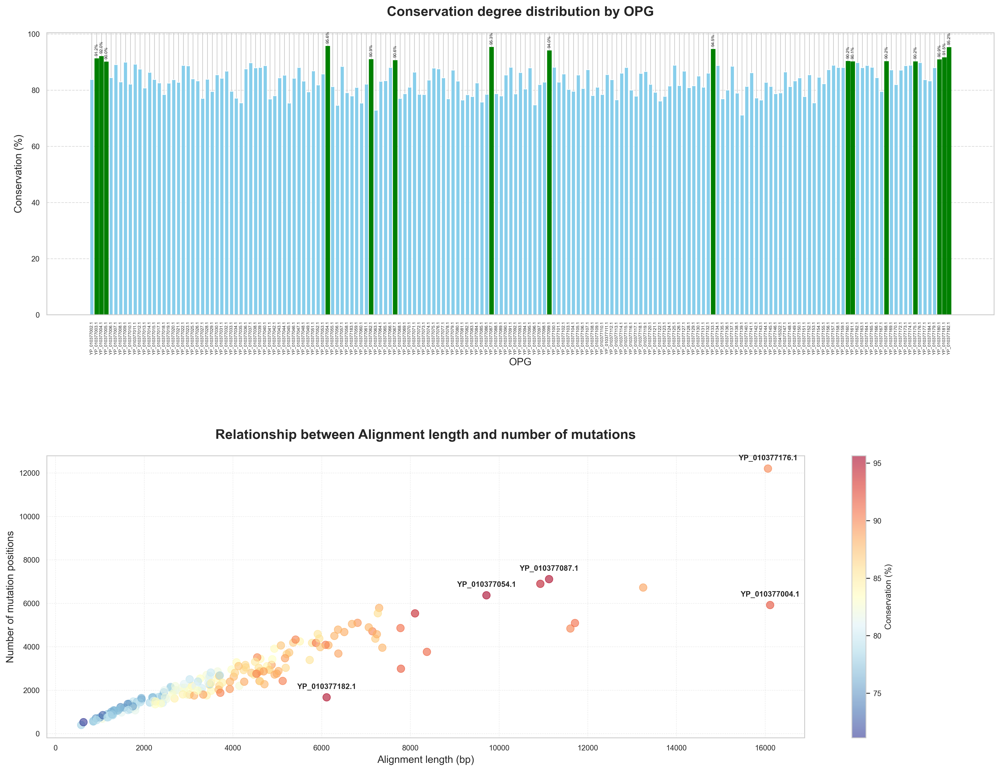

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# --- 기본 설정 ---
# 현재 작업 디렉토리 확인
current_dir = os.getcwd()
print(f"현재 작업 디렉토리: {current_dir}")

def plot_opg_analysis(data_file):
    """
    OPG 분석 결과를 논문 수준으로 시각화하는 함수 (최종 수정 버전)
    - 상단 그래프: 모든 OPG의 보존율을 막대그래프로 표시 (예시 그림 스타일 반영)
    - 하단 그래프: 특정 OPG만 강조하여 라벨링
    """
    print(f"분석 파일: {data_file}")
    
    # 파일 존재 확인
    if not os.path.exists(data_file):
        print(f"오류: 파일을 찾을 수 없습니다: {data_file}")
        return
    
    # 데이터 읽기
    try:
        df = pd.read_csv(data_file)
        print(f"데이터 로드 완료: {len(df)}개 OPG 데이터")
    except Exception as e:
        print(f"데이터 읽기 오류: {e}")
        return
    
    # --- 그래프 스타일 및 폰트 설정 ---
    sns.set_theme(style="whitegrid", context="paper")
    plt.rcParams['font.family'] = 'Arial'
    plt.rcParams['figure.dpi'] = 300
    
    # --- Figure 생성 (2행 1열 구조) ---
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 15)) # Figure 크기 조정
    plt.subplots_adjust(hspace=0.5) # 그래프 간 세로 간격 조절

    # --- 그래프 1: OPG별 보존율 분포 (막대그래프) ---
    # 예시 그림과 같이 모든 OPG를 표시
    bars = ax1.bar(df['OPG'], df['Conservation'], color='skyblue', width=0.8)
    ax1.set_title('Conservation degree distribution by OPG', fontsize=16, weight='bold', pad=20)
    ax1.set_ylabel('Conservation (%)', fontsize=12)
    ax1.set_xlabel('OPG', fontsize=12)
    
    # X축 라벨이 너무 많으므로, 겹치지 않게 회전시키고 폰트 크기 조절
    ax1.tick_params(axis='x', rotation=90, labelsize=5)
    
    # 90% 이상 보존된 OPG는 녹색으로 강조 (예시 그림 반영)
    for i, bar in enumerate(bars):
        if df['Conservation'].iloc[i] >= 90:
            bar.set_color('green')
            # 값 라벨 추가 (90% 이상만)
            yval = bar.get_height()
            ax1.text(bar.get_x() + bar.get_width()/2.0, yval + 1, f'{yval:.1f}%', ha='center', va='bottom', fontsize=5, rotation=90)

    ax1.grid(True, axis='y', linestyle='--', alpha=0.7)


    # --- 그래프 2: 정렬 길이와 변이 수의 관계 (산점도) ---
    # 전체 데이터를 배경으로 표시. 보존율에 따라 색상 매핑
    scatter_plot = ax2.scatter(df['Length'], df['Variables'], 
                               alpha=0.6, 
                               c=df['Conservation'],
                               cmap='RdYlBu_r', # 예시 그림과 유사한 색상 맵
                               s=80)
    
    # 컬러바 추가
    cbar = plt.colorbar(scatter_plot, ax=ax2)
    cbar.set_label('Conservation (%)', fontsize=10)
    
    # ★★★ 수정된 부분 1: X축 라벨 변경 ★★★
    ax2.set_xlabel('Alignment length (bp)', fontsize=12)
    ax2.set_ylabel('Number of mutation positions', fontsize=12)
    ax2.set_title('Relationship between Alignment length and number of mutations', fontsize=16, weight='bold', pad=20)
    
    # ★★★ 수정된 부분 2: 특정 OPG만 선택하여 라벨링 ★★★
    # 라벨을 표시할 핵심 OPG 목록 정의
    key_opgs_to_label = [
        'YP_010377004.1', # 가장 긴 OPG
        'YP_010377176.1', # 변이가 가장 많은 OPG
        'YP_010377182.1', # 연구의 핵심 OPG 1
        'YP_010377054.1', # 연구의 핵심 OPG 2
        'YP_010377087.1'  # 연구의 핵심 OPG 3
    ]
    
    for opg_id in key_opgs_to_label:
        opg_data = df[df['OPG'] == opg_id]
        if not opg_data.empty:
            # 텍스트 라벨 추가
            ax2.annotate(opg_id, 
                         (opg_data['Length'].iloc[0], opg_data['Variables'].iloc[0]),
                         textcoords="offset points", 
                         xytext=(0,10), 
                         ha='center', 
                         fontsize=9, 
                         weight='bold')

    ax2.grid(True, linestyle=':', alpha=0.5)
    
    # --- 최종 저장 및 표시 ---
    output_dir = os.path.dirname(data_file) if os.path.dirname(data_file) else '.'
    output_file = os.path.join(output_dir, 'opg_analysis_visualization_final.png')
    
    plt.savefig(output_file, dpi=300, bbox_inches='tight')
    print(f"수정된 그래프 저장 완료: {output_file}")
    
    plt.show()

# --- 실행 부분 ---
# 분석할 파일 경로 설정
file_path = os.path.join("opg_analysis_results", "opg_analysis_summary_clade_all.csv")
print(f"사용할 파일 경로: {file_path}")

# 파일 존재 여부 확인 후 시각화 함수 실행
if os.path.exists(file_path):
    plot_opg_analysis(file_path)
else:
    print(f"오류: 파일을 찾을 수 없습니다. '{file_path}' 경로를 확인해주세요.")



In [8]:
import os
from Bio import AlignIO
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- 기본 설정 ---
# 결과 그림을 저장할 디렉토리
output_fig_dir = "publication_figures"
os.makedirs(output_fig_dir, exist_ok=True)

# 그래프 전반에 적용할 스타일
sns.set_theme(style="whitegrid", context="paper")
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['figure.dpi'] = 300

## ------------------------------------------------------------------
## 1. 분석 대상 파일 경로 설정 (★★★★★ 가장 중요한 부분 ★★★★★)
## ------------------------------------------------------------------
# 1번 분석 코드에서 생성된 YP_010377004.1의 정렬(aligned) fasta 파일 경로를 지정해야 합니다.
# 파일이 opg_analysis_results 폴더에 있다고 가정합니다.
alignment_file_path = os.path.join("opg_analysis_results", "YP_010377004.1_aligned.fasta")
## ------------------------------------------------------------------


def analyze_and_visualize_conservation_distribution(align_file, opg_id):
    """
    특정 OPG의 각 위치별 보존 점수 분포를 분석하고 시각화합니다.
    """
    print(f"--- {opg_id} 분석 시작 ---")
    
    # --- 데이터 분석 ---
    try:
        alignment = AlignIO.read(align_file, "fasta")
    except FileNotFoundError:
        print(f"오류: 정렬 파일을 찾을 수 없습니다 - {align_file}")
        return

    per_position_scores = []
    alignment_length = alignment.get_alignment_length()

    # 각 위치(column)를 순회하며 보존 점수 계산
    for i in range(alignment_length):
        column = alignment[:, i]
        bases = [base for base in column if base != '-'] # 갭(gap) 제외
        
        if not bases:
            # 해당 열이 모두 갭인 경우 보존 점수를 0으로 처리 (또는 무시)
            continue
            
        # 가장 흔한 염기(most common base)의 빈도 계산
        most_common_base = max(set(bases), key=bases.count)
        conservation_score = bases.count(most_common_base) / len(bases)
        per_position_scores.append(conservation_score)

    scores = np.array(per_position_scores)
    
    # 100% 완벽하게 보존된 위치와 그렇지 않은 위치 분리
    perfectly_conserved = scores[scores == 1.0]
    variable_positions = scores[scores < 1.0]
    
    print(f"분석 완료:")
    print(f" - 전체 분석 위치: {len(scores)}개")
    print(f" - 완벽히 보존된 위치 (100%): {len(perfectly_conserved)}개")
    print(f" - 변이가 있는 위치 (<100%): {len(variable_positions)}개 (기존 분석의 'Number of mutation positions'에 해당)")
    print(f" - 전체 평균 보존율: {scores.mean() * 100:.2f}% (기존 분석의 'Conservation'과 일치해야 함)")
    if len(variable_positions) > 0:
        print(f" - ★ 변이 위치들만의 평균 보존율: {variable_positions.mean() * 100:.2f}% ★")

    # --- 시각화 ---
    fig, ax = plt.subplots(figsize=(12, 7))

    # 변이가 있는 위치들의 보존 점수 분포를 히스토그램으로 표시
    sns.histplot(variable_positions, bins=50, ax=ax, color='skyblue', 
                 label=f'Variable Positions (n={len(variable_positions)})', stat='count')

    # 완벽하게 보존된 위치는 별도의 막대로 강조하여 표시
    ax.bar(1.0, len(perfectly_conserved), width=0.01, color='forestgreen',
           label=f'Perfectly Conserved (n={len(perfectly_conserved)})')

    # 그래프 제목 및 라벨 설정
    ax.set_title(f'Per-Position Conservation Score Distribution for {opg_id}', fontsize=16, weight='bold')
    ax.set_xlabel('Per-Position Conservation Score', fontsize=12)
    ax.set_ylabel('Number of Positions', fontsize=12)
    
    # 평균값 등 주요 통계 정보 텍스트로 추가
    text_str = (
        f"Overall Mean Conservation: {scores.mean()*100:.2f}%\n"
        f"Mean Conservation of Variable Positions: {variable_positions.mean()*100:.2f}%"
    )
    ax.text(0.05, 0.95, text_str, transform=ax.transAxes, fontsize=12,
            verticalalignment='top', bbox=dict(boxstyle='round,pad=0.5', fc='wheat', alpha=0.5))

    ax.legend()
    ax.set_xlim(left=min(variable_positions.min(), 0.8) - 0.05, right=1.05) # X축 범위 조절

    plt.tight_layout()
    fig_path = os.path.join(output_fig_dir, f"{opg_id}_conservation_distribution.png")
    plt.savefig(fig_path)
    plt.close()
    print(f"시각화 결과 저장 완료: {fig_path}")


# --- 메인 실행 부분 ---
if __name__ == "__main__":
    if os.path.exists(alignment_file_path):
        analyze_and_visualize_conservation_distribution(
            align_file=alignment_file_path,
            opg_id='YP_010377004.1'
        )
    else:
        print(f"오류: 분석할 파일을 찾을 수 없습니다. '{alignment_file_path}' 경로를 확인해주세요.")



--- YP_010377004.1 분석 시작 ---
분석 완료:
 - 전체 분석 위치: 16113개
 - 완벽히 보존된 위치 (100%): 10195개
 - 변이가 있는 위치 (<100%): 5918개 (기존 분석의 'Number of mutation positions'에 해당)
 - 전체 평균 보존율: 92.02% (기존 분석의 'Conservation'과 일치해야 함)
 - ★ 변이 위치들만의 평균 보존율: 78.28% ★
시각화 결과 저장 완료: publication_figures/YP_010377004.1_conservation_distribution.png


In [12]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import os

# --- 기본 설정 ---
# 결과 그림을 저장할 디렉토리
output_fig_dir = "publication_figures"
os.makedirs(output_fig_dir, exist_ok=True)

# 그래프 전반에 적용할 스타일 설정
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['figure.dpi'] = 300
plt.rcParams['text.color'] = '#333333'
plt.rcParams['axes.labelcolor'] = '#333333'
plt.rcParams['xtick.color'] = '#333333'
plt.rcParams['ytick.color'] = '#333333'

def plot_final_conceptual_figure():
    """
    '변이 위치'와 '보존율'의 개념적 차이를 명확히 보여주는 최종 Supplementary Figure를 생성합니다.
    """
    print("Supplementary Figure (개선판) 생성 중...")
    fig = plt.figure(figsize=(14, 8))
    gs = gridspec.GridSpec(2, 2, height_ratios=[1, 1.2])

    # --- A. 가상의 다중 서열 정렬 (Raw Data) ---
    ax_a = fig.add_subplot(gs[0, :])
    ax_a.set_title("A) Example of a Multiple Sequence Alignment (10 sequences)", fontsize=16, weight='bold', pad=15)

    sequences = [
        "A C G T A C",
        "A C G T A C",
        "A C G T A C",
        "A C G T A C",
        "A C G T A C",
        "G C G T A C",
        "G C G T A C",
        "G C G T A C",
        "G C G T A C",
        "G C G T T C" # Position 3과 5에 추가 변이
    ]

    # 서열 텍스트 표시
    ax_a.text(0.5, 0.5, "\n".join(sequences), ha='center', va='center', fontsize=16,
              family='monospace', bbox=dict(boxstyle="round,pad=1", fc="#f0f0f0", ec="none"))

    # 분석할 위치 강조
    # Position 1
    rect1 = plt.Rectangle((0.23, 0.05), 0.05, 0.9, fill=False, edgecolor='royalblue', lw=2, linestyle='--')
    ax_a.add_patch(rect1)
    ax_a.text(0.255, 1.0, "Position 1", ha='center', va='bottom', fontsize=12, color='royalblue', weight='bold')
    # Position 5
    rect2 = plt.Rectangle((0.71, 0.05), 0.05, 0.9, fill=False, edgecolor='crimson', lw=2, linestyle='--')
    ax_a.add_patch(rect2)
    ax_a.text(0.735, 1.0, "Position 5", ha='center', va='bottom', fontsize=12, color='crimson', weight='bold')
    
    ax_a.axis('off')

    # --- B. 위치 1 분석 ---
    ax_b = fig.add_subplot(gs[1, 0])
    ax_b.set_title("B) Analysis of Position 1", fontsize=14, weight='bold')
    
    bases = ['A', 'G']
    counts = [5, 5]
    colors = ['royalblue', 'darkorange']
    bars = ax_b.bar(bases, counts, color=colors, width=0.6, ec='black')
    ax_b.set_ylabel("Base Count", fontsize=12)
    ax_b.set_ylim(0, 10)
    ax_b.bar_label(bars, fontsize=12)

    # 설명 텍스트
    text_b = (
        "**1. Is it a Mutation Position?**\n"
        "-> **YES**. Not all bases are identical.\n\n"
        "**2. What is its Conservation Score?**\n"
        "Most common base ('A' or 'G') appears 5/10 times.\n"
        "-> **Score = 50%** (Low Conservation)"
    )
    ax_b.text(0.5, -0.4, text_b, ha='center', va='top', transform=ax_b.transAxes, fontsize=11,
              bbox=dict(boxstyle="round,pad=0.5", fc="#eef", ec="gray"))


    # --- C. 위치 5 분석 ---
    ax_c = fig.add_subplot(gs[1, 1])
    ax_c.set_title("C) Analysis of Position 5", fontsize=14, weight='bold')

    bases_c = ['A', 'T']
    counts_c = [9, 1]
    colors_c = ['mediumseagreen', 'crimson']
    bars_c = ax_c.bar(bases_c, counts_c, color=colors_c, width=0.6, ec='black')
    ax_c.set_ylabel("Base Count", fontsize=12)
    ax_c.set_ylim(0, 10)
    ax_c.bar_label(bars_c, fontsize=12)

    # 설명 텍스트
    text_c = (
        "**1. Is it a Mutation Position?**\n"
        "-> **YES**. Not all bases are identical.\n\n"
        "**2. What is its Conservation Score?**\n"
        "Most common base ('A') appears 9/10 times.\n"
        "-> **Score = 90%** (High Conservation)"
    )
    ax_c.text(0.5, -0.4, text_c, ha='center', va='top', transform=ax_c.transAxes, fontsize=11,
              bbox=dict(boxstyle="round,pad=0.5", fc="#fee", ec="gray"))

    # --- 최종 그림 정리 및 저장 ---
    fig.suptitle("Visual Explanation: How 'Number of Mutation Positions' and 'Overall Conservation' Coexist",
                 fontsize=18, weight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    fig_path = os.path.join(output_fig_dir, "Supplementary_Fig_Concept_Explanation.png")
    plt.savefig(fig_path)
    plt.close()
    print(f"Supplementary Figure (개선판) 저장 완료: {fig_path}")


# --- 메인 실행 부분 ---
if __name__ == "__main__":
    plot_final_conceptual_figure()



Supplementary Figure (개선판) 생성 중...
Supplementary Figure (개선판) 저장 완료: publication_figures/Supplementary_Fig_Concept_Explanation.png


데이터 로딩 시작: mpxv_clade_specific_analysis/clade1b_specific_OPGs_relative.csv
데이터 로드 완료: 60 OPGs
데이터 준비 완료: 'Specificity' 점수 계산 및 데이터 정제 완료
그래프 저장 완료: publication_figures/clade1b_specificity_vs_conservation_final.png


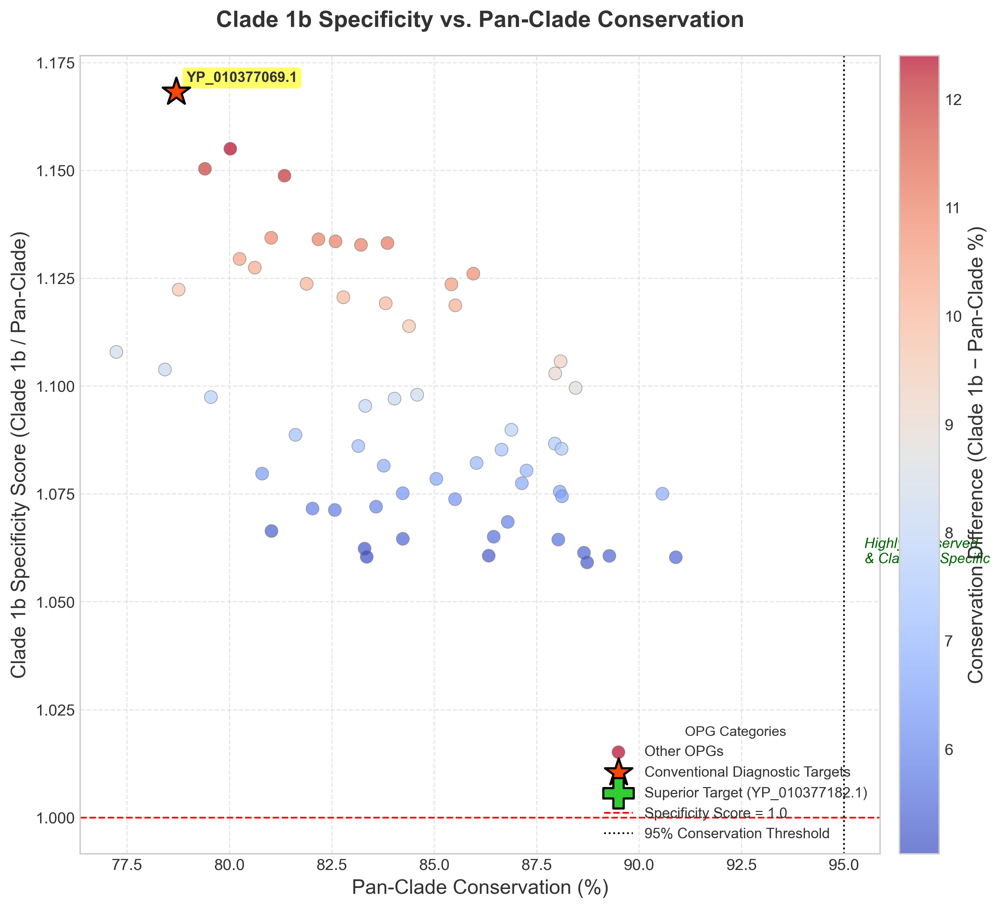

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os

# --- 1. 설정: 스타일, 경로, 타겟 OPG 정의 ---

# 논문 품질의 그래프를 위한 스타일 설정
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial'],
    'font.size': 12,
    'axes.titlesize': 16,
    'axes.labelsize': 14,
    'xtick.labelsize': 11,
    'ytick.labelsize': 11,
    'legend.fontsize': 10,
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'savefig.bbox': 'tight'
})

# 분석할 파일 경로 (사용자가 알려준 정확한 경로)
CLADE1B_FILE_PATH = "mpxv_clade_specific_analysis/clade1b_specific_OPGs_relative.csv"
OUTPUT_DIR = "publication_figures"

# 그래프에서 강조할 OPG 목록
DIAGNOSTIC_TARGETS = ['YP_010377048.1', 'YP_010377069.1', 'YP_010377054.1']
SUPERIOR_TARGET = 'YP_010377182.1'
ALL_HIGHLIGHTED_OPGS = DIAGNOSTIC_TARGETS + [SUPERIOR_TARGET]

# 강조 시각화 스타일
DIAGNOSTIC_COLOR = '#FF4500'  # 주황-빨강 (기존 타겟)
SUPERIOR_COLOR = '#32CD32'   # 라임 그린 (새 타겟)
EDGE_COLOR = '#000000'       # 검정 테두리

# --- 2. 데이터 로딩 및 준비 함수 ---

def load_and_prepare_data(filepath):
    """
    지정된 경로에서 Clade 1b 분석 데이터를 로드하고 'Specificity' 점수를 계산합니다.
    """
    print(f"데이터 로딩 시작: {filepath}")
    
    # 출력 디렉토리 생성
    os.makedirs(OUTPUT_DIR, exist_ok=True)

    try:
        # CSV 파일 로드
        df = pd.read_csv(filepath)
        print(f"데이터 로드 완료: {len(df)} OPGs")
    except FileNotFoundError:
        print(f"오류: 파일을 찾을 수 없습니다 -> '{filepath}'")
        print("파일 경로와 실행 위치를 다시 확인해주세요.")
        return None

    # 'Specificity' 점수 계산 (Clade 1b 보존율 / Pan-clade 보존율)
    # 0으로 나누는 오류를 방지하기 위해 안전한 나눗셈 적용
    df['Specificity'] = df.apply(
        lambda row: row['Conservation_clade1b'] / row['Conservation_all_clades'] 
                    if row['Conservation_all_clades'] > 0 else 1.0,
        axis=1
    )
    
    # NaN이나 inf 값이 있는 행은 분석에서 제외하여 오류 방지
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    df.dropna(subset=['Conservation_all_clades', 'Specificity'], inplace=True)
    
    print("데이터 준비 완료: 'Specificity' 점수 계산 및 데이터 정제 완료")
    return df

# --- 3. 그래프 생성 함수 ---

def create_final_plot(data):
    """
    준비된 데이터를 사용하여 최종 Clade 1b 특이성 산점도 그래프를 생성하고 저장합니다.
    """
    if data is None:
        print("데이터가 없어 그래프 생성을 건너뜁니다.")
        return

    fig, ax = plt.subplots(figsize=(12, 10))

    # 하이라이트할 OPG와 나머지 OPG 데이터 분리
    highlight_mask = data['OPG'].isin(ALL_HIGHLIGHTED_OPGS)
    other_opgs = data[~highlight_mask]
    highlighted_opgs = data[highlight_mask]

    # 1. 나머지 OPG들(배경) 플로팅
    scatter = ax.scatter(
        other_opgs['Conservation_all_clades'],
        other_opgs['Specificity'],
        c=other_opgs['conservation_difference'],
        cmap='coolwarm', # 파랑(음수)-빨강(양수) 색상 맵
        s=80,
        alpha=0.7,
        edgecolors='grey',
        linewidth=0.5,
        label='Other OPGs'
    )

    # 2. 강조할 OPG들 플로팅
    # 기존 진단 타겟 (별 모양)
    diagnostic_data = highlighted_opgs[highlighted_opgs['OPG'].isin(DIAGNOSTIC_TARGETS)]
    ax.scatter(
        diagnostic_data['Conservation_all_clades'],
        diagnostic_data['Specificity'],
        color=DIAGNOSTIC_COLOR,
        s=400,
        marker='*',
        edgecolors=EDGE_COLOR,
        linewidth=1.5,
        label='Conventional Diagnostic Targets',
        zorder=10
    )

    # 새로운 우수 타겟 (십자 모양)
    superior_data = highlighted_opgs[highlighted_opgs['OPG'] == SUPERIOR_TARGET]
    ax.scatter(
        superior_data['Conservation_all_clades'],
        superior_data['Specificity'],
        color=SUPERIOR_COLOR,
        s=450,
        marker='P', # 'Plus' 마커
        edgecolors=EDGE_COLOR,
        linewidth=1.5,
        label=f'Superior Target ({SUPERIOR_TARGET})',
        zorder=11
    )

    # 3. 각 하이라이트 OPG에 이름표(annotation) 추가
    for _, row in highlighted_opgs.iterrows():
        ax.annotate(
            row['OPG'],
            (row['Conservation_all_clades'], row['Specificity']),
            xytext=(7, 7),
            textcoords='offset points',
            fontsize=10,
            fontweight='bold',
            bbox=dict(boxstyle='round,pad=0.3', fc='yellow', alpha=0.6)
        )

    # --- 4. 그래프 스타일링 ---
    ax.set_title('Clade 1b Specificity vs. Pan-Clade Conservation', fontweight='bold', pad=20)
    ax.set_xlabel('Pan-Clade Conservation (%)')
    ax.set_ylabel('Clade 1b Specificity Score (Clade 1b / Pan-Clade)')

    # 기준선 추가
    ax.axhline(y=1.0, color='red', linestyle='--', linewidth=1.2, label='Specificity Score = 1.0')
    ax.axvline(x=95, color='black', linestyle=':', linewidth=1.2, label='95% Conservation Threshold')

    ax.grid(True, linestyle='--', alpha=0.5)
    ax.legend(loc='lower right', title='OPG Categories')
    
    # 컬러바 추가
    cbar = fig.colorbar(scatter, ax=ax, pad=0.02)
    cbar.set_label('Conservation Difference (Clade 1b − Pan-Clade %)')
    
    # "고도로 보존되고 특이적인" 영역 텍스트 추가
    ax.text(95.5, ax.get_ylim()[1] * 0.9, 'Highly Conserved\n& Clade 1b Specific', 
            fontsize=10, style='italic', color='darkgreen', ha='left')

    # --- 5. 파일 저장 ---
    output_file = os.path.join(OUTPUT_DIR, "clade1b_specificity_vs_conservation_final.png")
    plt.savefig(output_file)
    print(f"그래프 저장 완료: {output_file}")
    plt.show()

# --- 6. 메인 실행 부분 ---

def main():
    """메인 실행 함수"""
    # 데이터 로드 및 준비
    processed_data = load_and_prepare_data(CLADE1B_FILE_PATH)
    # 그래프 생성
    create_final_plot(processed_data)

if __name__ == "__main__":
    main()


In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# --- 1. 설정 ---
# 결과 파일을 저장할 디렉토리 생성
output_fig_dir = "publication_figures"
os.makedirs(output_fig_dir, exist_ok=True)

# 분석할 데이터 파일 경로 (1번 분석 코드의 결과물)
# This assumes the input file exists. If not, the script will exit.
summary_file = os.path.join("opg_analysis_results", "opg_analysis_summary_clade_all.csv")

# 그래프 전반에 적용할 스타일 설정
sns.set_theme(style="whitegrid", context="paper")
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['figure.dpi'] = 300

# --- 2. 비교 대상 타겟 OPG 목록 정의 ---
# PDF에 명시된 기존 타겟 OPG 목록입니다.
# 이 목록은 연구 목적에 맞게 자유롭게 수정하거나 추가할 수 있습니다.
# 여기에 연구에서 최종적으로 찾은 우수 타겟도 비교를 위해 추가합니다.
target_opgs_to_compare = {
    'YP_010377054.1': 'Previously High-Conserved',
    'YP_010377048.1': 'Commonly Used Target (Example 1)',
    'YP_010377069.1': 'Commonly Used Target (Example 2)',
    'YP_010377182.1': 'Our Superior Target' # 우리 연구에서 찾은 타겟
}

# --- 3. 데이터 로드 ---
try:
    df = pd.read_csv(summary_file)
    print(f"성공: '{summary_file}' 파일을 로드했습니다. (총 {len(df)}개 OPG)")
except FileNotFoundError:
    print(f"오류: '{summary_file}' 파일을 찾을 수 없습니다. 경로를 확인하세요.")
    exit()

# 비교할 타겟들의 데이터 추출
target_data = df[df['OPG'].isin(target_opgs_to_compare.keys())].copy()
if len(target_data) != len(target_opgs_to_compare):
    print("경고: 일부 타겟 OPG가 데이터 파일에 없습니다. 목록을 확인하세요.")

# --- 4. Figure 4 생성 ---
def create_new_figure_4(full_df, target_df):
    """
    새로운 Figure 4: 기존 타겟과 신규 타겟의 보존성을 비교 시각화합니다.
    - 상단: 보존율 분포 히스토그램 + 타겟 위치 표시
    - 하단: 길이 vs 보존율 산점도 + 타겟 위치 표시
    """
    print("새로운 Figure 4 생성 중...")
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 12)) # 2행 1열로 변경

    # --- 색상 매핑 정의 ---
    # 각 OPG에 고유한 색상을 할당하여 A와 B 그래프에서 일관성을 유지합니다.
    opg_ids = list(target_opgs_to_compare.keys())
    defined_colors = ['orangered', 'purple', 'brown', 'green']
    # Create a dictionary mapping each OPG ID to a specific color
    color_map = {opg_id: defined_colors[i] for i, opg_id in enumerate(opg_ids)}

    # --- 상단 그래프: 보존율 분포 히스토그램 ---
    sns.histplot(data=full_df, x='Conservation', bins=30, kde=True, ax=ax1, color='lightblue')
    ax1.set_title('A) Distribution of OPG Conservation Levels with Key Targets', fontsize=14, weight='bold')
    ax1.set_xlabel('Conservation Rate (%)', fontsize=12)
    ax1.set_ylabel('Number of OPGs', fontsize=12)

    # 타겟 OPG 위치를 수직선으로 표시 (매핑된 색상 사용)
    for opg_id, desc in target_opgs_to_compare.items():
        row = target_df[target_df['OPG'] == opg_id]
        if not row.empty:
            conservation_val = row['Conservation'].iloc[0]
            # Use the color from our map for the vertical line
            ax1.axvline(x=conservation_val, color=color_map[opg_id], linestyle='--', linewidth=1.5,
                        label=f"{opg_id}: {conservation_val:.1f}%")

    ax1.legend(title='Target OPGs', fontsize=9)

    # --- 하단 그래프: 길이 vs 보존율 산점도 ---
    # 전체 OPG를 배경으로 플롯
    sns.scatterplot(data=full_df, x='Length', y='Conservation', ax=ax2,
                    alpha=0.3, color='gray', label='All Other OPGs')

    # 타겟 OPG를 별 모양으로 강조하여 플롯 (매핑된 색상 사용)
    # Pass the color_map dictionary to the 'palette' argument
    sns.scatterplot(data=target_df, x='Length', y='Conservation', ax=ax2,
                    marker='*', s=400, hue='OPG', palette=color_map,
                    edgecolor='black', style='OPG', markers=['*', '*', '*', 'P'], zorder=5)

    ax2.set_title('B) Relationship Between OPG Length and Conservation', fontsize=14, weight='bold')
    ax2.set_xlabel('Alignment Length (bp)', fontsize=12)
    ax2.set_ylabel('Conservation Rate (%)', fontsize=12)
    
    # 95% 기준선 추가
    ax2.axhline(y=95, color='red', linestyle=':', linewidth=1.5, label='95% Threshold')
    
    # 범례 정리
    handles, labels = ax2.get_legend_handles_labels()
    # 'OPG'라는 범례 제목을 제거하고 필요한 것만 남김
    ax2.legend(handles=handles[1:], labels=labels[1:], title='Key Targets', fontsize=9)


    plt.tight_layout(h_pad=3.0) # 그래프 간 간격 조절
    fig_path = os.path.join(output_fig_dir, "Figure_4_Target_Comparison.png")
    plt.savefig(fig_path)
    plt.close()
    print(f"새로운 Figure 4 저장 완료: {fig_path}")


# --- 5. 코드 실행 ---
if __name__ == "__main__":
    # Check if target_data is not empty before creating the figure
    if not target_data.empty:
        create_new_figure_4(df, target_data)
        print("\nFigure 4 생성이 완료되었습니다.")
    else:
        print("\n비교할 타겟 데이터가 없어 Figure 4를 생성하지 않았습니다.")


성공: 'opg_analysis_results/opg_analysis_summary_clade_all.csv' 파일을 로드했습니다. (총 179개 OPG)
새로운 Figure 4 생성 중...
새로운 Figure 4 저장 완료: publication_figures/Figure_4_Target_Comparison.png

Figure 4 생성이 완료되었습니다.


데이터 로드 완료: ≥95%_conserved_opgs_clade1b.csv
새로운 Figure 5 저장 완료: publication_figures/Figure_5_Clade1b_Top_OPGs.png


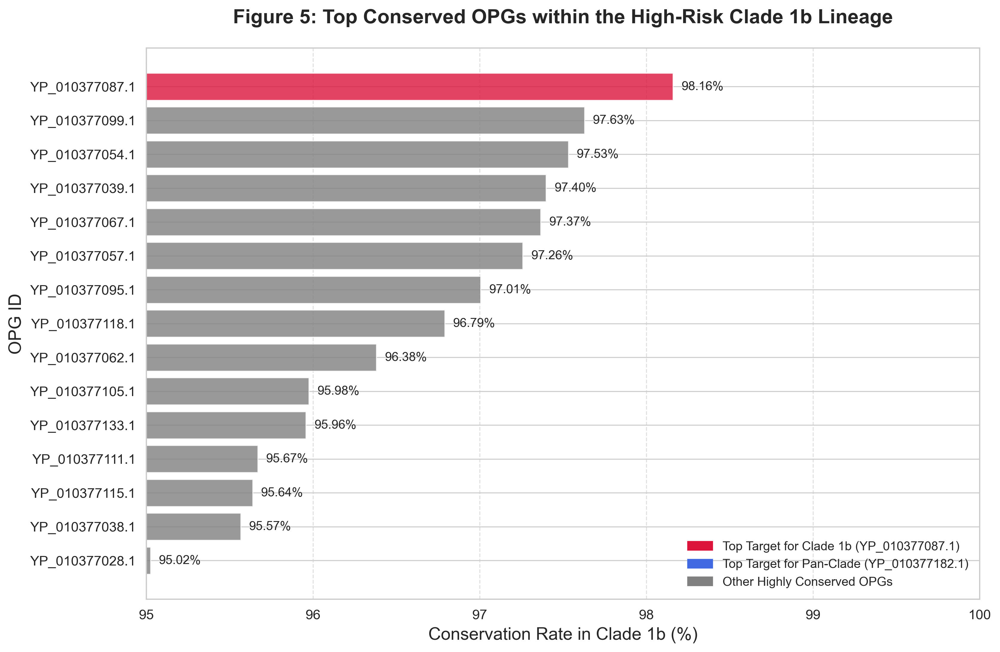

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# --- 1. 설정: 스타일, 파일 경로, 타겟 OPG 정의 ---

# 논문 품질의 그래프를 위한 스타일 설정
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial'],
    'font.size': 12,
    'axes.titlesize': 16,
    'axes.labelsize': 14,
    'xtick.labelsize': 11,
    'ytick.labelsize': 11,
    'legend.fontsize': 10,
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'savefig.bbox': 'tight'
})

# Clade 1b 분석 데이터 파일 경로
CLADE1B_DATA_PATH = "≥95%_conserved_opgs_clade1b.csv"
OUTPUT_DIR = "publication_figures"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# 그래프에서 강조할 OPG
PAN_CLADE_TARGET = 'YP_010377182.1'
CLADE_1B_TARGET = 'YP_010377087.1'

# --- 2. 데이터 로딩 및 준비 ---

try:
    # Clade 1b에서 95% 이상 보존된 OPG 목록 로드
    df_clade1b = pd.read_csv(CLADE1B_DATA_PATH)
    # 보존율(Conservation) 기준으로 내림차순 정렬
    df_clade1b_sorted = df_clade1b.sort_values('Conservation', ascending=False)
    print(f"데이터 로드 완료: {CLADE1B_DATA_PATH}")
except FileNotFoundError:
    print(f"오류: 파일을 찾을 수 없습니다 -> '{CLADE1B_DATA_PATH}'")
    df_clade1b_sorted = None

# --- 3. Figure 5 생성 ---

if df_clade1b_sorted is not None:
    fig, ax = plt.subplots(figsize=(12, 8))

    # 각 OPG에 대한 색상 리스트 생성
    bar_colors = []
    for opg in df_clade1b_sorted['OPG']:
        if opg == CLADE_1B_TARGET:
            bar_colors.append('crimson')  # Clade 1b 최고 타겟은 진홍색
        elif opg == PAN_CLADE_TARGET:
            bar_colors.append('royalblue') # Pan-clade 최고 타겟은 파란색
        else:
            bar_colors.append('grey')      # 나머지는 회색

    # 수평 막대그래프 생성
    bars = ax.barh(
        df_clade1b_sorted['OPG'],
        df_clade1b_sorted['Conservation'],
        color=bar_colors,
        alpha=0.8
    )

    # 막대 끝에 보존율(%) 텍스트 추가
    for bar in bars:
        width = bar.get_width()
        ax.text(width + 0.05, bar.get_y() + bar.get_height()/2.,
                f'{width:.2f}%',
                ha='left', va='center', fontsize=10)

    # --- 4. 그래프 스타일링 ---
    ax.set_title('Figure 5: Top Conserved OPGs within the High-Risk Clade 1b Lineage', fontweight='bold', pad=20)
    ax.set_xlabel('Conservation Rate in Clade 1b (%)')
    ax.set_ylabel('OPG ID')
    ax.set_xlim(95, 100) # x축 범위를 95%~100%로 설정하여 차이 강조
    ax.invert_yaxis() # 가장 높은 값이 위로 오도록 y축 순서 뒤집기
    ax.grid(axis='x', linestyle='--', alpha=0.6)

    # 범례(Legend) 생성
    legend_patches = [
        plt.Rectangle((0,0),1,1, color='crimson', label=f'Top Target for Clade 1b ({CLADE_1B_TARGET})'),
        plt.Rectangle((0,0),1,1, color='royalblue', label=f'Top Target for Pan-Clade ({PAN_CLADE_TARGET})'),
        plt.Rectangle((0,0),1,1, color='grey', label='Other Highly Conserved OPGs')
    ]
    ax.legend(handles=legend_patches, loc='lower right')

    # --- 5. 파일 저장 ---
    output_file = os.path.join(OUTPUT_DIR, "Figure_5_Clade1b_Top_OPGs.png")
    plt.savefig(output_file)
    print(f"새로운 Figure 5 저장 완료: {output_file}")
    plt.show()



데이터 로드 완료: opg_analysis_results/opg_analysis_summary_clade_all.csv
수정된 Figure 1 저장 완료: publication_figures/Figure1_Top_Conserved_OPGs_Revised.png


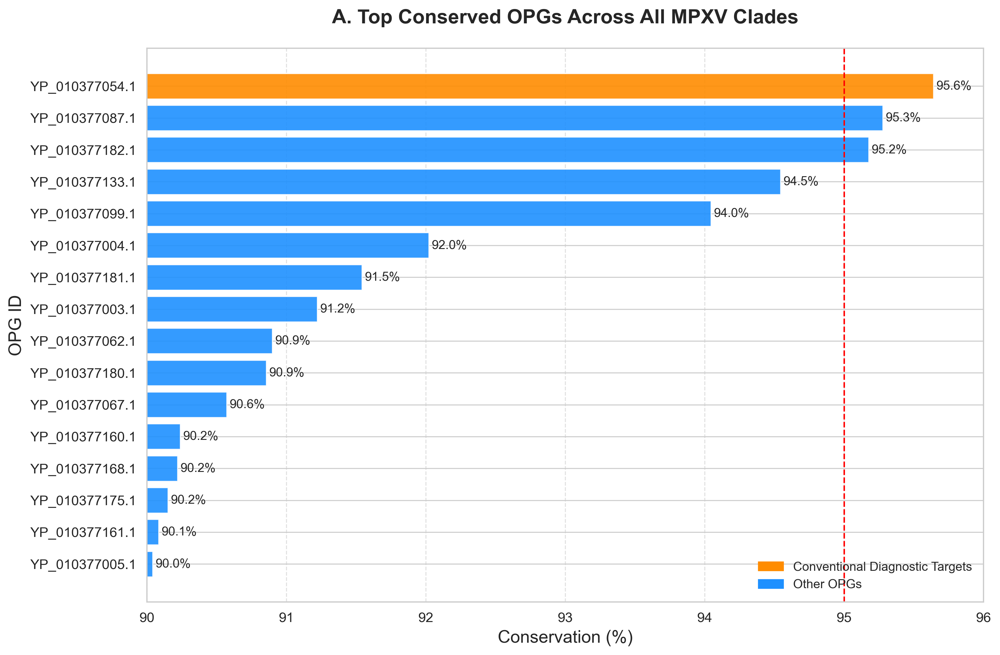

수정된 Figure 2 저장 완료: publication_figures/Figure2_Distribution_Revised.png


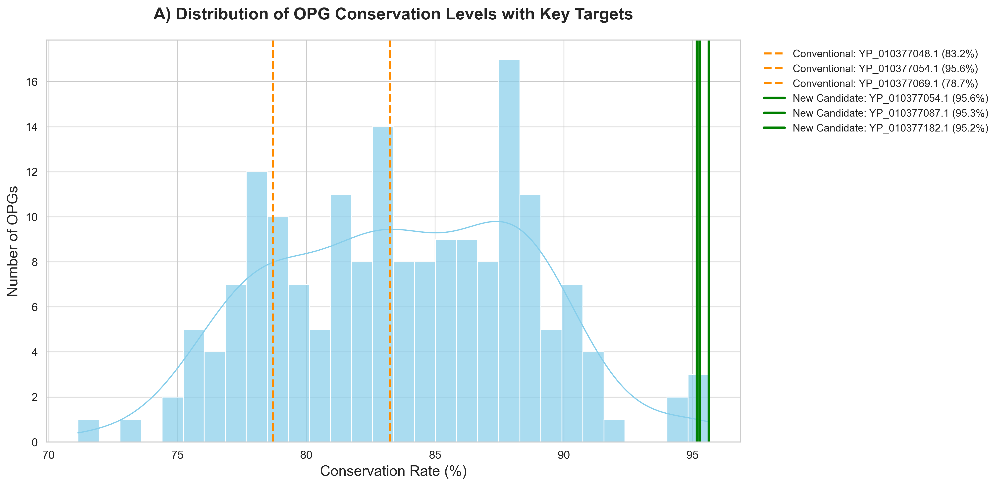

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# --- 1. 설정: 스타일, 파일 경로, 타겟 OPG 정의 ---

# 논문 품질의 그래프를 위한 스타일 설정
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial'],
    'font.size': 12,
    'axes.titlesize': 16,
    'axes.labelsize': 14,
    'xtick.labelsize': 11,
    'ytick.labelsize': 11,
    'legend.fontsize': 10,
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'savefig.bbox': 'tight'
})

# 분석할 파일 경로
PAN_CLADE_FILE_PATH = "opg_analysis_results/opg_analysis_summary_clade_all.csv"
OUTPUT_DIR = "publication_figures"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# 그룹별 OPG 목록 정의
CONVENTIONAL_TARGETS = ['YP_010377048.1', 'YP_010377069.1', 'YP_010377054.1']
NEW_CANDIDATES = ['YP_010377182.1', 'YP_010377087.1', 'YP_010377054.1']

# --- 2. 데이터 로딩 ---

try:
    df_pan_clade = pd.read_csv(PAN_CLADE_FILE_PATH)
    print(f"데이터 로드 완료: {PAN_CLADE_FILE_PATH}")
except FileNotFoundError:
    print(f"오류: 파일을 찾을 수 없습니다 -> '{PAN_CLADE_FILE_PATH}'")
    df_pan_clade = None

# --- 3. Figure 1: Top Conserved OPGs (수정된 버전) ---

def create_figure1_top_conserved(data):
    if data is None:
        return

    # 보존율 90% 이상인 데이터 필터링 및 정렬
    top_data = data[data['Conservation'] >= 90].sort_values('Conservation', ascending=True)

    fig, ax = plt.subplots(figsize=(12, 8))

    # 각 OPG에 대한 색상 리스트 생성
    bar_colors = []
    for opg in top_data['OPG']:
        if opg in CONVENTIONAL_TARGETS:
            bar_colors.append('darkorange')  # 기존 타겟은 주황색
        else:
            bar_colors.append('dodgerblue')   # 나머지는 파란색

    # 수평 막대그래프 생성
    bars = ax.barh(top_data['OPG'], top_data['Conservation'], color=bar_colors, alpha=0.9)

    # 막대 끝에 보존율(%) 텍스트 추가
    for bar in bars:
        width = bar.get_width()
        ax.text(width + 0.02, bar.get_y() + bar.get_height()/2.,
                f'{width:.1f}%', ha='left', va='center', fontsize=10)

    # --- 스타일링 (요청사항 반영) ---
    ax.set_title('A. Top Conserved OPGs Across All MPXV Clades', fontweight='bold', pad=20)
    ax.set_xlabel('Conservation (%)')
    ax.set_ylabel('OPG ID')
    ax.set_xlim(90, 96)  # X축 범위를 90% ~ 96%로 조정하여 차이 극대화
    ax.grid(axis='x', linestyle='--', alpha=0.6)
    ax.axvline(x=95, color='red', linestyle='--', linewidth=1.2, label='95% Conservation Threshold')

    # 범례 생성
    legend_patches = [
        plt.Rectangle((0,0),1,1, color='darkorange', label='Conventional Diagnostic Targets'),
        plt.Rectangle((0,0),1,1, color='dodgerblue', label='Other OPGs')
    ]
    ax.legend(handles=legend_patches, loc='lower right')

    # 파일 저장
    output_file = os.path.join(OUTPUT_DIR, "Figure1_Top_Conserved_OPGs_Revised.png")
    plt.savefig(output_file)
    print(f"수정된 Figure 1 저장 완료: {output_file}")
    plt.show()


# --- 4. Figure 2: Conservation Distribution (수정된 버전) ---

def create_figure2_distribution(data):
    if data is None:
        return

    fig, ax = plt.subplots(figsize=(12, 7))

    # 히스토그램 및 KDE 플롯 생성
    sns.histplot(data['Conservation'], bins=30, kde=True, color='skyblue', ax=ax, alpha=0.7)

    # --- 하이라이트 (요청사항 반영) ---
    # 그룹별 색상 및 스타일 정의
    colors = {'conventional': 'darkorange', 'new': 'green'}
    styles = {'conventional': '--', 'new': '-'}
    
    # 기존 타겟과 새로운 후보 OPG 데이터 추출
    conventional_data = data[data['OPG'].isin(CONVENTIONAL_TARGETS)]
    new_candidate_data = data[data['OPG'].isin(NEW_CANDIDATES)]

    # 기존 타겟 수직선으로 표시
    for _, row in conventional_data.iterrows():
        ax.axvline(x=row['Conservation'], color=colors['conventional'], linestyle=styles['conventional'],
                   linewidth=2, label=f"Conventional: {row['OPG']} ({row['Conservation']:.1f}%)")

    # 새로운 후보 수직선으로 표시
    for _, row in new_candidate_data.iterrows():
         ax.axvline(x=row['Conservation'], color=colors['new'], linestyle=styles['new'],
                   linewidth=2.5, label=f"New Candidate: {row['OPG']} ({row['Conservation']:.1f}%)")

    # --- 스타일링 ---
    ax.set_title('A) Distribution of OPG Conservation Levels with Key Targets', fontweight='bold', pad=20)
    ax.set_xlabel('Conservation Rate (%)')
    ax.set_ylabel('Number of OPGs')
    
    # 범례 핸들 중복 제거
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys(), bbox_to_anchor=(1.02, 1), loc='upper left')

    # 파일 저장
    output_file = os.path.join(OUTPUT_DIR, "Figure2_Distribution_Revised.png")
    plt.savefig(output_file)
    print(f"수정된 Figure 2 저장 완료: {output_file}")
    plt.show()


# --- 5. 메인 실행 부분 ---

if df_pan_clade is not None:
    create_figure1_top_conserved(df_pan_clade)
    create_figure2_distribution(df_pan_clade)



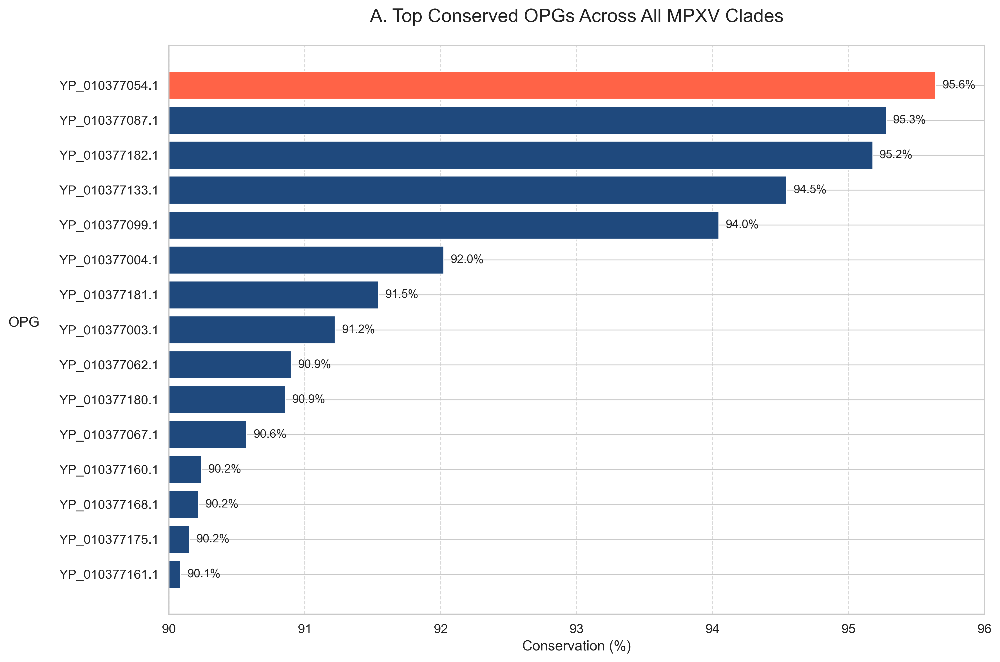

In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# CSV 파일 경로 설정
file_path = 'opg_analysis_results/opg_analysis_summary_clade_all.csv'

try:
    # CSV 파일 읽기
    df = pd.read_csv(file_path)

    # 'Conservation' 열을 기준으로 내림차순 정렬 후 상위 15개 선택
    df_sorted = df.sort_values(by='Conservation', ascending=False).head(15)

    # 시각화를 위해 데이터 프레임을 오름차순으로 다시 정렬
    df_sorted = df_sorted.sort_values(by='Conservation', ascending=True)

    # 강조할 OPG ID 리스트
    highlight_opgs = ['YP_010377054.1', 'YP_010377048.1', 'YP_010377069.1']

    # 막대 색상 설정 (기본 색상과 강조 색상)
    colors = ['#ff6347' if opg in highlight_opgs else '#1f497d' for opg in df_sorted['OPG']]

    # 수평 막대 그래프 생성
    fig, ax = plt.subplots(figsize=(12, 8))
    bars = ax.barh(df_sorted['OPG'], df_sorted['Conservation'], color=colors)

    # 그래프 제목 및 축 레이블 설정
    ax.set_title('A. Top Conserved OPGs Across All MPXV Clades', fontsize=16, pad=20)
    ax.set_xlabel('Conservation (%)', fontsize=12)
    ax.set_ylabel('OPG', fontsize=12, rotation=0, labelpad=30)

    # x축 범위 설정 (90% ~ 96%)
    ax.set_xlim(90, 96)

    # 각 막대에 대한 보존도(%) 텍스트 추가
    for bar in bars:
        width = bar.get_width()
        label_x_pos = width + 0.05
        ax.text(label_x_pos, bar.get_y() + bar.get_height()/2, f'{width:.1f}%',
                va='center', ha='left', fontsize=10)

    # 그리드 및 레이아웃 설정
    ax.grid(axis='x', linestyle='--', alpha=0.7)
    plt.tight_layout()

    # 그래프 출력
    plt.show()

except FileNotFoundError:
    print(f"오류: '{file_path}' 파일을 찾을 수 없습니다.")
except Exception as e:
    print(f"오류가 발생했습니다: {e}")


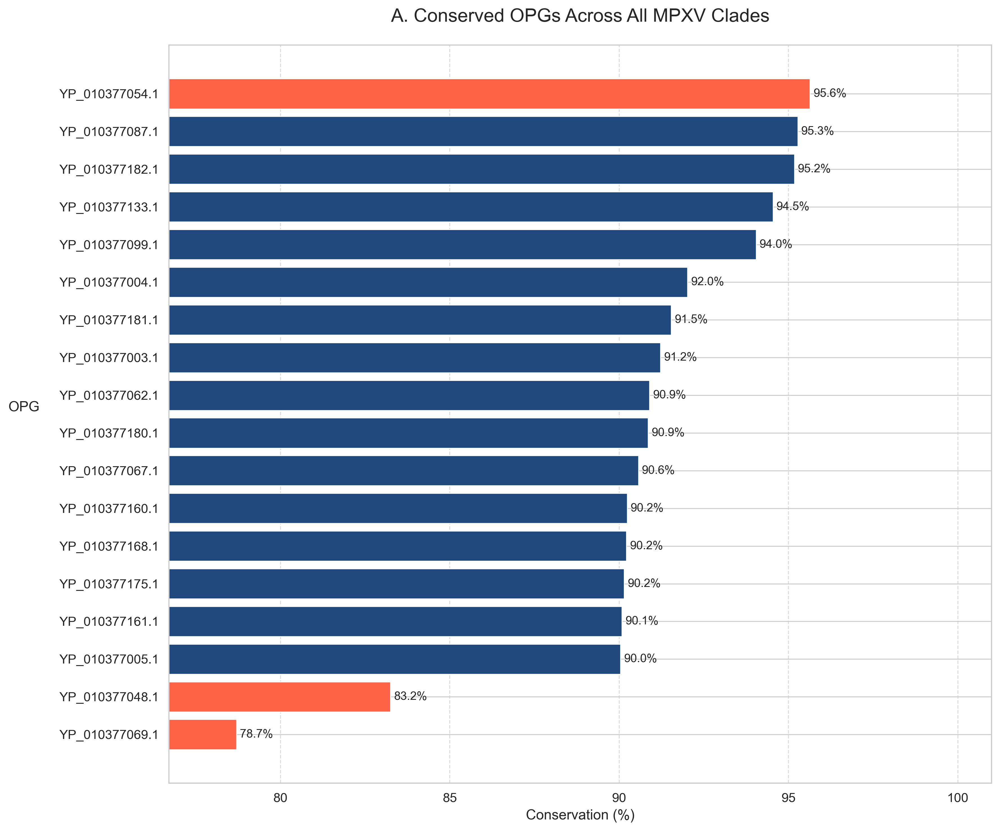

In [24]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# CSV 파일 경로 설정
file_path = 'opg_analysis_results/opg_analysis_summary_clade_all.csv'

try:
    # CSV 파일 읽기
    df = pd.read_csv(file_path)

    # 항상 포함할 OPG ID 리스트 (진단 타겟)
    target_opgs = ['YP_010377054.1', 'YP_010377048.1', 'YP_010377069.1']

    # 1. 보존도가 90% 이상인 데이터 선택
    df_high_conservation = df[df['Conservation'] >= 90]

    # 2. 항상 포함할 OPG 데이터 선택
    df_targets = df[df['OPG'].isin(target_opgs)]

    # 3. 두 데이터프레임을 합치고 중복 제거하여 플로팅할 최종 데이터 생성
    df_plot = pd.concat([df_high_conservation, df_targets]).drop_duplicates().reset_index(drop=True)

    # 시각화를 위해 'Conservation'을 기준으로 오름차순 정렬
    df_plot_sorted = df_plot.sort_values(by='Conservation', ascending=True)

    # 강조할 OPG ID 리스트 (색상 지정에 사용)
    highlight_opgs = ['YP_010377054.1', 'YP_010377048.1', 'YP_010377069.1']

    # 막대 색상 설정 (타겟 OPG는 다른 색으로 강조)
    colors = ['#ff6347' if opg in highlight_opgs else '#1f497d' for opg in df_plot_sorted['OPG']]

    # 수평 막대 그래프 생성 (그래프 크기 조절)
    fig, ax = plt.subplots(figsize=(12, 10))
    bars = ax.barh(df_plot_sorted['OPG'], df_plot_sorted['Conservation'], color=colors)

    # 그래프 제목 및 축 레이블 설정
    ax.set_title('A. Conserved OPGs Across All MPXV Clades', fontsize=16, pad=20)
    ax.set_xlabel('Conservation (%)', fontsize=12)
    ax.set_ylabel('OPG', fontsize=12, rotation=0, labelpad=30)

    # x축 범위 자동 조정을 위해 최소값 찾기
    min_conservation = df_plot_sorted['Conservation'].min()
    ax.set_xlim(left=min_conservation - 2, right=101) # 최소값에 맞춰 x축 시작점 조정

    # 각 막대에 대한 보존도(%) 텍스트 추가
    for bar in bars:
        width = bar.get_width()
        label_x_pos = width + 0.1
        ax.text(label_x_pos, bar.get_y() + bar.get_height()/2, f'{width:.1f}%',
                va='center', ha='left', fontsize=10)

    # 그리드 및 레이아웃 설정
    ax.grid(axis='x', linestyle='--', alpha=0.7)
    plt.tight_layout()

    # 그래프 출력
    plt.show()

except FileNotFoundError:
    print(f"오류: '{file_path}' 파일을 찾을 수 없습니다. 경로를 확인해주세요.")
except Exception as e:
    print(f"오류가 발생했습니다: {e}")


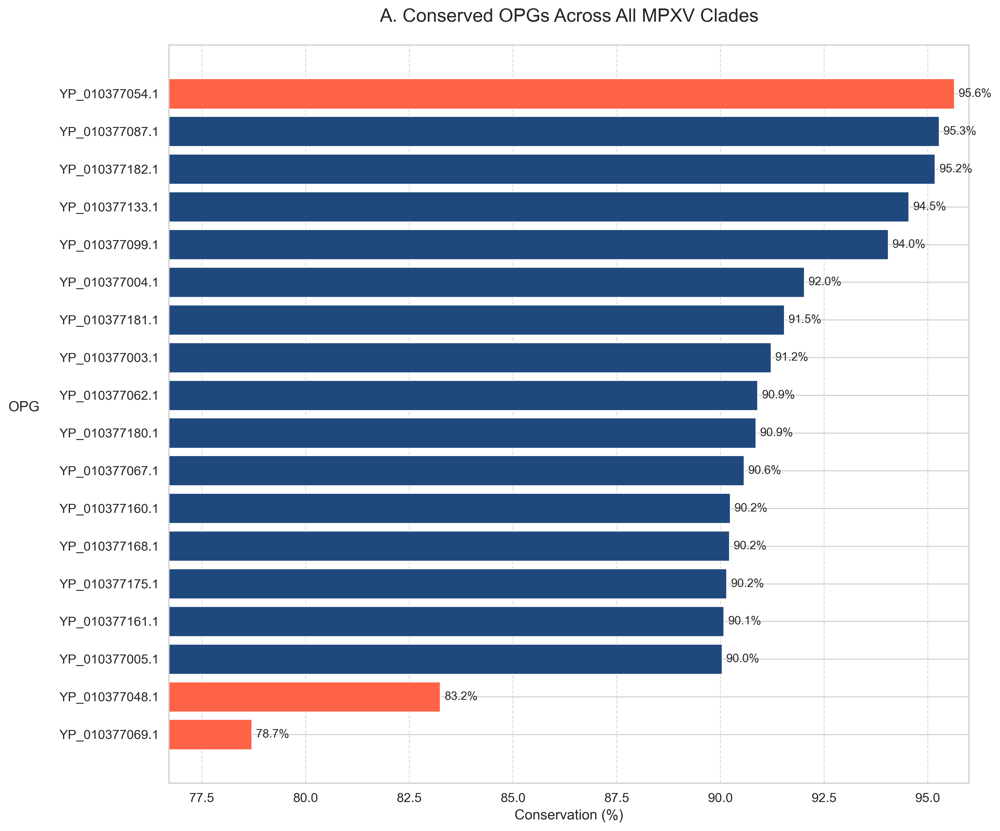

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# CSV 파일 경로 설정
file_path = 'opg_analysis_results/opg_analysis_summary_clade_all.csv'

try:
    # CSV 파일 읽기
    df = pd.read_csv(file_path)

    # 항상 포함할 OPG ID 리스트 (진단 타겟)
    target_opgs = ['YP_010377054.1', 'YP_010377048.1', 'YP_010377069.1']

    # 1. 보존도가 90% 이상인 데이터 선택
    df_high_conservation = df[df['Conservation'] >= 90]

    # 2. 항상 포함할 OPG 데이터 선택
    df_targets = df[df['OPG'].isin(target_opgs)]

    # 3. 두 데이터프레임을 합치고 중복 제거하여 플로팅할 최종 데이터 생성
    df_plot = pd.concat([df_high_conservation, df_targets]).drop_duplicates().reset_index(drop=True)

    # 시각화를 위해 'Conservation'을 기준으로 오름차순 정렬
    df_plot_sorted = df_plot.sort_values(by='Conservation', ascending=True)

    # 강조할 OPG ID 리스트 (색상 지정에 사용)
    highlight_opgs = ['YP_010377054.1', 'YP_010377048.1', 'YP_010377069.1']

    # 막대 색상 설정 (타겟 OPG는 다른 색으로 강조)
    colors = ['#ff6347' if opg in highlight_opgs else '#1f497d' for opg in df_plot_sorted['OPG']]

    # 수평 막대 그래프 생성 (그래프 크기 조절)
    fig, ax = plt.subplots(figsize=(12, 10))
    bars = ax.barh(df_plot_sorted['OPG'], df_plot_sorted['Conservation'], color=colors)

    # 그래프 제목 및 축 레이블 설정
    ax.set_title('A. Conserved OPGs Across All MPXV Clades', fontsize=16, pad=20)
    ax.set_xlabel('Conservation (%)', fontsize=12)
    ax.set_ylabel('OPG', fontsize=12, rotation=0, labelpad=30)

    # x축 범위 설정 (최소값 ~ 96%)
    min_conservation = df_plot_sorted['Conservation'].min()
    ax.set_xlim(left=min_conservation - 2, right=96) # x축 최댓값을 96으로 수정

    # 각 막대에 대한 보존도(%) 텍스트 추가
    for bar in bars:
        width = bar.get_width()
        # 막대가 그래프 영역을 벗어나지 않도록 텍스트 위치 조정
        if width > 96:
             label_x_pos = 95.9
             ha = 'right'
        else:
             label_x_pos = width + 0.1
             ha = 'left'
        ax.text(label_x_pos, bar.get_y() + bar.get_height()/2, f'{width:.1f}%',
                va='center', ha=ha, fontsize=10)

    # 그리드 및 레이아웃 설정
    ax.grid(axis='x', linestyle='--', alpha=0.7)
    plt.tight_layout()

    # 그래프 출력
    plt.show()

except FileNotFoundError:
    print(f"오류: '{file_path}' 파일을 찾을 수 없습니다. 경로를 확인해주세요.")
except Exception as e:
    print(f"오류가 발생했습니다: {e}")


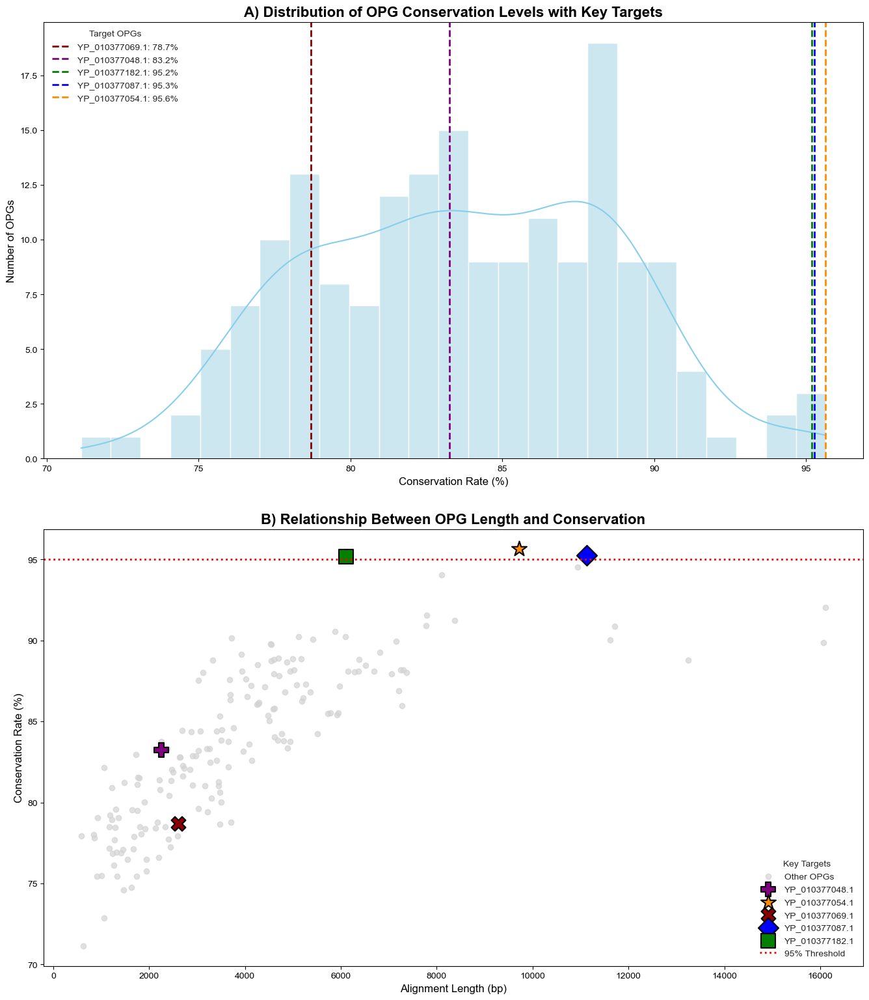

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# --- Configuration ---
# Set the correct path to your CSV file
CSV_FILE_PATH = 'opg_analysis_results/opg_analysis_summary_clade_all.csv'

# Define the key OPGs to be highlighted in the plots
# Conventional diagnostic targets from the paper
CONVENTIONAL_TARGETS = ['YP_010377054.1', 'YP_010377048.1', 'YP_010377069.1']
# Top candidates with >= 95% conservation identified in the paper
TOP_CANDIDATES = ['YP_010377182.1', 'YP_010377087.1']

# Combine all key targets for easy filtering, removing duplicates
ALL_KEY_TARGETS = list(set(CONVENTIONAL_TARGETS + TOP_CANDIDATES))

# --- Data Loading and Preparation ---
try:
    # Load the dataset from the specified CSV file
    df = pd.read_csv(CSV_FILE_PATH)
    
    # Extract the data for the key OPG targets
    key_targets_df = df[df['OPG'].isin(ALL_KEY_TARGETS)].set_index('OPG')
    
    # Prepare data for plot legends and annotations
    target_conservation_data = {
        opg: key_targets_df.loc[opg, 'Conservation']
        for opg in ALL_KEY_TARGETS if opg in key_targets_df.index
    }

except FileNotFoundError:
    print(f"Error: The file '{CSV_FILE_PATH}' was not found.")
    print("Please make sure the CSV file is in the correct directory.")
    exit()
except Exception as e:
    print(f"An error occurred while reading the CSV file: {e}")
    exit()

# --- Plotting ---
# Create a figure with two subplots arranged vertically
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 16))
plt.style.use('seaborn-v0_8-whitegrid')

# --- Plot A: Distribution of OPG Conservation Levels ---
# Create a histogram and a Kernel Density Estimate (KDE) plot using the correct column name 'Conservation'
sns.histplot(data=df, x='Conservation', bins=25, kde=True, ax=ax1, color='lightblue', alpha=0.6, edgecolor='white')
ax1.lines[0].set_color('skyblue') # Style the KDE line

# Define colors for the vertical lines representing key targets
colors = {
    'YP_010377054.1': 'darkorange',
    'YP_010377048.1': 'purple',
    'YP_010377069.1': 'darkred',
    'YP_010377182.1': 'green',
    'YP_010377087.1': 'blue'
}

# Add vertical dashed lines for each key target
for opg, conservation in sorted(target_conservation_data.items(), key=lambda item: item[1]):
    ax1.axvline(x=conservation, color=colors.get(opg, 'grey'), linestyle='--', linewidth=2,
                label=f'{opg}: {conservation:.1f}%')

# Set titles and labels for Plot A
ax1.set_title('A) Distribution of OPG Conservation Levels with Key Targets', fontsize=16, weight='bold')
ax1.set_xlabel('Conservation Rate (%)', fontsize=12)
ax1.set_ylabel('Number of OPGs', fontsize=12)
ax1.legend(title='Target OPGs')

# --- Plot B: Relationship Between OPG Length and Conservation ---
# Create the base scatter plot for all OPGs using the correct column name 'Length'
ax2.scatter(df['Length'], df['Conservation'], c='lightgray', alpha=0.7, label='Other OPGs')

# Define markers and colors for the key targets on the scatter plot
plot_markers = {
    'YP_010377054.1': {'marker': '*', 'color': 'darkorange', 'size': 300},
    'YP_010377048.1': {'marker': 'P', 'color': 'purple', 'size': 250},
    'YP_010377069.1': {'marker': 'X', 'color': 'darkred', 'size': 250},
    'YP_010377182.1': {'marker': 's', 'color': 'green', 'size': 250},
    'YP_010377087.1': {'marker': 'D', 'color': 'blue', 'size': 250}
}

# Plot each key target with its specific marker and color
for opg, data in key_targets_df.iterrows():
    config = plot_markers.get(opg, {})
    ax2.scatter(data['Length'], data['Conservation'], 
                marker=config.get('marker', 'o'), 
                color=config.get('color', 'black'), 
                s=config.get('size', 100),
                edgecolor='black', linewidth=1.5,
                label=opg)

# Add the 95% conservation threshold line
ax2.axhline(y=95, color='red', linestyle=':', linewidth=2, label='95% Threshold')

# Set titles and labels for Plot B
ax2.set_title('B) Relationship Between OPG Length and Conservation', fontsize=16, weight='bold')
ax2.set_xlabel('Alignment Length (bp)', fontsize=12)
ax2.set_ylabel('Conservation Rate (%)', fontsize=12)
ax2.legend(title='Key Targets')

# --- Final Adjustments and Display ---
# Improve the layout to prevent labels from overlapping
plt.tight_layout(pad=3.0)
# Display the plots
plt.show()


Figure saved as opg_analysis_figure.png


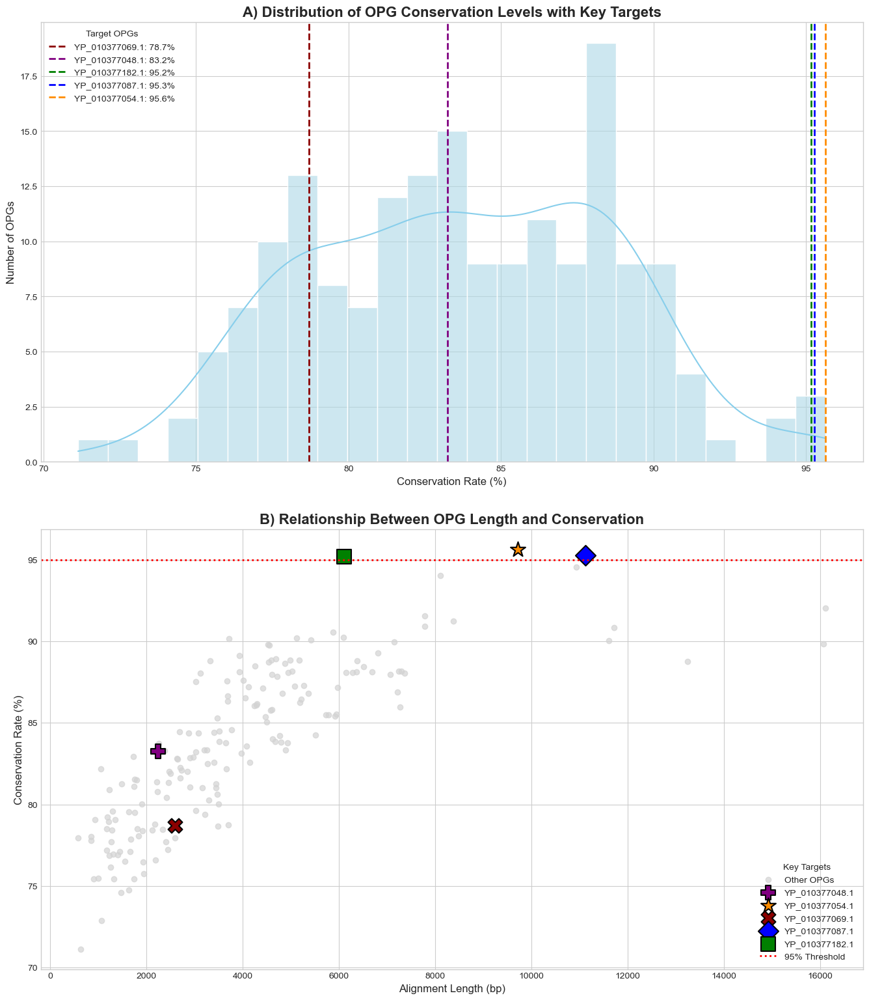

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# --- Configuration ---
# Set the correct path to your CSV file
CSV_FILE_PATH = 'opg_analysis_results/opg_analysis_summary_clade_all.csv'

# Define the key OPGs to be highlighted in the plots
# Conventional diagnostic targets from the paper
CONVENTIONAL_TARGETS = ['YP_010377054.1', 'YP_010377048.1', 'YP_010377069.1']
# Top candidates with >= 95% conservation identified in the paper
TOP_CANDIDATES = ['YP_010377182.1', 'YP_010377087.1']

# Combine all key targets for easy filtering, removing duplicates
ALL_KEY_TARGETS = list(set(CONVENTIONAL_TARGETS + TOP_CANDIDATES))

# --- Data Loading and Preparation ---
try:
    # Load the dataset from the specified CSV file
    df = pd.read_csv(CSV_FILE_PATH)
    
    # Extract the data for the key OPG targets
    key_targets_df = df[df['OPG'].isin(ALL_KEY_TARGETS)].set_index('OPG')
    
    # Prepare data for plot legends and annotations
    target_conservation_data = {
        opg: key_targets_df.loc[opg, 'Conservation']
        for opg in ALL_KEY_TARGETS if opg in key_targets_df.index
    }

except FileNotFoundError:
    print(f"Error: The file '{CSV_FILE_PATH}' was not found.")
    print("Please make sure the CSV file is in the correct directory.")
    exit()
except Exception as e:
    print(f"An error occurred while reading the CSV file: {e}")
    exit()

# --- Plotting ---
# Create a figure with two subplots arranged vertically
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 16))
plt.style.use('seaborn-v0_8-whitegrid')

# --- Plot A: Distribution of OPG Conservation Levels ---
# Create a histogram and a Kernel Density Estimate (KDE) plot using the correct column name 'Conservation'
sns.histplot(data=df, x='Conservation', bins=25, kde=True, ax=ax1, color='lightblue', alpha=0.6, edgecolor='white')
ax1.lines[0].set_color('skyblue') # Style the KDE line

# Define colors for the vertical lines representing key targets
colors = {
    'YP_010377054.1': 'darkorange',
    'YP_010377048.1': 'purple',
    'YP_010377069.1': 'darkred',
    'YP_010377182.1': 'green',
    'YP_010377087.1': 'blue'
}

# Add vertical dashed lines for each key target
for opg, conservation in sorted(target_conservation_data.items(), key=lambda item: item[1]):
    ax1.axvline(x=conservation, color=colors.get(opg, 'grey'), linestyle='--', linewidth=2,
                label=f'{opg}: {conservation:.1f}%')

# Set titles and labels for Plot A
ax1.set_title('A) Distribution of OPG Conservation Levels with Key Targets', fontsize=16, weight='bold')
ax1.set_xlabel('Conservation Rate (%)', fontsize=12)
ax1.set_ylabel('Number of OPGs', fontsize=12)
ax1.legend(title='Target OPGs')

# --- Plot B: Relationship Between OPG Length and Conservation ---
# Create the base scatter plot for all OPGs using the correct column name 'Length'
ax2.scatter(df['Length'], df['Conservation'], c='lightgray', alpha=0.7, label='Other OPGs')

# Define markers and colors for the key targets on the scatter plot
plot_markers = {
    'YP_010377054.1': {'marker': '*', 'color': 'darkorange', 'size': 300},
    'YP_010377048.1': {'marker': 'P', 'color': 'purple', 'size': 250},
    'YP_010377069.1': {'marker': 'X', 'color': 'darkred', 'size': 250},
    'YP_010377182.1': {'marker': 's', 'color': 'green', 'size': 250},
    'YP_010377087.1': {'marker': 'D', 'color': 'blue', 'size': 250}
}

# Plot each key target with its specific marker and color
for opg, data in key_targets_df.iterrows():
    config = plot_markers.get(opg, {})
    ax2.scatter(data['Length'], data['Conservation'], 
                marker=config.get('marker', 'o'), 
                color=config.get('color', 'black'), 
                s=config.get('size', 100),
                edgecolor='black', linewidth=1.5,
                label=opg)

# Add the 95% conservation threshold line
ax2.axhline(y=95, color='red', linestyle=':', linewidth=2, label='95% Threshold')

# Set titles and labels for Plot B
ax2.set_title('B) Relationship Between OPG Length and Conservation', fontsize=16, weight='bold')
ax2.set_xlabel('Alignment Length (bp)', fontsize=12)
ax2.set_ylabel('Conservation Rate (%)', fontsize=12)
ax2.legend(title='Key Targets')

# --- Final Adjustments and Saving ---
# Improve the layout to prevent labels from overlapping
plt.tight_layout(pad=3.0)

# Save the figure to a PNG file instead of displaying it
output_filename = 'opg_analysis_figure.png'
plt.savefig(output_filename, dpi=300, bbox_inches='tight')
print(f"Figure saved as {output_filename}")

# plt.show() # This line is commented out to prevent the plot from displaying on screen


Figure saved as conserved_opgs_figure.png


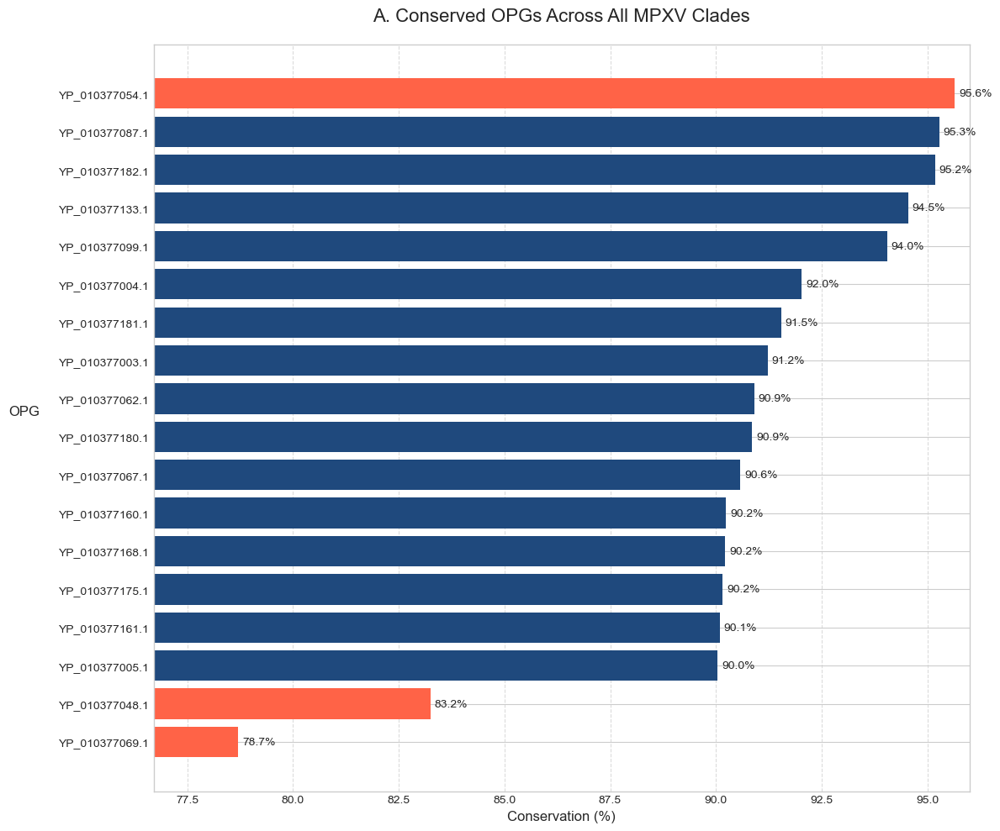

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# CSV 파일 경로 설정
file_path = 'opg_analysis_results/opg_analysis_summary_clade_all.csv'

try:
    # CSV 파일 읽기
    df = pd.read_csv(file_path)

    # 항상 포함할 OPG ID 리스트 (진단 타겟)
    target_opgs = ['YP_0010377054.1', 'YP_010377048.1', 'YP_010377069.1']

    # 1. 보존도가 90% 이상인 데이터 선택
    df_high_conservation = df[df['Conservation'] >= 90]

    # 2. 항상 포함할 OPG 데이터 선택
    df_targets = df[df['OPG'].isin(target_opgs)]

    # 3. 두 데이터프레임을 합치고 중복 제거하여 플로팅할 최종 데이터 생성
    df_plot = pd.concat([df_high_conservation, df_targets]).drop_duplicates().reset_index(drop=True)

    # 시각화를 위해 'Conservation'을 기준으로 오름차순 정렬
    df_plot_sorted = df_plot.sort_values(by='Conservation', ascending=True)

    # 강조할 OPG ID 리스트 (색상 지정에 사용)
    highlight_opgs = ['YP_010377054.1', 'YP_010377048.1', 'YP_010377069.1']

    # 막대 색상 설정 (타겟 OPG는 다른 색으로 강조)
    colors = ['#ff6347' if opg in highlight_opgs else '#1f497d' for opg in df_plot_sorted['OPG']]

    # 수평 막대 그래프 생성 (그래프 크기 조절)
    fig, ax = plt.subplots(figsize=(12, 10))
    bars = ax.barh(df_plot_sorted['OPG'], df_plot_sorted['Conservation'], color=colors)

    # 그래프 제목 및 축 레이블 설정
    ax.set_title('A. Conserved OPGs Across All MPXV Clades', fontsize=16, pad=20)
    ax.set_xlabel('Conservation (%)', fontsize=12)
    ax.set_ylabel('OPG', fontsize=12, rotation=0, labelpad=30)

    # x축 범위 설정 (최소값 ~ 96%)
    min_conservation = df_plot_sorted['Conservation'].min()
    ax.set_xlim(left=min_conservation - 2, right=96) # x축 최댓값을 96으로 수정

    # 각 막대에 대한 보존도(%) 텍스트 추가
    for bar in bars:
        width = bar.get_width()
        # 막대가 그래프 영역을 벗어나지 않도록 텍스트 위치 조정
        if width > 96:
             label_x_pos = 95.9
             ha = 'right'
        else:
             label_x_pos = width + 0.1
             ha = 'left'
        ax.text(label_x_pos, bar.get_y() + bar.get_height()/2, f'{width:.1f}%',
                va='center', ha=ha, fontsize=10)

    # 그리드 및 레이아웃 설정
    ax.grid(axis='x', linestyle='--', alpha=0.7)
    plt.tight_layout()

    # 그래프를 PNG 파일로 저장
    output_filename = 'conserved_opgs_figure.png'
    plt.savefig(output_filename, dpi=300, bbox_inches='tight')
    print(f"Figure saved as {output_filename}")
    
    # plt.show() # 화면 표시는 주석 처리

except FileNotFoundError:
    print(f"오류: '{file_path}' 파일을 찾을 수 없습니다. 경로를 확인해주세요.")
except Exception as e:
    print(f"오류가 발생했습니다: {e}")


Figure saved as publication_figures/figure_conserved_opgs.svg


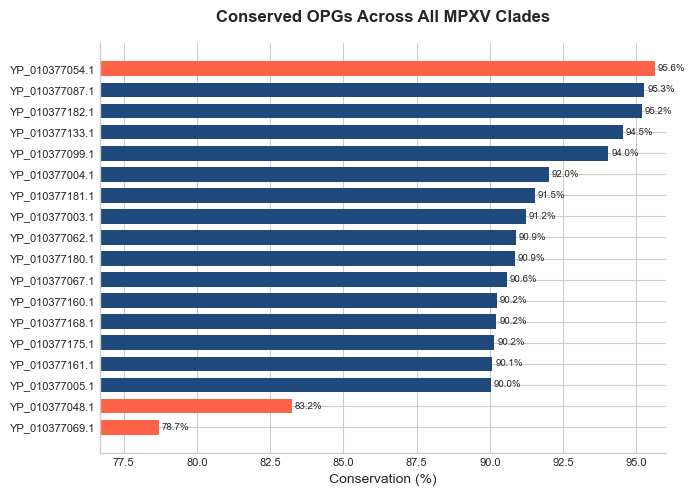

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os

# --- Nature 스타일 설정 ---
# 폰트를 Arial로 설정하고, 기본 글자 크기를 지정합니다.
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 8  # 기본 폰트 크기 (tick labels 등)

# --- Configuration ---
# CSV 파일 경로 설정
file_path = 'opg_analysis_results/opg_analysis_summary_clade_all.csv'
# 결과물을 저장할 디렉토리 생성
output_dir = 'publication_figures'
os.makedirs(output_dir, exist_ok=True)

try:
    # CSV 파일 읽기
    df = pd.read_csv(file_path)

    # 항상 포함할 OPG ID 리스트 (진단 타겟)
    target_opgs = ['YP_010377054.1', 'YP_010377048.1', 'YP_010377069.1']
    # 90% 이상 보존 OPG 및 타겟 OPG 선택
    df_high_conservation = df[df['Conservation'] >= 90]
    df_targets = df[df['OPG'].isin(target_opgs)]
    df_plot = pd.concat([df_high_conservation, df_targets]).drop_duplicates().reset_index(drop=True)
    df_plot_sorted = df_plot.sort_values(by='Conservation', ascending=True)

    # 강조할 OPG ID 리스트
    highlight_opgs = ['YP_010377054.1', 'YP_010377048.1', 'YP_010377069.1']
    colors = ['#ff6347' if opg in highlight_opgs else '#1f497d' for opg in df_plot_sorted['OPG']]

    # --- Plotting ---
    fig, ax = plt.subplots(figsize=(7, 5)) # 논문 스타일에 맞는 크기 조절 (1.5-2열 너비)
    bars = ax.barh(df_plot_sorted['OPG'], df_plot_sorted['Conservation'], color=colors, height=0.7)

    # 제목 및 축 레이블 설정 (논문 스타일에 맞게 폰트 크기 조절)
    ax.set_title('Conserved OPGs Across All MPXV Clades', fontsize=12, weight='bold', pad=15)
    ax.set_xlabel('Conservation (%)', fontsize=10)
    ax.set_ylabel('') # Y-label은 보통 생략하거나 왼쪽에 정렬

    # x축 범위 설정
    min_conservation = df_plot_sorted['Conservation'].min()
    ax.set_xlim(left=min_conservation - 2, right=96)

    # 막대 위에 텍스트 추가 (폰트 크기 조절)
    for bar in bars:
        width = bar.get_width()
        label_x_pos = width + 0.1 if width <= 96 else 95.9
        ha = 'left' if width <= 96 else 'right'
        ax.text(label_x_pos, bar.get_y() + bar.get_height()/2, f'{width:.1f}%',
                va='center', ha=ha, fontsize=7)

    # 불필요한 테두리 제거
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    # 레이아웃 최적화
    plt.tight_layout()

    # SVG 파일로 저장
    output_filename = os.path.join(output_dir, 'figure_conserved_opgs.svg')
    plt.savefig(output_filename, format='svg', bbox_inches='tight')
    print(f"Figure saved as {output_filename}")

except FileNotFoundError:
    print(f"오류: '{file_path}' 파일을 찾을 수 없습니다. 경로를 확인해주세요.")
except Exception as e:
    print(f"오류가 발생했습니다: {e}")


Figure saved as publication_figures/figure_distribution_scatter.svg


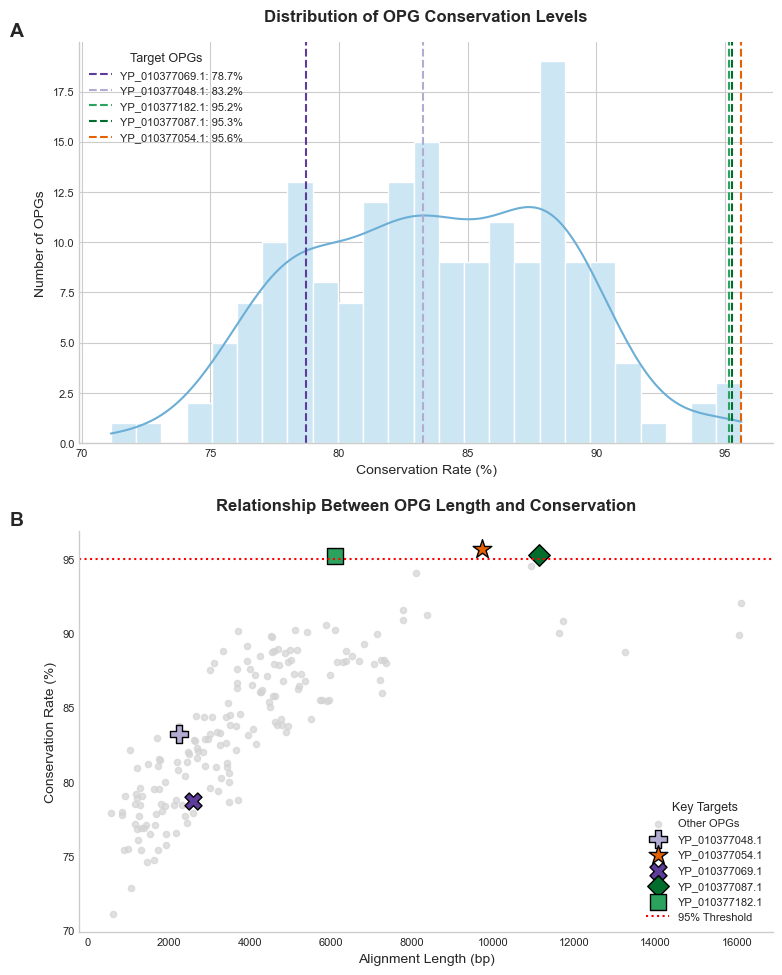

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os

# --- Nature 스타일 설정 ---
# 폰트를 Arial로 설정하고, 기본 글자 크기를 지정합니다.
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 8 # 기본 폰트 크기 (tick labels 등)
plt.rcParams['axes.linewidth'] = 1 # 축 선 두께

# --- Configuration ---
# CSV 파일 경로 설정
CSV_FILE_PATH = 'opg_analysis_results/opg_analysis_summary_clade_all.csv'
# 결과물을 저장할 디렉토리 생성
output_dir = 'publication_figures'
os.makedirs(output_dir, exist_ok=True)

# 주요 OPG 정의
CONVENTIONAL_TARGETS = ['YP_010377054.1', 'YP_010377048.1', 'YP_010377069.1']
TOP_CANDIDATES = ['YP_010377182.1', 'YP_010377087.1']
ALL_KEY_TARGETS = list(set(CONVENTIONAL_TARGETS + TOP_CANDIDATES))

try:
    # 데이터 로딩
    df = pd.read_csv(CSV_FILE_PATH)
    key_targets_df = df[df['OPG'].isin(ALL_KEY_TARGETS)].set_index('OPG')
    target_conservation_data = {
        opg: key_targets_df.loc[opg, 'Conservation']
        for opg in ALL_KEY_TARGETS if opg in key_targets_df.index
    }
except FileNotFoundError:
    print(f"Error: The file '{CSV_FILE_PATH}' was not found.")
    exit()
except Exception as e:
    print(f"An error occurred: {e}")
    exit()

# --- Plotting ---
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 10))

# --- Plot A: Distribution of OPG Conservation Levels ---
sns.histplot(data=df, x='Conservation', bins=25, kde=True, ax=ax1, color='#cce6f4', alpha=1, edgecolor='white')
ax1.lines[0].set_color('#6baed6')

colors = {
    'YP_010377054.1': '#e66101', 'YP_010377048.1': '#b2abd2',
    'YP_010377069.1': '#5e3c99', 'YP_010377182.1': '#2ca25f', 'YP_010377087.1': '#006d2c'
}

for opg, conservation in sorted(target_conservation_data.items(), key=lambda item: item[1]):
    ax1.axvline(x=conservation, color=colors.get(opg, 'grey'), linestyle='--', linewidth=1.5,
                label=f'{opg}: {conservation:.1f}%')

ax1.set_title('Distribution of OPG Conservation Levels', fontsize=12, weight='bold', pad=15)
ax1.set_xlabel('Conservation Rate (%)', fontsize=10)
ax1.set_ylabel('Number of OPGs', fontsize=10)
ax1.legend(title='Target OPGs', fontsize=8, title_fontsize=9)
ax1.text(-0.1, 1.05, 'A', transform=ax1.transAxes, fontsize=14, fontweight='bold', va='top')
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# --- Plot B: Relationship Between OPG Length and Conservation ---
ax2.scatter(df['Length'], df['Conservation'], c='lightgray', alpha=0.7, s=20, label='Other OPGs')

plot_markers = {
    'YP_010377054.1': {'marker': '*', 'color': '#e66101', 'size': 200},
    'YP_010377048.1': {'marker': 'P', 'color': '#b2abd2', 'size': 150},
    'YP_010377069.1': {'marker': 'X', 'color': '#5e3c99', 'size': 150},
    'YP_010377182.1': {'marker': 's', 'color': '#2ca25f', 'size': 120},
    'YP_010377087.1': {'marker': 'D', 'color': '#006d2c', 'size': 120}
}

for opg, data in key_targets_df.iterrows():
    config = plot_markers.get(opg, {})
    ax2.scatter(data['Length'], data['Conservation'], marker=config.get('marker', 'o'),
                color=config.get('color', 'black'), s=config.get('size', 50),
                edgecolor='black', linewidth=1, label=opg)

ax2.axhline(y=95, color='red', linestyle=':', linewidth=1.5, label='95% Threshold')
ax2.set_title('Relationship Between OPG Length and Conservation', fontsize=12, weight='bold', pad=15)
ax2.set_xlabel('Alignment Length (bp)', fontsize=10)
ax2.set_ylabel('Conservation Rate (%)', fontsize=10)
ax2.legend(title='Key Targets', fontsize=8, title_fontsize=9)
ax2.text(-0.1, 1.05, 'B', transform=ax2.transAxes, fontsize=14, fontweight='bold', va='top')
ax2.grid(False) # 논문 그림에서는 보통 그리드를 제거합니다.
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

# --- Final Adjustments and Saving ---
plt.tight_layout(pad=2.0)
output_filename = os.path.join(output_dir, 'figure_distribution_scatter.svg')
plt.savefig(output_filename, format='svg', bbox_inches='tight')
print(f"Figure saved as {output_filename}")


Methodology workflow figure saved as publication_figures/figure_methodology_workflow.svg


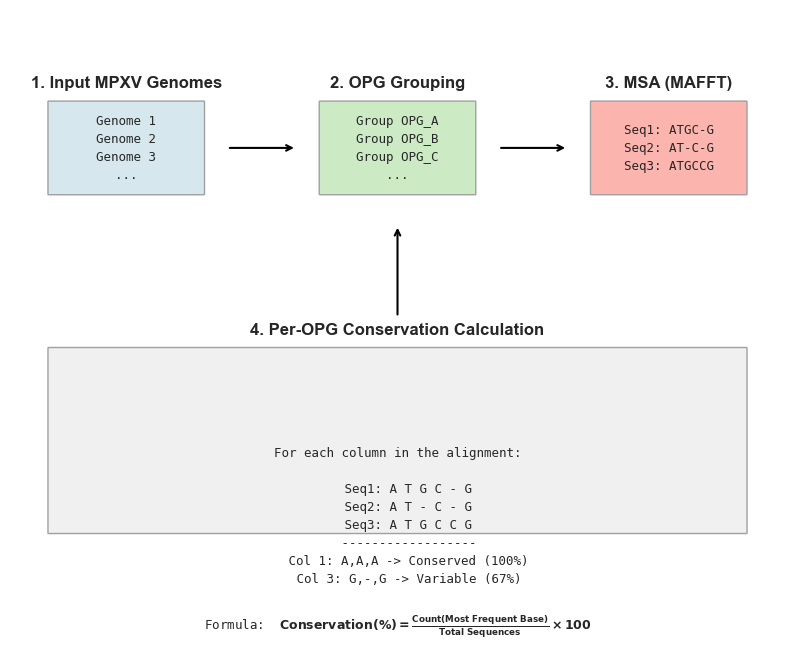

In [6]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os

# --- Nature 스타일 설정 ---
# 폰트를 Arial로 설정하고, 기본 글자 크기를 지정합니다.
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 10

# --- 그림 생성 ---
fig, ax = plt.subplots(figsize=(10, 8))
ax.set_xlim(0, 100)
ax.set_ylim(0, 100)
ax.axis('off') # 축 숨기기

# --- 다이어그램 요소 그리기 ---

# Helper function for drawing boxes with text
def draw_box_with_title(ax, xy, width, height, title, title_size=12, content='', content_size=9, box_color='#f0f0f0'):
    """박스와 제목, 내용을 그리는 함수"""
    box = patches.FancyBboxPatch(xy, width, height, boxstyle="round,pad=0.1",
                                 facecolor=box_color, edgecolor='#a0a0a0', linewidth=1)
    ax.add_patch(box)
    ax.text(xy[0] + width/2, xy[1] + height + 3, title,
            ha='center', va='center', fontsize=title_size, weight='bold')
    if content:
        ax.text(xy[0] + width/2, xy[1] + height/2, content,
                ha='center', va='center', fontsize=content_size, fontfamily='monospace', linespacing=1.5)

# 1. Input Genomes
draw_box_with_title(ax, (5, 70), 20, 15, "1. Input MPXV Genomes",
                      content="Genome 1\nGenome 2\nGenome 3\n...", box_color='#d6e8ee')

# 2. OPG Identification & Grouping
draw_box_with_title(ax, (40, 70), 20, 15, "2. OPG Grouping",
                      content="Group OPG_A\nGroup OPG_B\nGroup OPG_C\n...", box_color='#ccebc5')

# 3. Multiple Sequence Alignment (MAFFT)
draw_box_with_title(ax, (75, 70), 20, 15, "3. MSA (MAFFT)",
                      content="Seq1: ATGC-G\nSeq2: AT-C-G\nSeq3: ATGCCG", box_color='#fbb4ae')

# 4. Conservation Calculation
draw_box_with_title(ax, (5, 15), 90, 30, "4. Per-OPG Conservation Calculation", box_color='#f0f0f0')
# 보존도 계산 예시
conservation_content = (
    "For each column in the alignment:\n\n"
    "   Seq1: A T G C - G\n"
    "   Seq2: A T - C - G\n"
    "   Seq3: A T G C C G\n"
    "   ------------------\n"
    "   Col 1: A,A,A -> Conserved (100%)\n"
    "   Col 3: G,-,G -> Variable (67%)\n\n"
    r"Formula:  $\bf{Conservation(\%) = \frac{Count(Most\ Frequent\ Base)}{Total\ Sequences} \times 100}$"
)
ax.text(50, 29, conservation_content, ha='center', va='top', fontsize=9, fontfamily='monospace', linespacing=1.5)


# --- 화살표 연결 ---
arrow_props = dict(arrowstyle="->", color="black", lw=1.5)
ax.annotate("", xy=(37, 77.5), xytext=(28, 77.5), arrowprops=arrow_props)
ax.annotate("", xy=(72, 77.5), xytext=(63, 77.5), arrowprops=arrow_props)
ax.annotate("", xy=(50, 65), xytext=(50, 50), arrowprops=arrow_props)


# --- 최종 저장 ---
# 결과물을 저장할 디렉토리 생성
output_dir = 'publication_figures'
os.makedirs(output_dir, exist_ok=True)
output_filename = os.path.join(output_dir, 'figure_methodology_workflow.svg')
plt.savefig(output_filename, format='svg', bbox_inches='tight')

print(f"Methodology workflow figure saved as {output_filename}")
plt.show()


Professional pipeline figure saved as publication_figures/figure_final_pipeline.svg


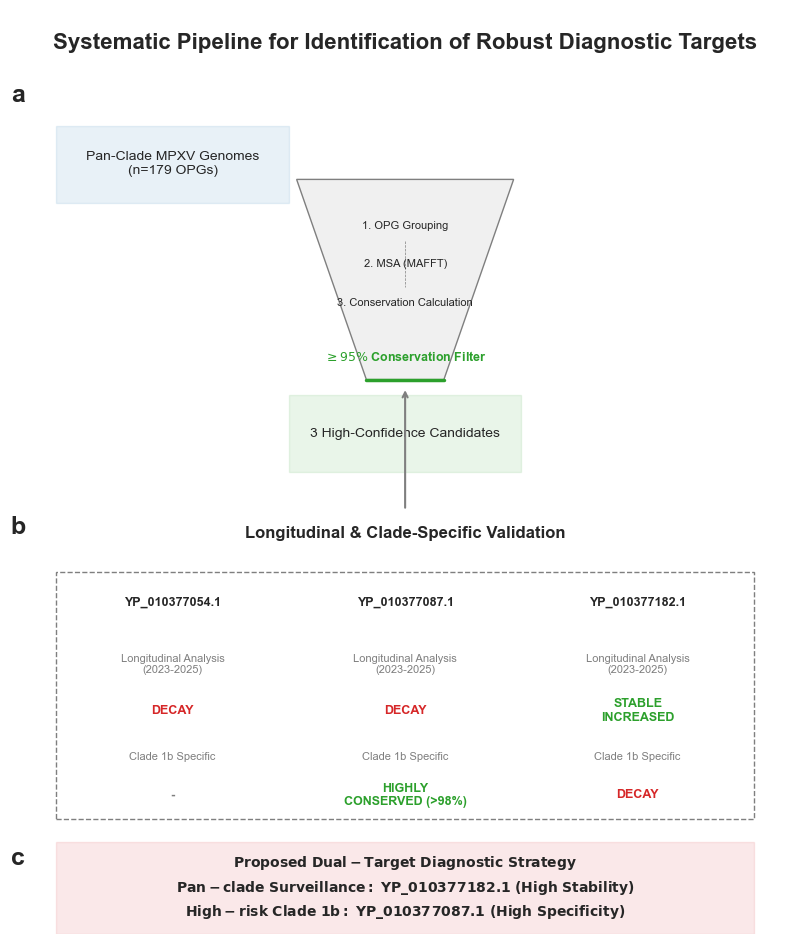

In [8]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.lines as lines
import numpy as np
import os

# --- Nature 스타일 및 색상 팔레트 설정 ---
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['svg.fonttype'] = 'none' # SVG 텍스트를 편집 가능하게 저장

# 색상 정의
COLOR_PANEL_A = '#1f77b4'  # 파란색 계열
COLOR_PANEL_B = '#2ca02c'  # 녹색 계열
COLOR_PANEL_C = '#ff7f0e'  # 주황색 계열
COLOR_FINAL = '#d62728'   # 빨간색 계열
COLOR_GREY = '#7f7f7f'

# --- 그림 생성 ---
fig, ax = plt.subplots(figsize=(10, 12))
ax.set_xlim(0, 10)
ax.set_ylim(0, 12)
ax.axis('off')

# --- 패널 A: Genome-wide Screening & Filtering ---
ax.text(5, 11.5, 'Systematic Pipeline for Identification of Robust Diagnostic Targets', ha='center', fontsize=16, weight='bold')
ax.text(0, 10.8, 'a', ha='center', fontsize=18, weight='bold')

# 입력 데이터 박스
ax.add_patch(patches.Rectangle((0.5, 9.5), 3, 1, facecolor=COLOR_PANEL_A, alpha=0.1, edgecolor=COLOR_PANEL_A))
ax.text(2, 10, 'Pan-Clade MPXV Genomes\n(n=179 OPGs)', ha='center', va='center', fontsize=10)

# 깔때기 (Funnel)
funnel = patches.Polygon([[3.6, 9.8], [6.4, 9.8], [5.5, 7.2], [4.5, 7.2]], facecolor='#f0f0f0', edgecolor=COLOR_GREY)
ax.add_patch(funnel)
ax.plot([4.5, 5.5], [7.2, 7.2], color=COLOR_PANEL_B, lw=2.5) # 필터 라인
ax.text(5, 7.4, r'$\geq 95\%$ Conservation Filter', ha='center', va='bottom', fontsize=9, color=COLOR_PANEL_B, weight='bold')

# 깔때기 내부 프로세스
ax.text(5, 9.2, '1. OPG Grouping', ha='center', va='center', fontsize=8)
ax.text(5, 8.7, '2. MSA (MAFFT)', ha='center', va='center', fontsize=8)
ax.text(5, 8.2, '3. Conservation Calculation', ha='center', va='center', fontsize=8)
ax.plot([5, 5], [9.0, 8.4], color=COLOR_GREY, lw=0.5, linestyle='--')

# 깔때기 결과 (3개 후보)
ax.add_patch(patches.Rectangle((3.5, 6), 3, 1, facecolor=COLOR_PANEL_B, alpha=0.1, edgecolor=COLOR_PANEL_B))
ax.text(5, 6.5, '3 High-Confidence Candidates', ha='center', va='center', fontsize=10)
ax.annotate('', xy=(5, 7.1), xytext=(5, 5.5), arrowprops=dict(arrowstyle="->", color=COLOR_GREY, lw=1.5))

# --- 패널 B: Longitudinal & Clade-Specific Validation ---
ax.text(0, 5.2, 'b', ha='center', fontsize=18, weight='bold')
ax.text(5, 5.2, 'Longitudinal & Clade-Specific Validation', ha='center', va='center', fontsize=12, weight='bold')

# 검증 박스
validation_box = patches.Rectangle((0.5, 1.5), 9, 3.2, facecolor='None', edgecolor=COLOR_GREY, linestyle='--', lw=1)
ax.add_patch(validation_box)

# 타겟별 결과
targets = ['YP_010377054.1', 'YP_010377087.1', 'YP_010377182.1']
outcomes = ['DECAY', 'DECAY', 'STABLE\nINCREASED']
clade1b = ['-', 'HIGHLY\nCONSERVED (>98%)', 'DECAY']

for i, target in enumerate(targets):
    x_pos = 2 + i * 3
    # 타겟 이름
    ax.text(x_pos, 4.3, target, ha='center', va='center', fontsize=9, weight='bold')
    # Longitudinal Analysis
    ax.text(x_pos, 3.5, 'Longitudinal Analysis\n(2023-2025)', ha='center', va='center', fontsize=8, color=COLOR_GREY)
    outcome_color = '#d62728' if 'DECAY' in outcomes[i] else '#2ca02c'
    ax.text(x_pos, 2.9, outcomes[i], ha='center', va='center', fontsize=9, color=outcome_color, weight='bold')
    # Clade 1b Analysis
    ax.text(x_pos, 2.3, 'Clade 1b Specific', ha='center', va='center', fontsize=8, color=COLOR_GREY)
    clade1b_color = '#2ca02c' if 'CONSERVED' in clade1b[i] else ('#d62728' if 'DECAY' in clade1b[i] else COLOR_GREY)
    ax.text(x_pos, 1.8, clade1b[i], ha='center', va='center', fontsize=9, color=clade1b_color, weight='bold')

# --- 패널 C: Proposed Strategy ---
ax.text(0, 0.9, 'c', ha='center', fontsize=18, weight='bold')
ax.add_patch(patches.Rectangle((0.5, 0), 9, 1.2, facecolor=COLOR_FINAL, alpha=0.1, edgecolor=COLOR_FINAL))
ax.text(5, 0.6,
        r'$\bf{Proposed\ Dual-Target\ Diagnostic\ Strategy}$' + '\n' +
        r'$\bf{Pan-clade\ Surveillance:}\ YP\_010377182.1\ (High\ Stability)$' + '\n' +
        r'$\bf{High-risk\ Clade\ 1b:}\ YP\_010377087.1\ (High\ Specificity)$',
        ha='center', va='center', fontsize=10, linespacing=1.5)

# --- 최종 저장 ---
output_dir = 'publication_figures'
os.makedirs(output_dir, exist_ok=True)
output_filename = os.path.join(output_dir, 'figure_final_pipeline.svg')
plt.savefig(output_filename, format='svg', bbox_inches='tight')

print(f"Professional pipeline figure saved as {output_filename}")
plt.show()


데이터 로드 완료: mpxv_clade_specific_analysis/clade1b_specific_OPGs_relative.csv
새로운 Figure 5 저장 완료: publication_figures/Figure_5_Clade1b_Top_Targets.png


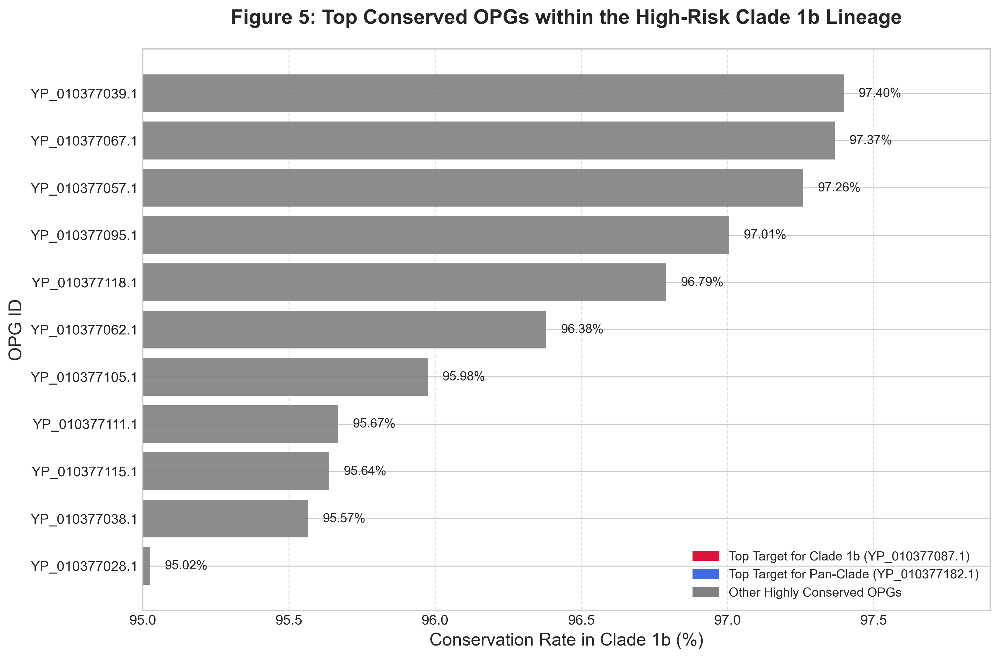

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# --- 1. 설정: 스타일, 파일 경로, 타겟 OPG 정의 ---

# 논문 품질의 그래프를 위한 스타일 설정
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial'],
    'font.size': 12,
    'axes.titlesize': 16,
    'axes.labelsize': 14,
    'xtick.labelsize': 11,
    'ytick.labelsize': 11,
    'legend.fontsize': 10,
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'savefig.bbox': 'tight'
})

# 분석할 파일 경로 (사용자가 알려준 정확한 경로)
CLADE1B_FILE_PATH = "mpxv_clade_specific_analysis/clade1b_specific_OPGs_relative.csv"
OUTPUT_DIR = "publication_figures"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# 그래프에서 강조할 핵심 OPG
PAN_CLADE_TARGET = 'YP_010377182.1'  # Pan-clade에서 우수했던 타겟
CLADE_1B_TARGET = 'YP_010377087.1'   # Clade 1b에서 새롭게 발견된 최우수 타겟

# --- 2. 데이터 로딩 및 준비 ---

try:
    # Clade 1b 분석 데이터 로드
    df_clade1b = pd.read_csv(CLADE1B_FILE_PATH)
    print(f"데이터 로드 완료: {CLADE1B_FILE_PATH}")

    # Clade 1b 보존율(Conservation_clade1b)이 95% 이상인 데이터만 필터링
    df_filtered = df_clade1b[df_clade1b['Conservation_clade1b'] >= 95].copy()

    # Clade 1b 보존율 기준으로 내림차순 정렬
    df_sorted = df_filtered.sort_values('Conservation_clade1b', ascending=False)
    
except FileNotFoundError:
    print(f"오류: 파일을 찾을 수 없습니다 -> '{CLADE1B_FILE_PATH}'")
    df_sorted = None
except KeyError:
    print("오류: CSV 파일에 'Conservation_clade1b' 열이 없습니다. 열 이름을 확인해주세요.")
    df_sorted = None

# --- 3. Figure 5 생성 ---

if df_sorted is not None and not df_sorted.empty:
    fig, ax = plt.subplots(figsize=(12, 8))

    # 각 OPG에 대한 색상 리스트 생성
    bar_colors = []
    for opg in df_sorted['OPG']:
        if opg == CLADE_1B_TARGET:
            bar_colors.append('crimson')  # Clade 1b 최고 타겟은 진홍색
        elif opg == PAN_CLADE_TARGET:
            bar_colors.append('royalblue') # Pan-clade 최고 타겟은 파란색
        else:
            bar_colors.append('grey')      # 나머지는 회색

    # 수평 막대그래프 생성
    bars = ax.barh(
        df_sorted['OPG'],
        df_sorted['Conservation_clade1b'],
        color=bar_colors,
        alpha=0.9
    )

    # 막대 끝에 보존율(%) 텍스트 추가
    for bar in bars:
        width = bar.get_width()
        ax.text(width + 0.05, bar.get_y() + bar.get_height()/2.,
                f'{width:.2f}%',
                ha='left', va='center', fontsize=10)

    # --- 4. 그래프 스타일링 ---
    ax.set_title('Figure 5: Top Conserved OPGs within the High-Risk Clade 1b Lineage', fontweight='bold', pad=20)
    ax.set_xlabel('Conservation Rate in Clade 1b (%)')
    ax.set_ylabel('OPG ID')
    ax.set_xlim(95, max(df_sorted['Conservation_clade1b']) + 0.5) # x축 범위를 95%부터 시작하여 차이 강조
    ax.invert_yaxis() # 가장 높은 값이 위로 오도록 y축 순서 뒤집기
    ax.grid(axis='x', linestyle='--', alpha=0.6)

    # 범례(Legend) 생성
    legend_patches = [
        plt.Rectangle((0,0),1,1, color='crimson', label=f'Top Target for Clade 1b ({CLADE_1B_TARGET})'),
        plt.Rectangle((0,0),1,1, color='royalblue', label=f'Top Target for Pan-Clade ({PAN_CLADE_TARGET})'),
        plt.Rectangle((0,0),1,1, color='grey', label='Other Highly Conserved OPGs')
    ]
    ax.legend(handles=legend_patches, loc='lower right')

    # --- 5. 파일 저장 ---
    output_file = os.path.join(OUTPUT_DIR, "Figure_5_Clade1b_Top_Targets.png")
    plt.savefig(output_file)
    print(f"새로운 Figure 5 저장 완료: {output_file}")
    plt.show()
else:
    print("그래프를 생성할 데이터가 없습니다. CSV 파일 내용이나 경로를 확인해주세요.")



데이터 로드 완료: mpxv_clade_specific_analysis/clade1b_specific_OPGs_relative.csv
새로운 Figure 5 저장 완료: publication_figures/Figure_5_Clade1b_Specificity_Plot.png


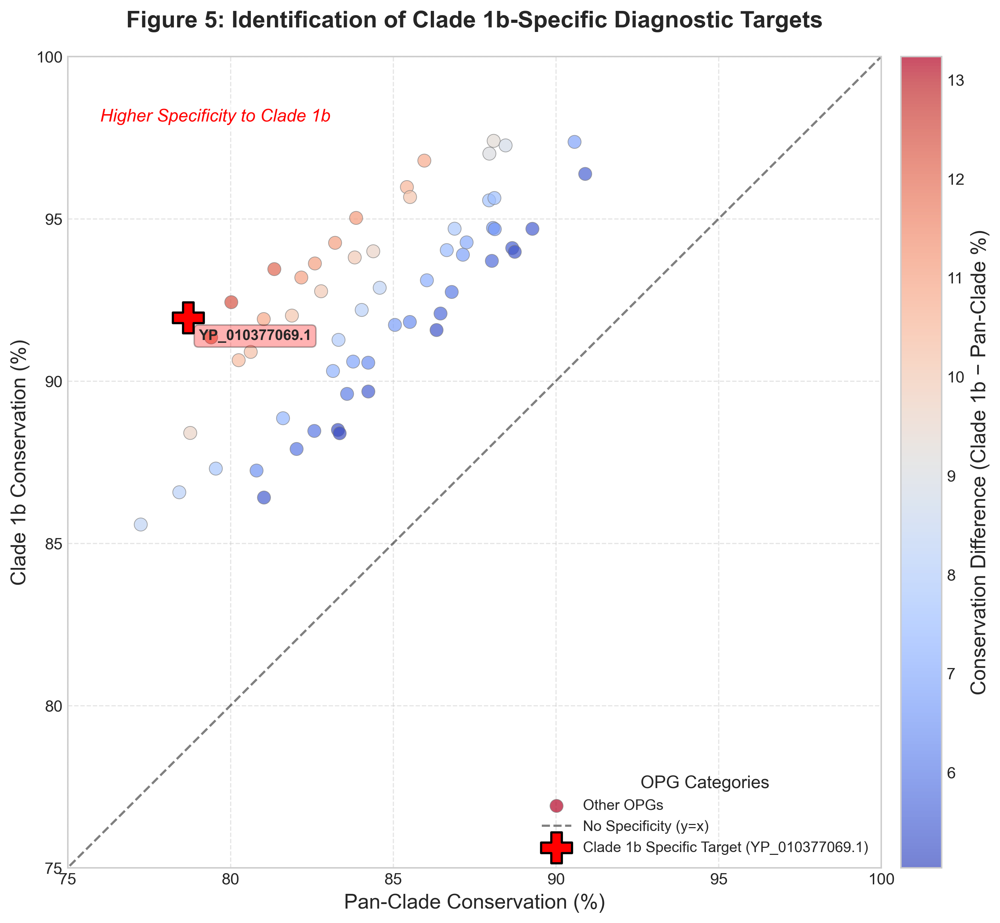

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# --- 1. 설정: 스타일, 파일 경로, 타겟 OPG 정의 ---
plt.rcParams.update({
    'font.family': 'sans-serif', 'font.sans-serif': ['Arial'], 'font.size': 12,
    'axes.titlesize': 16, 'axes.labelsize': 14, 'xtick.labelsize': 11,
    'ytick.labelsize': 11, 'legend.fontsize': 10, 'figure.dpi': 300
})

# 분석할 파일의 정확한 경로
CLADE1B_FILE_PATH = "mpxv_clade_specific_analysis/clade1b_specific_OPGs_relative.csv"
OUTPUT_DIR = "publication_figures"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# 그래프에서 강조할 핵심 OPG
PAN_CLADE_TARGET = 'YP_010377182.1'
CLADE1B_SPECIFIC_TARGET = 'YP_010377069.1'
CONVENTIONAL_TARGET = 'YP_010377054.1' # 비교를 위한 기존 타겟

# --- 2. 데이터 로딩 ---
try:
    df = pd.read_csv(CLADE1B_FILE_PATH)
    print(f"데이터 로드 완료: {CLADE1B_FILE_PATH}")
except FileNotFoundError:
    df = None
    print(f"오류: 파일을 찾을 수 없습니다 -> '{CLADE1B_FILE_PATH}'")

# --- 3. Figure 5 생성 ---
if df is not None:
    fig, ax = plt.subplots(figsize=(12, 10))

    # 배경 OPG들 플로팅 (색상은 보존율 차이로 표현)
    scatter = ax.scatter(
        df['Conservation_all_clades'],
        df['Conservation_clade1b'],
        c=df['conservation_difference'],
        cmap='coolwarm', # 파랑(음수) <-> 흰색(0) <-> 빨강(양수)
        s=80,
        alpha=0.7,
        edgecolors='grey',
        linewidth=0.5,
        label='Other OPGs'
    )

    # 대각선 (y=x) 추가: 이 선 위에 있으면 특이성이 없음
    ax.plot([0, 100], [0, 100], 'k--', alpha=0.5, label='No Specificity (y=x)')

    # --- 강조할 OPG들 플로팅 ---
    targets_to_plot = {
        'Clade 1b Specific Target': (CLADE1B_SPECIFIC_TARGET, 'P', 450, 'red'), # P = Plus
        'Pan-Clade Target': (PAN_CLADE_TARGET, '*', 400, 'blue'),
        'Conventional Target': (CONVENTIONAL_TARGET, 's', 300, 'green') # s = square
    }

    for label, (opg_id, marker, size, color) in targets_to_plot.items():
        target_data = df[df['OPG'] == opg_id]
        if not target_data.empty:
            ax.scatter(
                target_data['Conservation_all_clades'],
                target_data['Conservation_clade1b'],
                color=color, s=size, marker=marker,
                edgecolors='black', linewidth=1.5,
                label=f"{label} ({opg_id})",
                zorder=10
            )
            # 이름표(annotation) 추가
            ax.annotate(
                opg_id,
                (target_data['Conservation_all_clades'].iloc[0], target_data['Conservation_clade1b'].iloc[0]),
                xytext=(7, -15), textcoords='offset points', fontsize=10, fontweight='bold',
                bbox=dict(boxstyle='round,pad=0.3', fc=color, alpha=0.3)
            )

    # --- 4. 그래프 스타일링 ---
    ax.set_title('Figure 5: Identification of Clade 1b-Specific Diagnostic Targets', fontweight='bold', pad=20)
    ax.set_xlabel('Pan-Clade Conservation (%)')
    ax.set_ylabel('Clade 1b Conservation (%)')
    ax.set_xlim(75, 100)
    ax.set_ylim(75, 100)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.legend(title='OPG Categories', loc='lower right')
    
    # 컬러바 추가
    cbar = fig.colorbar(scatter, ax=ax, pad=0.02)
    cbar.set_label('Conservation Difference (Clade 1b − Pan-Clade %)')
    
    # 특이 영역 텍스트 추가
    ax.text(76, 98, 'Higher Specificity to Clade 1b', fontsize=12, style='italic', color='red',
            bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

    # --- 5. 파일 저장 ---
    output_file = os.path.join(OUTPUT_DIR, "Figure_5_Clade1b_Specificity_Plot.png")
    plt.savefig(output_file)
    print(f"새로운 Figure 5 저장 완료: {output_file}")
    plt.show()
else:
    print("그래프를 생성할 수 없습니다.")


데이터 로드 완료: mpxv_clade_specific_analysis/clade1b_specific_OPGs_relative.csv
설득력을 강화한 새로운 Figure 5 저장 완료: publication_figures/Figure_5_Persuasive_Specificity_Plot.png


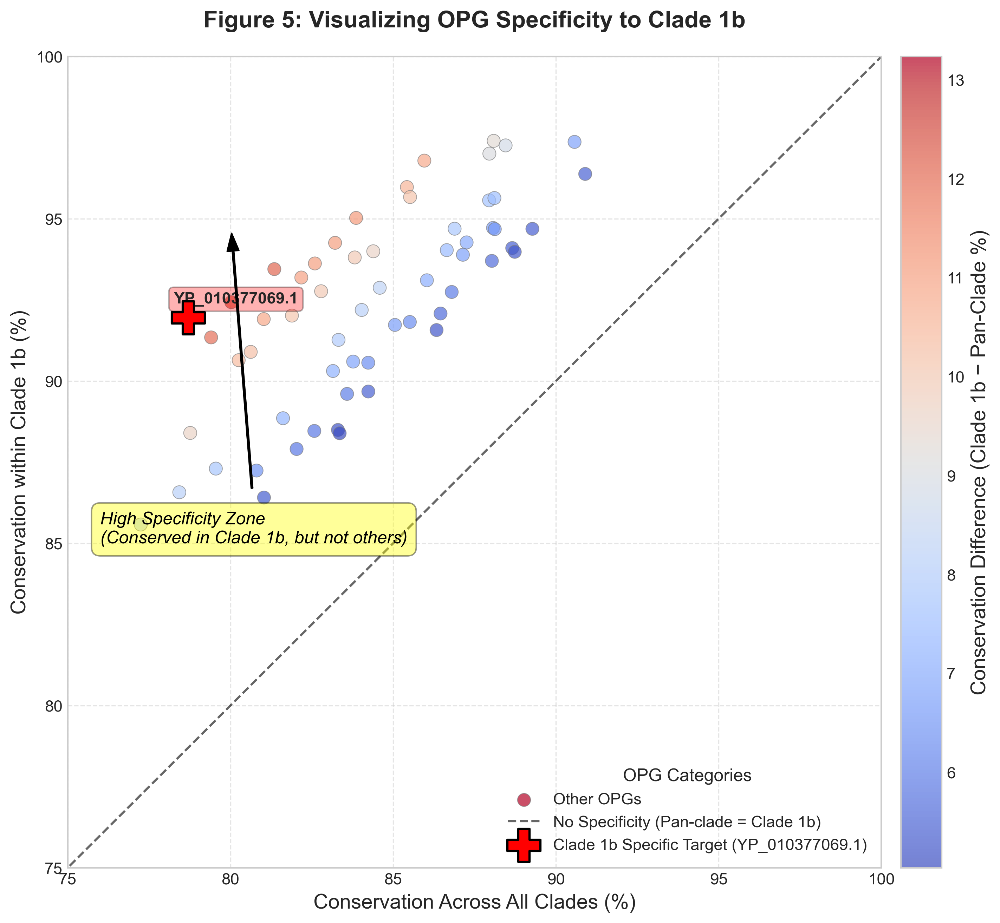

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# --- 1. 설정: 스타일, 파일 경로, 타겟 OPG 정의 ---
plt.rcParams.update({
    'font.family': 'sans-serif', 'font.sans-serif': ['Arial'], 'font.size': 12,
    'axes.titlesize': 16, 'axes.labelsize': 14, 'xtick.labelsize': 11,
    'ytick.labelsize': 11, 'legend.fontsize': 11, 'figure.dpi': 300
})

# 분석할 파일의 정확한 경로
CLADE1B_FILE_PATH = "mpxv_clade_specific_analysis/clade1b_specific_OPGs_relative.csv"
OUTPUT_DIR = "publication_figures"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# 그래프에서 역할을 부여하여 강조할 핵심 OPG
PAN_CLADE_TARGET = 'YP_010377182.1'      # 범용 타겟 (대각선 근처)
CLADE1B_SPECIFIC_TARGET = 'YP_010377069.1' # 특이 타겟 (대각선에서 가장 멈)

# --- 2. 데이터 로딩 ---
try:
    df = pd.read_csv(CLADE1B_FILE_PATH)
    print(f"데이터 로드 완료: {CLADE1B_FILE_PATH}")
except FileNotFoundError:
    df = None
    print(f"오류: 파일을 찾을 수 없습니다 -> '{CLADE1B_FILE_PATH}'")

# --- 3. Figure 5 생성 ---
if df is not None:
    fig, ax = plt.subplots(figsize=(12, 10))

    # 배경 OPG들 플로팅 (색상은 보존율 차이로 표현)
    scatter = ax.scatter(
        df['Conservation_all_clades'],
        df['Conservation_clade1b'],
        c=df['conservation_difference'],
        cmap='coolwarm', # 파랑(음수) <-> 흰색(0) <-> 빨강(양수)
        s=80,
        alpha=0.7,
        edgecolors='grey',
        linewidth=0.5,
        label='Other OPGs'
    )

    # 대각선 (y=x) 추가: 이 선은 Pan-clade와 Clade 1b 보존율이 동일함을 의미
    ax.plot([0, 100], [0, 100], 'k--', alpha=0.6, label='No Specificity (Pan-clade = Clade 1b)')

    # --- 강조할 OPG들 플로팅 ---
    # Clade 1b 특이 타겟
    specific_target_data = df[df['OPG'] == CLADE1B_SPECIFIC_TARGET]
    if not specific_target_data.empty:
        ax.scatter(
            specific_target_data['Conservation_all_clades'],
            specific_target_data['Conservation_clade1b'],
            color='red', s=500, marker='P', # P = Plus
            edgecolors='black', linewidth=1.5,
            label=f'Clade 1b Specific Target ({CLADE1B_SPECIFIC_TARGET})',
            zorder=11
        )
        ax.annotate(
            CLADE1B_SPECIFIC_TARGET,
            (specific_target_data['Conservation_all_clades'].iloc[0], specific_target_data['Conservation_clade1b'].iloc[0]),
            xytext=(-10, 10), textcoords='offset points', fontsize=11, fontweight='bold',
            bbox=dict(boxstyle='round,pad=0.3', fc='red', alpha=0.3)
        )

    # 범용 타겟
    pan_clade_target_data = df[df['OPG'] == PAN_CLADE_TARGET]
    if not pan_clade_target_data.empty:
        ax.scatter(
            pan_clade_target_data['Conservation_all_clades'],
            pan_clade_target_data['Conservation_clade1b'],
            color='blue', s=400, marker='*',
            edgecolors='black', linewidth=1.5,
            label=f'Pan-Clade Target ({PAN_CLADE_TARGET})',
            zorder=10
        )
        ax.annotate(
            PAN_CLADE_TARGET,
            (pan_clade_target_data['Conservation_all_clades'].iloc[0], pan_clade_target_data['Conservation_clade1b'].iloc[0]),
            xytext=(10, -20), textcoords='offset points', fontsize=11, fontweight='bold',
            bbox=dict(boxstyle='round,pad=0.3', fc='blue', alpha=0.3)
        )

    # --- 4. 그래프 스타일링 및 설득력 강화 ---
    ax.set_title('Figure 5: Visualizing OPG Specificity to Clade 1b', fontweight='bold', pad=20)
    ax.set_xlabel('Conservation Across All Clades (%)')
    ax.set_ylabel('Conservation within Clade 1b (%)')
    ax.set_xlim(75, 100)
    ax.set_ylim(75, 100)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.legend(title='OPG Categories', loc='lower right')
    
    # 컬러바 추가
    cbar = fig.colorbar(scatter, ax=ax, pad=0.02)
    cbar.set_label('Conservation Difference (Clade 1b − Pan-Clade %)')
    
    # '높은 특이성' 영역을 화살표와 텍스트로 명확히 설명
    ax.annotate('High Specificity Zone\n(Conserved in Clade 1b, but not others)',
                xy=(80, 95), xytext=(76, 85),
                arrowprops=dict(facecolor='black', shrink=0.05, width=1, headwidth=8),
                fontsize=12, style='italic', color='black',
                bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.4))

    # --- 5. 파일 저장 ---
    output_file = os.path.join(OUTPUT_DIR, "Figure_5_Persuasive_Specificity_Plot.png")
    plt.savefig(output_file)
    print(f"설득력을 강화한 새로운 Figure 5 저장 완료: {output_file}")
    plt.show()
else:
    print("그래프를 생성할 수 없습니다.")



Pan-clade 데이터 로드 완료: opg_analysis_results/opg_analysis_summary_clade_all.csv
Clade 1b 데이터 로드 완료: mpxv_clade_specific_analysis/clade1b_specific_OPGs_relative.csv

--- Figure 3 생성 ---
개선된 Figure 3 저장 완료: publication_figures/Figure_3_Distribution_Comparison.png


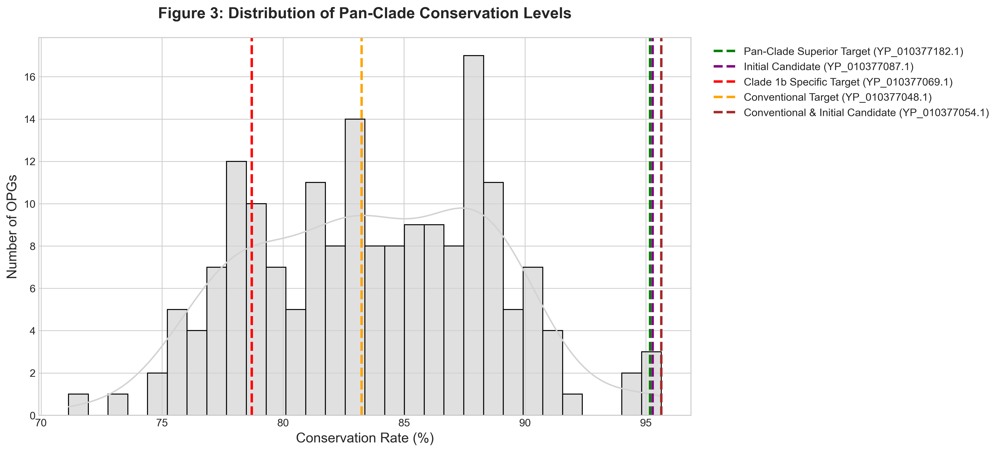


--- Figure 5 생성 ---
개선된 Figure 5 저장 완료: publication_figures/Figure_5_Clade1b_Specificity_Analysis.png


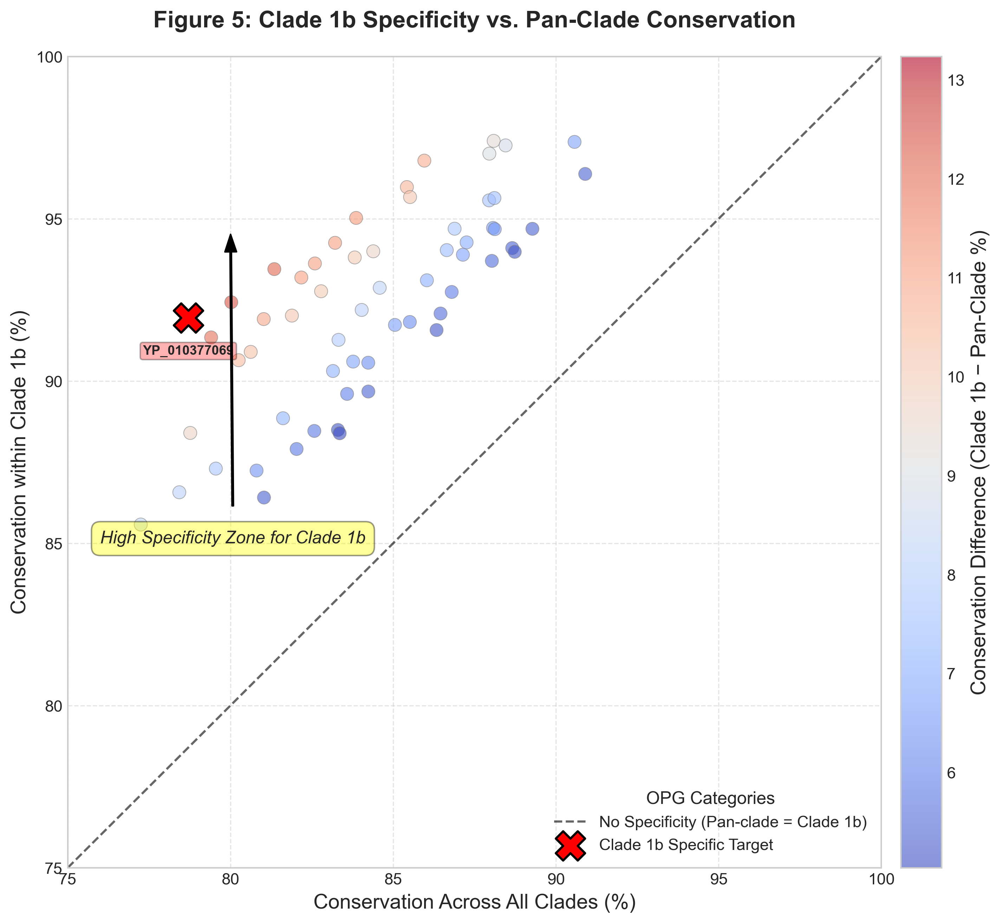

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# --- 1. 설정: 스타일, 파일 경로, 핵심 OPG 정의 ---

# 논문 품질의 그래프를 위한 스타일 설정
plt.rcParams.update({
    'font.family': 'sans-serif', 'font.sans-serif': ['Arial'], 'font.size': 12,
    'axes.titlesize': 16, 'axes.labelsize': 14, 'xtick.labelsize': 11,
    'ytick.labelsize': 11, 'legend.fontsize': 11, 'figure.dpi': 300
})

# 분석할 파일 경로
PAN_CLADE_FILE_PATH = "opg_analysis_results/opg_analysis_summary_clade_all.csv"
CLADE1B_FILE_PATH = "mpxv_clade_specific_analysis/clade1b_specific_OPGs_relative.csv"
OUTPUT_DIR = "publication_figures"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# --- 핵심 OPG 그룹 및 시각적 스타일 정의 (모든 Figure에서 일관되게 사용) ---
KEY_OPGS = {
    # Pan-Clade에서 찾은 후보 3개
    'YP_010377182.1': {'label': 'Pan-Clade Superior Target', 'color': 'green', 'marker': 'P', 'zorder': 12},
    'YP_010377087.1': {'label': 'Initial Candidate', 'color': 'purple', 'marker': 'D', 'zorder': 10},
    
    # Clade 1b 특이 후보 1개
    'YP_010377069.1': {'label': 'Clade 1b Specific Target', 'color': 'red', 'marker': 'X', 'zorder': 11},
    
    # 기존 진단 타겟 2개 (+ YP_010377054.1)
    'YP_010377048.1': {'label': 'Conventional Target', 'color': 'orange', 'marker': 's', 'zorder': 9},
    'YP_010377054.1': {'label': 'Conventional & Initial Candidate', 'color': 'brown', 'marker': 'o', 'zorder': 10}
}

# --- 2. 데이터 로딩 함수 ---
def load_data():
    """두 개의 CSV 파일을 로드하는 함수"""
    try:
        df_pan_clade = pd.read_csv(PAN_CLADE_FILE_PATH)
        print(f"Pan-clade 데이터 로드 완료: {PAN_CLADE_FILE_PATH}")
    except FileNotFoundError:
        df_pan_clade = None
        print(f"오류: 파일을 찾을 수 없습니다 -> '{PAN_CLADE_FILE_PATH}'")
        
    try:
        df_clade1b = pd.read_csv(CLADE1B_FILE_PATH)
        print(f"Clade 1b 데이터 로드 완료: {CLADE1B_FILE_PATH}")
    except FileNotFoundError:
        df_clade1b = None
        print(f"오류: 파일을 찾을 수 없습니다 -> '{CLADE1B_FILE_PATH}'")
        
    return df_pan_clade, df_clade1b

# --- 3. Figure 3 생성 함수 (보존율 분포 비교) ---
def create_figure_3_comparison(data):
    if data is None: return

    fig, ax = plt.subplots(figsize=(12, 7))
    sns.histplot(data['Conservation'], bins=30, kde=True, color='lightgrey', ax=ax, alpha=0.7)

    # 핵심 OPG들의 보존율을 수직선으로 표시
    plotted_labels = set()
    for opg_id, style in KEY_OPGS.items():
        opg_data = data[data['OPG'] == opg_id]
        if not opg_data.empty:
            conservation = opg_data['Conservation'].iloc[0]
            label = f"{style['label']} ({opg_id})"
            if label not in plotted_labels:
                ax.axvline(x=conservation, color=style['color'], linestyle='--', linewidth=2.5, label=label)
                plotted_labels.add(label)

    ax.set_title('Figure 3: Distribution of Pan-Clade Conservation Levels', fontweight='bold', pad=20)
    ax.set_xlabel('Conservation Rate (%)')
    ax.set_ylabel('Number of OPGs')
    ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
    
    output_file = os.path.join(OUTPUT_DIR, "Figure_3_Distribution_Comparison.png")
    plt.savefig(output_file)
    print(f"개선된 Figure 3 저장 완료: {output_file}")
    plt.show()

# --- 4. Figure 5 생성 함수 (Clade 1b 특이성 분석) ---
def create_figure_5_specificity(data):
    if data is None: return

    fig, ax = plt.subplots(figsize=(12, 10))
    
    # 배경 OPG 플로팅
    scatter = ax.scatter(
        data['Conservation_all_clades'], data['Conservation_clade1b'],
        c=data['conservation_difference'], cmap='coolwarm',
        s=80, alpha=0.6, edgecolors='grey', linewidth=0.5
    )
    
    # '특이성 없음' 기준선
    ax.plot([75, 100], [75, 100], 'k--', alpha=0.6, label='No Specificity (Pan-clade = Clade 1b)')

    # 핵심 OPG 강조하여 플로팅
    for opg_id, style in KEY_OPGS.items():
        opg_data = data[data['OPG'] == opg_id]
        if not opg_data.empty:
            ax.scatter(
                opg_data['Conservation_all_clades'], opg_data['Conservation_clade1b'],
                color=style['color'], s=400, marker=style['marker'],
                edgecolors='black', linewidth=1.5, label=style['label'], zorder=style['zorder']
            )
            ax.annotate(
                opg_id.split('.')[0], # 이름이 길어서 .1 제외
                (opg_data['Conservation_all_clades'].iloc[0], opg_data['Conservation_clade1b'].iloc[0]),
                xytext=(0, -25), textcoords='offset points', ha='center',
                fontsize=9, fontweight='bold',
                bbox=dict(boxstyle='round,pad=0.2', fc=style['color'], alpha=0.3)
            )

    ax.set_title('Figure 5: Clade 1b Specificity vs. Pan-Clade Conservation', fontweight='bold', pad=20)
    ax.set_xlabel('Conservation Across All Clades (%)')
    ax.set_ylabel('Conservation within Clade 1b (%)')
    ax.set_xlim(75, 100)
    ax.set_ylim(75, 100)
    ax.grid(True, linestyle='--', alpha=0.5)
    
    # 범례 핸들 중복 제거 및 정리
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys(), title='OPG Categories', loc='lower right')
    
    cbar = fig.colorbar(scatter, ax=ax, pad=0.02)
    cbar.set_label('Conservation Difference (Clade 1b − Pan-Clade %)')
    
    ax.annotate('High Specificity Zone for Clade 1b',
                xy=(80, 95), xytext=(76, 85),
                arrowprops=dict(facecolor='black', shrink=0.05, width=1, headwidth=8),
                fontsize=12, style='italic',
                bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.4))

    output_file = os.path.join(OUTPUT_DIR, "Figure_5_Clade1b_Specificity_Analysis.png")
    plt.savefig(output_file)
    print(f"개선된 Figure 5 저장 완료: {output_file}")
    plt.show()

# --- 5. 메인 실행 ---
if __name__ == "__main__":
    df_pan_clade, df_clade1b = load_data()
    
    print("\n--- Figure 3 생성 ---")
    create_figure_3_comparison(df_pan_clade)
    
    print("\n--- Figure 5 생성 ---")
    create_figure_5_specificity(df_clade1b)


결과는 'clade1b_longitudinal_analysis_results' 디렉토리에 저장됩니다.

1. Clade 1b 특이 OPG 데이터 로드 중: mpxv_clade_specific_analysis/clade1b_specific_OPGs_relative.csv
로드 완료. Clade 1b에 가장 특이적인 상위 10개 OPG를 분석합니다.

2. GFF 파일 파싱 중: mpxv_reference.gff
GFF 파싱 완료: 179개 OPG 위치 정보 확보

3. 최신 시퀀스(2023-2025) 데이터 로드 중: mpxv isolates 2023-2025.fasta
로드 완료: 200개 시퀀스

4. Clade 1b 특이 OPG의 시간적 안정성 분석 시작...
  - YP_010377069.1 분석 완료: 91.94% -> 92.78% (변화: +0.84%)
  - YP_010377116.1 분석 완료: 92.43% -> 93.84% (변화: +1.41%)
  - YP_010377145.1 분석 완료: 93.45% -> 91.68% (변화: -1.76%)
  - YP_010377049.1 분석 완료: 91.34% -> 91.02% (변화: -0.33%)
  - YP_010377028.1 분석 완료: 95.02% -> 90.67% (변화: -4.36%)
  - YP_010377080.1 분석 완료: 94.26% -> 91.19% (변화: -3.06%)
  - YP_010377084.1 분석 완료: 93.62% -> 92.07% (변화: -1.56%)
  - YP_010377061.1 분석 완료: 93.19% -> 92.05% (변화: -1.14%)
  - YP_010377059.1 분석 완료: 91.91% -> 94.42% (변화: +2.51%)
  - YP_010377118.1 분석 완료: 96.79% -> 94.51% (변화: -2.28%)

분석 완료. 결과가 CSV 파일로 저장되었습니다: clade1b_longitudinal_analysis_resul

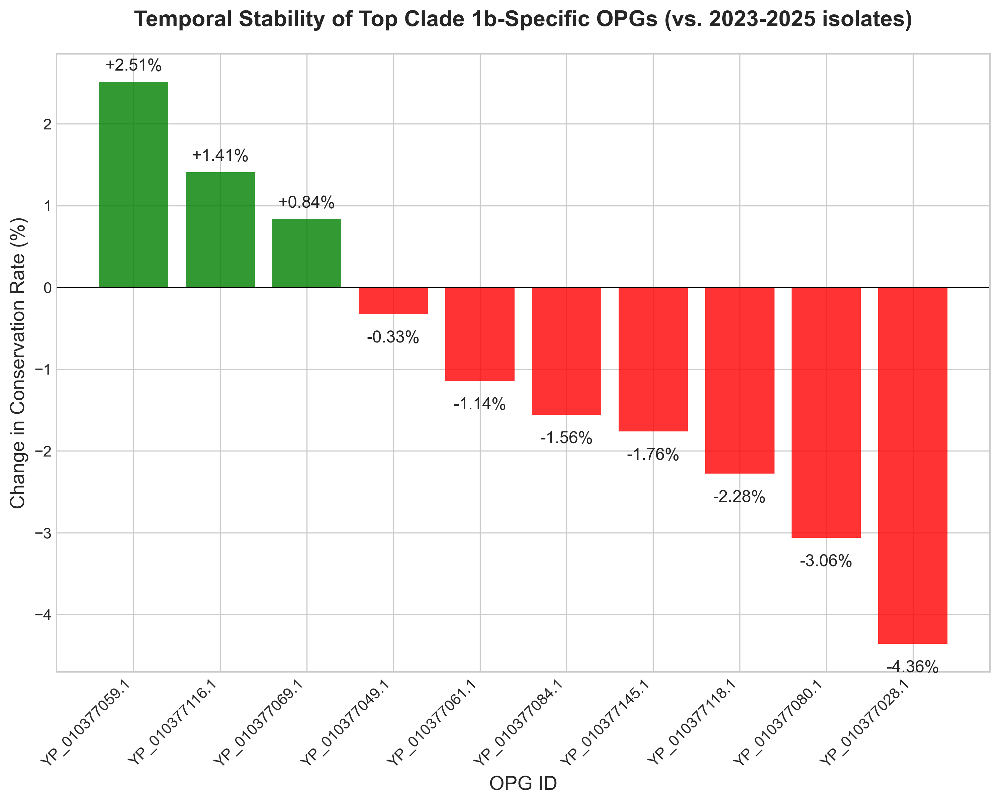

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os
import re
from Bio import SeqIO, AlignIO
from Bio.Seq import Seq
from Bio.SeqRecord import SeqRecord
from collections import defaultdict
import subprocess
import tempfile
import shutil

class Clade1bLongitudinalAnalyzer:
    """
    Clade 1b에 특이적인 OPG들의 시간 경과에 따른 보존율 변화(종단 분석)를 수행합니다.
    """
    def __init__(self, opg_file, new_seq_file, gff_file, output_dir="clade1b_longitudinal_analysis_results"):
        self.opg_file = opg_file
        self.new_seq_file = new_seq_file
        self.gff_file = gff_file
        self.output_dir = output_dir
        self.opg_data_to_analyze = None
        self.new_sequences = []
        self.opg_features = defaultdict(list)
        self.analysis_results = None
        
        os.makedirs(output_dir, exist_ok=True)
        self.temp_dir = os.path.join(output_dir, "temp")
        os.makedirs(self.temp_dir, exist_ok=True)
        print(f"결과는 '{output_dir}' 디렉토리에 저장됩니다.")

    def __del__(self):
        """소멸자: 임시 디렉토리 정리"""
        if self.temp_dir and os.path.exists(self.temp_dir):
            shutil.rmtree(self.temp_dir)

    def load_clade1b_specific_opgs(self, top_n=10):
        """
        Clade 1b 특이 OPG 목록을 로드하고, 분석할 상위 N개 OPG를 선택합니다.
        """
        print(f"\n1. Clade 1b 특이 OPG 데이터 로드 중: {self.opg_file}")
        try:
            df = pd.read_csv(self.opg_file)
            # 'conservation_difference'가 가장 큰, 즉 가장 특이적인 OPG 순으로 정렬
            df_sorted = df.sort_values('conservation_difference', ascending=False)
            self.opg_data_to_analyze = df_sorted.head(top_n)
            print(f"로드 완료. Clade 1b에 가장 특이적인 상위 {top_n}개 OPG를 분석합니다.")
            return True
        except FileNotFoundError:
            print(f"오류: 파일을 찾을 수 없습니다 -> '{self.opg_file}'")
            return False
        except KeyError:
            print("오류: CSV 파일에 'conservation_difference' 열이 없습니다.")
            return False

    def parse_gff(self):
        """GFF 파일에서 모든 OPG의 위치 정보를 추출합니다."""
        print(f"\n2. GFF 파일 파싱 중: {self.gff_file}")
        try:
            with open(self.gff_file, 'r') as f:
                for line in f:
                    # 주석 줄은 먼저 건너뜁니다.
                    if line.startswith('#'):
                        continue
                    
                    # *** 오류 수정 부분: 라인을 먼저 분할하여 'parts'를 생성합니다. ***
                    parts = line.strip().split('\t')
                    
                    # 'parts'가 생성된 후에 조건을 확인합니다.
                    # GFF 형식이 올바르지 않은 줄을 건너뛰기 위해 길이 확인 추가
                    if len(parts) < 9 or parts[2] != 'CDS':
                        continue

                    attributes = parts[8]
                    opg_match = re.search(r'Name=([^;]+)', attributes)
                    if opg_match:
                        opg_id = opg_match.group(1)
                        self.opg_features[opg_id].append({
                            'start': int(parts[3]), 'end': int(parts[4]), 'strand': parts[6]
                        })
            print(f"GFF 파싱 완료: {len(self.opg_features)}개 OPG 위치 정보 확보")
            return True
        except FileNotFoundError:
            print(f"오류: GFF 파일을 찾을 수 없습니다 -> '{self.gff_file}'")
            return False

    def load_new_sequences(self):
        """새로운 MPXV 시퀀스 데이터(2023-2025)를 로드합니다."""
        print(f"\n3. 최신 시퀀스(2023-2025) 데이터 로드 중: {self.new_seq_file}")
        try:
            self.new_sequences = list(SeqIO.parse(self.new_seq_file, "fasta"))
            print(f"로드 완료: {len(self.new_sequences)}개 시퀀스")
            return True
        except FileNotFoundError:
            print(f"오류: FASTA 파일을 찾을 수 없습니다 -> '{self.new_seq_file}'")
            return False

    def calculate_conservation_from_alignment(self, alignment):
        """정렬된 시퀀스로부터 보존율을 계산합니다."""
        if not alignment or len(alignment) == 0: return 0
        length = alignment.get_alignment_length()
        conservation_scores = []
        for i in range(length):
            column = alignment[:, i]
            bases = [base for base in column if base != '-']
            if bases:
                most_common = max(set(bases), key=bases.count)
                conservation = bases.count(most_common) / len(bases)
                conservation_scores.append(conservation)
        return np.mean(conservation_scores) if conservation_scores else 0

    def analyze_temporal_stability(self):
        """
        Clade 1b 특이 OPG들에 대해 최신 시퀀스 데이터셋에서의 보존율을 계산하고 변화를 분석합니다.
        """
        print("\n4. Clade 1b 특이 OPG의 시간적 안정성 분석 시작...")
        results = []
        
        for _, row in self.opg_data_to_analyze.iterrows():
            opg_id = row['OPG']
            # 기준 보존율은 Clade 1b에서의 보존율을 사용
            baseline_conservation = row['Conservation_clade1b']
            
            if opg_id not in self.opg_features:
                print(f"  경고: {opg_id}의 위치 정보가 GFF 파일에 없어 건너뜁니다.")
                continue

            feature = self.opg_features[opg_id][0] # 대표 위치 정보 사용
            opg_sequences = []
            for seq in self.new_sequences:
                if len(seq.seq) < feature['end']: continue
                region_seq = seq.seq[feature['start']-1:feature['end']]
                if feature['strand'] == '-':
                    region_seq = region_seq.reverse_complement()
                opg_sequences.append(SeqRecord(region_seq, id=seq.id))
            
            if len(opg_sequences) < 2: continue

            # MAFFT를 이용한 정렬 및 보존율 계산
            temp_fasta = os.path.join(self.temp_dir, f"{opg_id}.fasta")
            aligned_fasta = os.path.join(self.temp_dir, f"{opg_id}_aligned.fasta")
            SeqIO.write(opg_sequences, temp_fasta, "fasta")
            
            try:
                with open(aligned_fasta, 'w') as outf:
                    subprocess.run(["mafft", "--auto", temp_fasta], stdout=outf, stderr=subprocess.PIPE)
                alignment = AlignIO.read(aligned_fasta, "fasta")
                new_conservation = self.calculate_conservation_from_alignment(alignment) * 100
                
                results.append({
                    'OPG': opg_id,
                    'Baseline_Conservation_in_Clade1b': baseline_conservation,
                    'New_Conservation_in_2023-2025': new_conservation,
                    'Conservation_Change': new_conservation - baseline_conservation
                })
                print(f"  - {opg_id} 분석 완료: {baseline_conservation:.2f}% -> {new_conservation:.2f}% (변화: {new_conservation - baseline_conservation:+.2f}%)")
            except Exception as e:
                print(f"  오류: {opg_id} 분석 중 오류 발생 - {e}")

        self.analysis_results = pd.DataFrame(results)
        output_csv = os.path.join(self.output_dir, "longitudinal_stability_of_clade1b_opgs.csv")
        self.analysis_results.to_csv(output_csv, index=False)
        print(f"\n분석 완료. 결과가 CSV 파일로 저장되었습니다: {output_csv}")

    def plot_results(self):
        """분석 결과를 Figure 4와 유사한 스타일의 막대그래프로 시각화합니다."""
        if self.analysis_results is None or self.analysis_results.empty:
            print("시각화할 데이터가 없습니다.")
            return
            
        df_plot = self.analysis_results.sort_values('Conservation_Change', ascending=False)
        
        fig, ax = plt.subplots(figsize=(12, 8))
        
        colors = ['green' if x >= 0 else 'red' for x in df_plot['Conservation_Change']]
        bars = ax.bar(df_plot['OPG'], df_plot['Conservation_Change'], color=colors, alpha=0.8)
        
        ax.axhline(0, color='black', linewidth=0.8)
        ax.set_title('Temporal Stability of Top Clade 1b-Specific OPGs (vs. 2023-2025 isolates)', fontweight='bold', pad=20)
        ax.set_ylabel('Change in Conservation Rate (%)')
        ax.set_xlabel('OPG ID')
        plt.xticks(rotation=45, ha='right')
        
        # 막대 위에 값 표시
        for bar in bars:
            yval = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2.0, yval + (0.1 if yval > 0 else -0.2),
                    f'{yval:+.2f}%', ha='center', va='bottom' if yval > 0 else 'top')

        output_fig = os.path.join(self.output_dir, "Fig_Clade1b_Temporal_Stability.png")
        plt.savefig(output_fig)
        print(f"결과 그래프 저장 완료: {output_fig}")
        plt.show()

    def run_full_analysis(self):
        """전체 분석 파이프라인을 실행합니다."""
        if self.load_clade1b_specific_opgs() and \
           self.parse_gff() and \
           self.load_new_sequences():
            self.analyze_temporal_stability()
            self.plot_results()

# --- 메인 실행 부분 ---
if __name__ == "__main__":
    # 필요한 파일 경로 설정
    opg_file = "mpxv_clade_specific_analysis/clade1b_specific_OPGs_relative.csv"
    new_seq_file = "mpxv isolates 2023-2025.fasta"
    gff_file = "mpxv_reference.gff"

    # 분석기 실행
    analyzer = Clade1bLongitudinalAnalyzer(opg_file, new_seq_file, gff_file)
    analyzer.run_full_analysis()


--- Figure 2 생성 ---
개선된 Figure 2 (깔때기 차트) 저장 완료: publication_figures/Figure_2_Filtering_Funnel.png


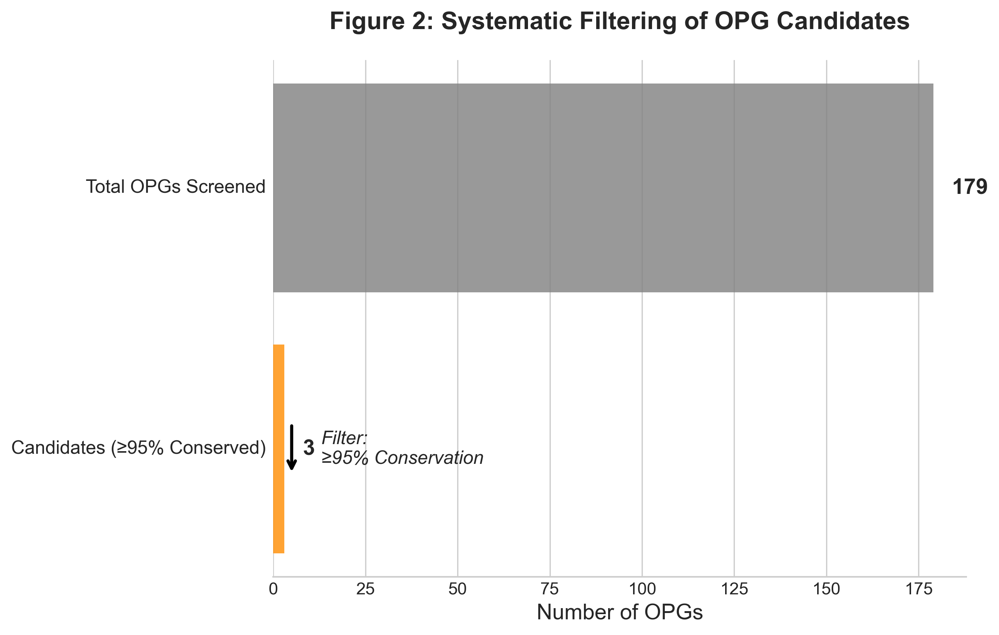


--- Figure 4 생성 ---
개선된 Figure 4 (덤벨 플롯) 저장 완료: publication_figures/Figure_4_Longitudinal_Dumbbell.png


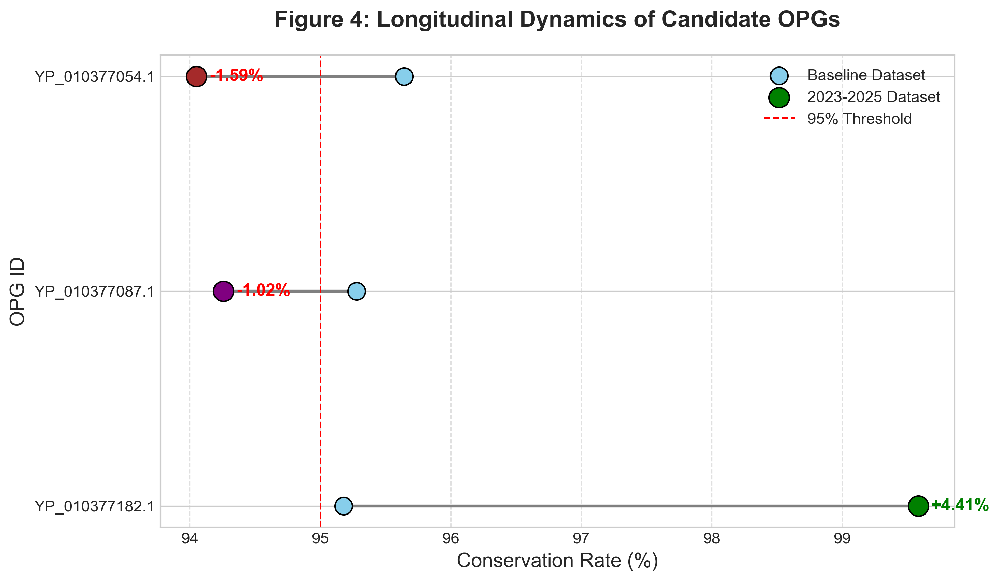

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# --- 1. 설정: 스타일, 파일 경로, 핵심 OPG 정의 ---

# 논문 품질의 그래프를 위한 스타일 설정 (모든 Figure에 일관되게 적용)
plt.rcParams.update({
    'font.family': 'sans-serif', 'font.sans-serif': ['Arial'], 'font.size': 12,
    'axes.titlesize': 16, 'axes.labelsize': 14, 'xtick.labelsize': 11,
    'ytick.labelsize': 11, 'legend.fontsize': 11, 'figure.dpi': 300
})

# 분석할 파일 경로
LONGITUDINAL_FILE_PATH = "expanded_mpxv_analysis_mafft/new_conservation_analysis_mafft.csv"
OUTPUT_DIR = "publication_figures"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# 핵심 OPG 시각적 스타일 정의 (일관성 유지를 위함)
KEY_OPG_STYLES = {
    'YP_010377182.1': {'color': 'green', 'label': 'Pan-Clade Superior Target'},
    'YP_010377087.1': {'color': 'purple', 'label': 'Initial Candidate (Unstable)'},
    'YP_010377054.1': {'color': 'brown', 'label': 'Conventional & Initial Candidate (Unstable)'}
}

# --- 2. Figure 2 생성 함수 (깔때기 차트) ---

def create_figure2_funnel_chart():
    """
    필터링 과정을 보여주는 깔때기 차트(Figure 2)를 생성합니다.
    """
    fig, ax = plt.subplots(figsize=(8, 6))

    # 데이터 정의
    stages = ['Total OPGs Screened', 'Candidates (≥95% Conserved)']
    values = [179, 3]

    # 깔때기 모양을 위한 y 좌표
    y_pos = range(len(stages))
    
    # 막대 너비 (깔때기 모양)
    bar_widths = [val / max(values) * 10 for val in values] # 너비 스케일 조정
    
    # 수평 막대그래프로 깔때기 그리기
    bars = ax.barh(y_pos, values, height=0.8, color=['grey', 'darkorange'], alpha=0.8)
    ax.set_yticks(y_pos)
    ax.set_yticklabels(stages)
    ax.invert_yaxis()  # 위에서 아래로 흐르도록 y축 반전

    # 깔때기 옆에 숫자 표시
    for i, bar in enumerate(bars):
        width = bar.get_width()
        ax.text(width + 5, bar.get_y() + bar.get_height()/2, f'{int(width)}',
                ha='left', va='center', fontsize=14, fontweight='bold')

    # 화살표로 흐름 표시
    ax.annotate('', xy=(values[1] + 2, 1.1), xytext=(values[1] + 2, 0.9),
                arrowprops=dict(arrowstyle='->', color='black', lw=2))
    ax.text(values[1] + 10, 1.0, f'Filter:\n≥95% Conservation', ha='left', va='center', style='italic')


    # 스타일링
    ax.set_title('Figure 2: Systematic Filtering of OPG Candidates', fontweight='bold', pad=20)
    ax.set_xlabel('Number of OPGs')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.get_yaxis().set_visible(False) # y축 라인 숨기기
    ax.tick_params(axis='y', length=0)
    
    # 텍스트 라벨을 y축 대신 사용
    for i, stage in enumerate(stages):
        ax.text(-2, i, stage, ha='right', va='center', fontsize=12)

    # 파일 저장
    output_file = os.path.join(OUTPUT_DIR, "Figure_2_Filtering_Funnel.png")
    plt.savefig(output_file, bbox_inches='tight')
    print(f"개선된 Figure 2 (깔때기 차트) 저장 완료: {output_file}")
    plt.show()


# --- 3. Figure 4 생성 함수 (덤벨 플롯) ---

def create_figure4_dumbbell_plot(filepath):
    """
    종단 분석 결과를 보여주는 덤벨 플롯(Figure 4)을 생성합니다.
    """
    try:
        df = pd.read_csv(filepath)
    except FileNotFoundError:
        print(f"오류: Figure 4 데이터 파일을 찾을 수 없습니다 -> '{filepath}'")
        return

    # 분석 대상인 3개의 OPG만 필터링
    target_opgs = list(KEY_OPG_STYLES.keys())
    df_plot = df[df['OPG'].isin(target_opgs)].set_index('OPG').loc[target_opgs]

    fig, ax = plt.subplots(figsize=(10, 6))

    # 덤벨 플롯 그리기
    for i, (opg_id, row) in enumerate(df_plot.iterrows()):
        style = KEY_OPG_STYLES[opg_id]
        # 두 점을 잇는 선 (덤벨)
        ax.plot([row['Original_Conservation'], row['New_Conservation']], [i, i],
                color='grey', lw=2, zorder=1)
        # 시작점 (Baseline)
        ax.scatter(row['Original_Conservation'], i, color='skyblue', s=150,
                   edgecolor='black', zorder=2, label='Baseline Dataset' if i == 0 else "")
        # 끝점 (2023-2025)
        ax.scatter(row['New_Conservation'], i, color=style['color'], s=200,
                   edgecolor='black', zorder=2, label='2023-2025 Dataset' if i == 0 else "")
        
        # 변화량 텍스트 표시
        change = row['Conservation_Change']
        color = 'green' if change > 0 else 'red'
        ax.text(row['New_Conservation'] + 0.1, i, f'{change:+.2f}%',
                color=color, ha='left', va='center', fontweight='bold')

    # 스타일링
    ax.set_yticks(range(len(df_plot)))
    ax.set_yticklabels(df_plot.index)
    ax.set_xlabel('Conservation Rate (%)')
    ax.set_ylabel('OPG ID')
    ax.set_title('Figure 4: Longitudinal Dynamics of Candidate OPGs', fontweight='bold', pad=20)
    ax.axvline(x=95, color='red', linestyle='--', linewidth=1.2, label='95% Threshold')
    ax.grid(axis='x', linestyle='--', alpha=0.6)
    ax.legend()

    # 파일 저장
    output_file = os.path.join(OUTPUT_DIR, "Figure_4_Longitudinal_Dumbbell.png")
    plt.savefig(output_file, bbox_inches='tight')
    print(f"개선된 Figure 4 (덤벨 플롯) 저장 완료: {output_file}")
    plt.show()


# --- 4. 메인 실행 ---
if __name__ == "__main__":
    print("--- Figure 2 생성 ---")
    create_figure2_funnel_chart()
    
    print("\n--- Figure 4 생성 ---")
    create_figure4_dumbbell_plot(LONGITUDINAL_FILE_PATH)



결과는 'clade1b_longitudinal_analysis_results' 디렉토리에 저장됩니다.

1. Clade 1b 특이 OPG 데이터 로드 중: mpxv_clade_specific_analysis/clade1b_specific_OPGs_relative.csv
로드 완료. Clade 1b에 가장 특이적인 상위 10개 OPG를 분석합니다.

2. GFF 파일 파싱 중: mpxv_reference.gff
GFF 파싱 완료: 179개 OPG 위치 정보 확보

3. 최신 Clade 1b 시퀀스(2023-2025) 데이터 로드 중: mpxv isolates 1b 2023-2025.fasta
로드 완료: 21개 시퀀스

4. Clade 1b 특이 OPG의 시간적 안정성 분석 시작...
  - YP_010377069.1 분석 완료: 91.94% -> 100.00% (변화: +8.06%)
  - YP_010377116.1 분석 완료: 92.43% -> 99.99% (변화: +7.56%)
  - YP_010377145.1 분석 완료: 93.45% -> 100.00% (변화: +6.55%)
  - YP_010377049.1 분석 완료: 91.34% -> 100.00% (변화: +8.66%)
  - YP_010377028.1 분석 완료: 95.02% -> 99.99% (변화: +4.97%)
  - YP_010377080.1 분석 완료: 94.26% -> 99.99% (변화: +5.74%)
  - YP_010377084.1 분석 완료: 93.62% -> 100.00% (변화: +6.38%)
  - YP_010377061.1 분석 완료: 93.19% -> 100.00% (변화: +6.81%)
  - YP_010377059.1 분석 완료: 91.91% -> 100.00% (변화: +8.09%)
  - YP_010377118.1 분석 완료: 96.79% -> 100.00% (변화: +3.21%)

분석 완료. 결과가 CSV 파일로 저장되었습니다: clade1b_longitudi

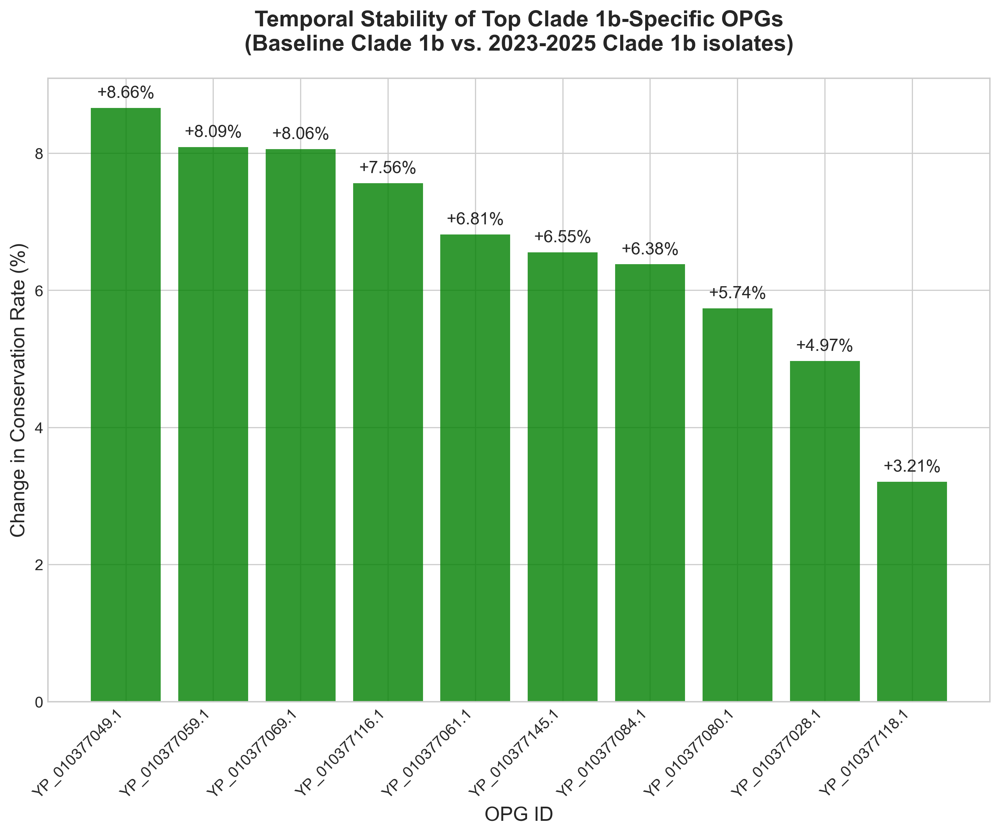

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os
import re
from Bio import SeqIO, AlignIO
from Bio.Seq import Seq
from Bio.SeqRecord import SeqRecord
from collections import defaultdict
import subprocess
import tempfile
import shutil

class Clade1bLongitudinalAnalyzer:
    """
    Clade 1b에 특이적인 OPG들의 시간 경과에 따른 보존율 변화(종단 분석)를 수행합니다.
    """
    def __init__(self, opg_file, new_seq_file, gff_file, output_dir="clade1b_longitudinal_analysis_results"):
        self.opg_file = opg_file
        self.new_seq_file = new_seq_file
        self.gff_file = gff_file
        self.output_dir = output_dir
        self.opg_data_to_analyze = None
        self.new_sequences = []
        self.opg_features = defaultdict(list)
        self.analysis_results = None
        
        os.makedirs(output_dir, exist_ok=True)
        self.temp_dir = os.path.join(output_dir, "temp")
        os.makedirs(self.temp_dir, exist_ok=True)
        print(f"결과는 '{output_dir}' 디렉토리에 저장됩니다.")

    def __del__(self):
        """소멸자: 임시 디렉토리 정리"""
        if self.temp_dir and os.path.exists(self.temp_dir):
            shutil.rmtree(self.temp_dir)

    def load_clade1b_specific_opgs(self, top_n=10):
        """
        Clade 1b 특이 OPG 목록을 로드하고, 분석할 상위 N개 OPG를 선택합니다.
        """
        print(f"\n1. Clade 1b 특이 OPG 데이터 로드 중: {self.opg_file}")
        try:
            df = pd.read_csv(self.opg_file)
            # 'conservation_difference'가 가장 큰, 즉 가장 특이적인 OPG 순으로 정렬
            df_sorted = df.sort_values('conservation_difference', ascending=False)
            self.opg_data_to_analyze = df_sorted.head(top_n)
            print(f"로드 완료. Clade 1b에 가장 특이적인 상위 {top_n}개 OPG를 분석합니다.")
            return True
        except FileNotFoundError:
            print(f"오류: 파일을 찾을 수 없습니다 -> '{self.opg_file}'")
            return False
        except KeyError:
            print("오류: CSV 파일에 'conservation_difference' 열이 없습니다.")
            return False

    def parse_gff(self):
        """GFF 파일에서 모든 OPG의 위치 정보를 추출합니다."""
        print(f"\n2. GFF 파일 파싱 중: {self.gff_file}")
        try:
            with open(self.gff_file, 'r') as f:
                for line in f:
                    if line.startswith('#'):
                        continue
                    
                    parts = line.strip().split('\t')
                    
                    if len(parts) < 9 or parts[2] != 'CDS':
                        continue

                    attributes = parts[8]
                    opg_match = re.search(r'Name=([^;]+)', attributes)
                    if opg_match:
                        opg_id = opg_match.group(1)
                        self.opg_features[opg_id].append({
                            'start': int(parts[3]), 'end': int(parts[4]), 'strand': parts[6]
                        })
            print(f"GFF 파싱 완료: {len(self.opg_features)}개 OPG 위치 정보 확보")
            return True
        except FileNotFoundError:
            print(f"오류: GFF 파일을 찾을 수 없습니다 -> '{self.gff_file}'")
            return False

    def load_new_sequences(self):
        """새로운 MPXV Clade 1b 시퀀스 데이터(2023-2025)를 로드합니다."""
        print(f"\n3. 최신 Clade 1b 시퀀스(2023-2025) 데이터 로드 중: {self.new_seq_file}")
        try:
            self.new_sequences = list(SeqIO.parse(self.new_seq_file, "fasta"))
            print(f"로드 완료: {len(self.new_sequences)}개 시퀀스")
            return True
        except FileNotFoundError:
            print(f"오류: FASTA 파일을 찾을 수 없습니다 -> '{self.new_seq_file}'")
            return False

    def calculate_conservation_from_alignment(self, alignment):
        """정렬된 시퀀스로부터 보존율을 계산합니다."""
        if not alignment or len(alignment) == 0: return 0
        length = alignment.get_alignment_length()
        conservation_scores = []
        for i in range(length):
            column = alignment[:, i]
            bases = [base for base in column if base != '-']
            if bases:
                most_common = max(set(bases), key=bases.count)
                conservation = bases.count(most_common) / len(bases)
                conservation_scores.append(conservation)
        return np.mean(conservation_scores) if conservation_scores else 0

    def analyze_temporal_stability(self):
        """
        Clade 1b 특이 OPG들에 대해 최신 Clade 1b 시퀀스 데이터셋에서의 보존율을 계산하고 변화를 분석합니다.
        """
        print("\n4. Clade 1b 특이 OPG의 시간적 안정성 분석 시작...")
        results = []
        
        for _, row in self.opg_data_to_analyze.iterrows():
            opg_id = row['OPG']
            # 기준 보존율은 Clade 1b에서의 보존율을 사용
            baseline_conservation = row['Conservation_clade1b']
            
            if opg_id not in self.opg_features:
                print(f"  경고: {opg_id}의 위치 정보가 GFF 파일에 없어 건너뜁니다.")
                continue

            feature = self.opg_features[opg_id][0] # 대표 위치 정보 사용
            opg_sequences = []
            for seq in self.new_sequences:
                if len(seq.seq) < feature['end']: continue
                region_seq = seq.seq[feature['start']-1:feature['end']]
                if feature['strand'] == '-':
                    region_seq = region_seq.reverse_complement()
                opg_sequences.append(SeqRecord(region_seq, id=seq.id))
            
            if len(opg_sequences) < 2: continue

            # *** 오류 수정 부분: 파일 이름에 부적합한 '.'을 '_'로 변경 ***
            safe_opg_id = opg_id.replace('.', '_')
            
            # MAFFT를 이용한 정렬 및 보존율 계산
            temp_fasta = os.path.join(self.temp_dir, f"{safe_opg_id}.fasta")
            aligned_fasta = os.path.join(self.temp_dir, f"{safe_opg_id}_aligned.fasta")
            SeqIO.write(opg_sequences, temp_fasta, "fasta")
            
            try:
                with open(aligned_fasta, 'w') as outf:
                    subprocess.run(["mafft", "--auto", temp_fasta], stdout=outf, stderr=subprocess.PIPE, check=True)
                alignment = AlignIO.read(aligned_fasta, "fasta")
                new_conservation = self.calculate_conservation_from_alignment(alignment) * 100
                
                results.append({
                    'OPG': opg_id,
                    'Baseline_Conservation_in_Clade1b': baseline_conservation,
                    'New_Conservation_in_2023-2025_Clade1b': new_conservation,
                    'Conservation_Change': new_conservation - baseline_conservation
                })
                print(f"  - {opg_id} 분석 완료: {baseline_conservation:.2f}% -> {new_conservation:.2f}% (변화: {new_conservation - baseline_conservation:+.2f}%)")
            except Exception as e:
                print(f"  오류: {opg_id} 분석 중 오류 발생 - {e}")

        self.analysis_results = pd.DataFrame(results)
        output_csv = os.path.join(self.output_dir, "longitudinal_stability_of_clade1b_opgs.csv")
        self.analysis_results.to_csv(output_csv, index=False)
        print(f"\n분석 완료. 결과가 CSV 파일로 저장되었습니다: {output_csv}")

    def plot_results(self):
        """분석 결과를 막대그래프로 시각화합니다."""
        if self.analysis_results is None or self.analysis_results.empty:
            print("시각화할 데이터가 없습니다.")
            return
            
        df_plot = self.analysis_results.sort_values('Conservation_Change', ascending=False)
        
        fig, ax = plt.subplots(figsize=(12, 8))
        
        colors = ['green' if x >= 0 else 'red' for x in df_plot['Conservation_Change']]
        bars = ax.bar(df_plot['OPG'], df_plot['Conservation_Change'], color=colors, alpha=0.8)
        
        ax.axhline(0, color='black', linewidth=0.8)
        ax.set_title('Temporal Stability of Top Clade 1b-Specific OPGs\n(Baseline Clade 1b vs. 2023-2025 Clade 1b isolates)', fontweight='bold', pad=20)
        ax.set_ylabel('Change in Conservation Rate (%)')
        ax.set_xlabel('OPG ID')
        plt.xticks(rotation=45, ha='right')
        
        # 막대 위에 값 표시
        for bar in bars:
            yval = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2.0, yval + (0.1 if yval > 0 else -0.2),
                    f'{yval:+.2f}%', ha='center', va='bottom' if yval > 0 else 'top')

        output_fig = os.path.join(self.output_dir, "Fig_Clade1b_Temporal_Stability.png")
        plt.savefig(output_fig)
        print(f"결과 그래프 저장 완료: {output_fig}")
        plt.show()

    def run_full_analysis(self):
        """전체 분석 파이프라인을 실행합니다."""
        if self.load_clade1b_specific_opgs() and \
           self.parse_gff() and \
           self.load_new_sequences():
            self.analyze_temporal_stability()
            self.plot_results()

# --- 메인 실행 부분 ---
if __name__ == "__main__":
    # 필요한 파일 경로 설정
    opg_file = "mpxv_clade_specific_analysis/clade1b_specific_OPGs_relative.csv"
    new_seq_file = "mpxv isolates 1b 2023-2025.fasta"
    gff_file = "mpxv_reference.gff"

    # 분석기 실행
    analyzer = Clade1bLongitudinalAnalyzer(opg_file, new_seq_file, gff_file)
    analyzer.run_full_analysis()

--- 분석 1: Clade 1b 특이성 분석 시작 ---
Clade 1b에 가장 특이적인 상위 3개 OPG:
              OPG  conservation_difference
0  YP_010377069.1                13.236711
1  YP_010377116.1                12.402537
2  YP_010377145.1                12.099700
Figure 5 저장 완료: publication_figures/Figure_5_Clade1b_Top3_Specificity.png


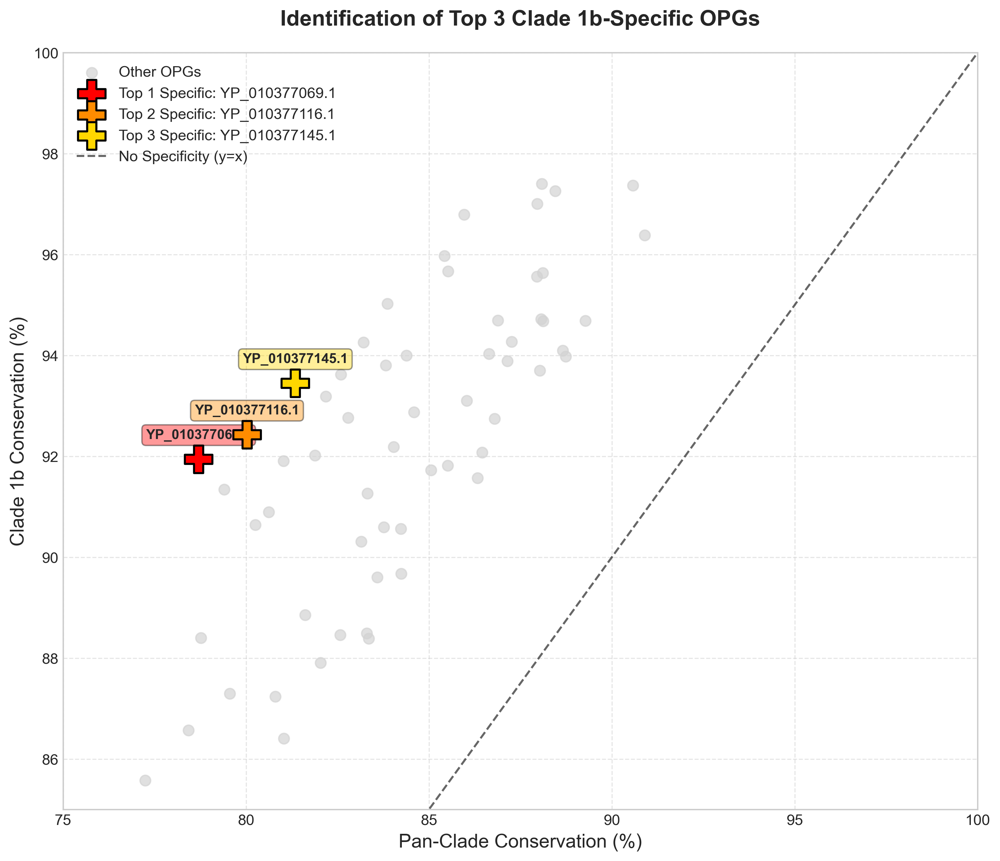


--- 분석 2: 상위 3개 OPG의 시간적 안정성 분석 시작 ---
GFF 파싱 및 최신 시퀀스 로드 완료.
  - YP_010377069.1 분석 완료: +100.00% (변화: +8.06%)
  - YP_010377116.1 분석 완료: +99.99% (변화: +7.56%)
  - YP_010377145.1 분석 완료: +100.00% (변화: +6.55%)
Figure 6 저장 완료: publication_figures/Figure_6_Clade1b_Top3_Stability.png


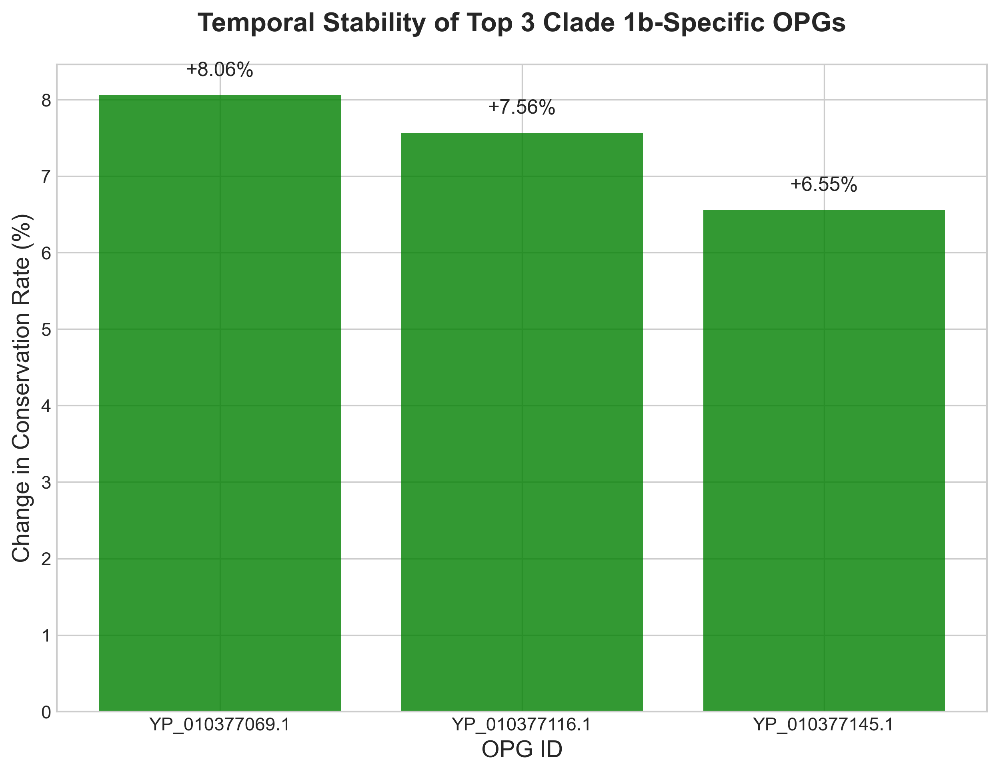

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os
import re
from Bio import SeqIO, AlignIO
from Bio.SeqRecord import SeqRecord
from collections import defaultdict
import subprocess
import shutil

# --- 1. 설정: 스타일, 파일 경로 등 ---
plt.rcParams.update({
    'font.family': 'sans-serif', 'font.sans-serif': ['Arial'], 'font.size': 12,
    'axes.titlesize': 16, 'axes.labelsize': 14, 'xtick.labelsize': 11,
    'ytick.labelsize': 11, 'legend.fontsize': 11, 'figure.dpi': 300
})

# 입력 파일 경로
SPECIFICITY_FILE = "mpxv_clade_specific_analysis/clade1b_specific_OPGs_relative.csv"
NEW_SEQUENCES_FILE = "mpxv isolates 1b 2023-2025.fasta"
GFF_FILE = "mpxv_reference.gff"
OUTPUT_DIR = "publication_figures"
os.makedirs(OUTPUT_DIR, exist_ok=True)


# --- 2. 첫 번째 분석: Clade 1b 특이성 상위 3개 OPG 식별 및 시각화 ---

def analyze_and_plot_specificity(filepath):
    """
    Clade 1b 특이성 데이터를 로드하고, 상위 3개를 강조하는 Figure 5를 생성합니다.
    """
    print("--- 분석 1: Clade 1b 특이성 분석 시작 ---")
    try:
        df = pd.read_csv(filepath)
        # 'conservation_difference' 기준으로 정렬하여 상위 3개 OPG 식별
        top_3_specific_opgs = df.sort_values('conservation_difference', ascending=False).head(3)
        print("Clade 1b에 가장 특이적인 상위 3개 OPG:")
        print(top_3_specific_opgs[['OPG', 'conservation_difference']])
    except FileNotFoundError:
        print(f"오류: 파일을 찾을 수 없습니다 -> '{filepath}'")
        return None

    # --- Figure 5 생성 ---
    fig, ax = plt.subplots(figsize=(12, 10))
    
    # 배경 OPG 플로팅
    ax.scatter(
        df['Conservation_all_clades'], df['Conservation_clade1b'],
        color='lightgrey', s=60, alpha=0.7, label='Other OPGs'
    )
    
    # 상위 3개 OPG 강조
    colors = ['red', 'darkorange', 'gold']
    for i, (_, row) in enumerate(top_3_specific_opgs.iterrows()):
        ax.scatter(
            row['Conservation_all_clades'], row['Conservation_clade1b'],
            color=colors[i], s=400, marker='P', edgecolors='black', linewidth=1.5,
            label=f"Top {i+1} Specific: {row['OPG']}", zorder=10
        )
        ax.annotate(
            row['OPG'], (row['Conservation_all_clades'], row['Conservation_clade1b']),
            xytext=(0, 15), textcoords='offset points', ha='center',
            fontsize=10, fontweight='bold', bbox=dict(boxstyle='round,pad=0.3', fc=colors[i], alpha=0.4)
        )

    ax.plot([75, 100], [75, 100], 'k--', alpha=0.6, label='No Specificity (y=x)')
    ax.set_title('Identification of Top 3 Clade 1b-Specific OPGs', fontweight='bold', pad=20)
    ax.set_xlabel('Pan-Clade Conservation (%)')
    ax.set_ylabel('Clade 1b Conservation (%)')
    ax.set_xlim(75, 100)
    ax.set_ylim(85, 100)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.legend()

    output_file = os.path.join(OUTPUT_DIR, "Figure_5_Clade1b_Top3_Specificity.png")
    plt.savefig(output_file)
    print(f"Figure 5 저장 완료: {output_file}")
    plt.show()
    
    return top_3_specific_opgs


# --- 3. 두 번째 분석: 상위 3개 OPG의 시간적 안정성 분석 및 시각화 ---

class LongitudinalAnalyzer:
    """상위 OPG들의 종단 분석을 수행하는 클래스"""
    def __init__(self, opg_data, new_seq_file, gff_file, output_dir):
        self.opg_data_to_analyze = opg_data
        self.new_seq_file = new_seq_file
        self.gff_file = gff_file
        self.output_dir = output_dir
        self.opg_features = defaultdict(list)
        self.analysis_results = None
        self.temp_dir = os.path.join(output_dir, "temp_stability_analysis")
        os.makedirs(self.temp_dir, exist_ok=True)

    def __del__(self):
        if self.temp_dir and os.path.exists(self.temp_dir):
            shutil.rmtree(self.temp_dir)

    def run_analysis(self):
        print("\n--- 분석 2: 상위 3개 OPG의 시간적 안정성 분석 시작 ---")
        if not self._load_dependencies(): return
        self._calculate_stability()
        self._plot_stability_results()

    def _load_dependencies(self):
        # GFF 파싱
        try:
            with open(self.gff_file, 'r') as f:
                for line in f:
                    if line.startswith('#'): continue
                    parts = line.strip().split('\t')
                    if len(parts) < 9 or parts[2] != 'CDS': continue
                    attributes = parts[8]
                    opg_match = re.search(r'Name=([^;]+)', attributes)
                    if opg_match:
                        opg_id = opg_match.group(1)
                        self.opg_features[opg_id].append({'start': int(parts[3]), 'end': int(parts[4]), 'strand': parts[6]})
        except FileNotFoundError:
            print(f"오류: GFF 파일을 찾을 수 없습니다 -> '{self.gff_file}'")
            return False
        
        # 최신 시퀀스 로드
        try:
            self.new_sequences = list(SeqIO.parse(self.new_seq_file, "fasta"))
        except FileNotFoundError:
            print(f"오류: 최신 시퀀스 파일을 찾을 수 없습니다 -> '{self.new_seq_file}'")
            return False
            
        print("GFF 파싱 및 최신 시퀀스 로드 완료.")
        return True

    def _calculate_stability(self):
        results = []
        for _, row in self.opg_data_to_analyze.iterrows():
            opg_id = row['OPG']
            baseline_conservation = row['Conservation_clade1b']
            
            if opg_id not in self.opg_features: continue

            feature = self.opg_features[opg_id][0]
            opg_sequences = []
            for seq in self.new_sequences:
                if len(seq.seq) < feature['end']: continue
                region_seq = seq.seq[feature['start']-1:feature['end']]
                if feature['strand'] == '-': region_seq = region_seq.reverse_complement()
                opg_sequences.append(SeqRecord(region_seq, id=seq.id))
            
            if len(opg_sequences) < 2: continue

            safe_opg_id = opg_id.replace('.', '_')
            temp_fasta = os.path.join(self.temp_dir, f"{safe_opg_id}.fasta")
            aligned_fasta = os.path.join(self.temp_dir, f"{safe_opg_id}_aligned.fasta")
            SeqIO.write(opg_sequences, temp_fasta, "fasta")
            
            try:
                with open(aligned_fasta, 'w') as outf:
                    subprocess.run(["mafft", "--auto", temp_fasta], stdout=outf, stderr=subprocess.PIPE, check=True)
                alignment = AlignIO.read(aligned_fasta, "fasta")
                
                # 보존율 계산
                length = alignment.get_alignment_length()
                scores = []
                for i in range(length):
                    column = alignment[:, i]
                    bases = [b for b in column if b != '-']
                    if bases:
                        most_common = max(set(bases), key=bases.count)
                        scores.append(bases.count(most_common) / len(bases))
                new_conservation = (np.mean(scores) * 100) if scores else 0

                results.append({
                    'OPG': opg_id,
                    'Baseline_Conservation': baseline_conservation,
                    'New_Conservation': new_conservation,
                    'Conservation_Change': new_conservation - baseline_conservation
                })
                print(f"  - {opg_id} 분석 완료: {new_conservation:+.2f}% (변화: {new_conservation - baseline_conservation:+.2f}%)")
            except Exception as e:
                print(f"  오류: {opg_id} 분석 중 오류 발생 - {e}")

        self.analysis_results = pd.DataFrame(results)

    def _plot_stability_results(self):
        if self.analysis_results is None or self.analysis_results.empty:
            print("안정성 분석 결과가 없어 그래프를 생성할 수 없습니다.")
            return

        df_plot = self.analysis_results.sort_values('Conservation_Change', ascending=False)
        fig, ax = plt.subplots(figsize=(10, 7))
        
        colors = ['green' if x >= 0 else 'red' for x in df_plot['Conservation_Change']]
        bars = ax.bar(df_plot['OPG'], df_plot['Conservation_Change'], color=colors, alpha=0.8)
        
        ax.axhline(0, color='black', linewidth=0.8)
        ax.set_title('Temporal Stability of Top 3 Clade 1b-Specific OPGs', fontweight='bold', pad=20)
        ax.set_ylabel('Change in Conservation Rate (%)')
        ax.set_xlabel('OPG ID')
        plt.xticks(rotation=0)
        
        for bar in bars:
            yval = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2.0, yval + (0.2 if yval > 0 else -0.4),
                    f'{yval:+.2f}%', ha='center', va='bottom' if yval > 0 else 'top')

        output_file = os.path.join(self.output_dir, "Figure_6_Clade1b_Top3_Stability.png")
        plt.savefig(output_file)
        print(f"Figure 6 저장 완료: {output_file}")
        plt.show()


# --- 4. 메인 실행 ---
if __name__ == "__main__":
    # 1단계: 특이성 분석 및 상위 3개 OPG 식별
    top_3_opgs = analyze_and_plot_specificity(SPECIFICITY_FILE)
    
    # 2단계: 식별된 상위 3개 OPG에 대한 종단 분석
    if top_3_opgs is not None and not top_3_opgs.empty:
        stability_analyzer = LongitudinalAnalyzer(
            opg_data=top_3_opgs,
            new_seq_file=NEW_SEQUENCES_FILE,
            gff_file=GFF_FILE,
            output_dir=OUTPUT_DIR
        )
        stability_analyzer.run_analysis()
    else:
        print("\n상위 OPG를 식별하지 못해 안정성 분석을 건너뜁니다.")


Figure saved as conserved_opgs_figure_updated.png


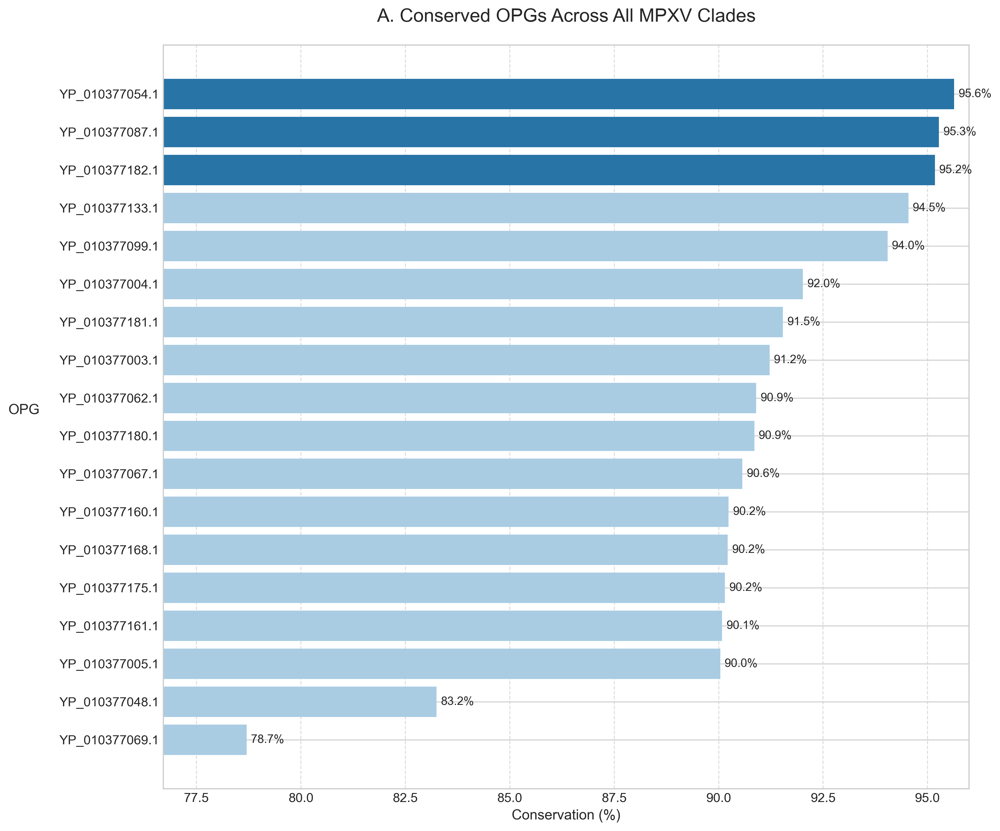

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Set the path to your CSV file
file_path = 'opg_analysis_results/opg_analysis_summary_clade_all.csv'

try:
    # Read the CSV file
    df = pd.read_csv(file_path)

    # List of OPG IDs to always include (diagnostic targets)
    target_opgs = ['YP_0010377054.1', 'YP_010377048.1', 'YP_010377069.1']

    # 1. Select data with conservation of 90% or higher
    df_high_conservation = df[df['Conservation'] >= 90]

    # 2. Select the data for the OPGs to always include
    df_targets = df[df['OPG'].isin(target_opgs)]

    # 3. Combine the two dataframes and remove duplicates to create the final dataset for plotting
    df_plot = pd.concat([df_high_conservation, df_targets]).drop_duplicates().reset_index(drop=True)

    # --- MODIFICATION START ---

    # Identify the top 3 OPGs with the highest conservation values
    top_3_opgs = df_plot.nlargest(3, 'Conservation')['OPG'].tolist()

    # Sort the data by 'Conservation' in ascending order for visualization
    df_plot_sorted = df_plot.sort_values(by='Conservation', ascending=True)

    # Set bar colors: a different color for the top 3, and a base color for the rest
    # The colors are chosen to better match the second reference image
    base_color = '#a9cce3'  # A soft, light blue
    highlight_color = '#2874a6' # A stronger, darker blue
    colors = [highlight_color if opg in top_3_opgs else base_color for opg in df_plot_sorted['OPG']]

    # --- MODIFICATION END ---

    # Create the horizontal bar chart (adjusting figure size for clarity)
    fig, ax = plt.subplots(figsize=(12, 10))
    bars = ax.barh(df_plot_sorted['OPG'], df_plot_sorted['Conservation'], color=colors)

    # Set the title and axis labels
    ax.set_title('A. Conserved OPGs Across All MPXV Clades', fontsize=16, pad=20)
    ax.set_xlabel('Conservation (%)', fontsize=12)
    ax.set_ylabel('OPG', fontsize=12, rotation=0, labelpad=30)

    # Set the x-axis limits (minimum value to 96%)
    min_conservation = df_plot_sorted['Conservation'].min()
    ax.set_xlim(left=min_conservation - 2, right=96) # Set max x-axis value to 96

    # Add the conservation percentage text to each bar
    for bar in bars:
        width = bar.get_width()
        # Adjust text position to prevent it from going off the chart
        if width > 96:
            label_x_pos = 95.9
            ha = 'right'
        else:
            label_x_pos = width + 0.1
            ha = 'left'
        ax.text(label_x_pos, bar.get_y() + bar.get_height()/2, f'{width:.1f}%',
                va='center', ha=ha, fontsize=10)

    # Configure grid and layout
    ax.grid(axis='x', linestyle='--', alpha=0.7)
    plt.tight_layout()

    # Save the chart as a PNG file
    output_filename = 'conserved_opgs_figure_updated.png'
    plt.savefig(output_filename, dpi=300, bbox_inches='tight')
    print(f"Figure saved as {output_filename}")
    
    # plt.show() # Displaying the plot is commented out

except FileNotFoundError:
    print(f"Error: The file '{file_path}' was not found. Please check the path.")
except Exception as e:
    print(f"An error occurred: {e}")


Figure saved as conserved_opgs_figure_updated_v2.png


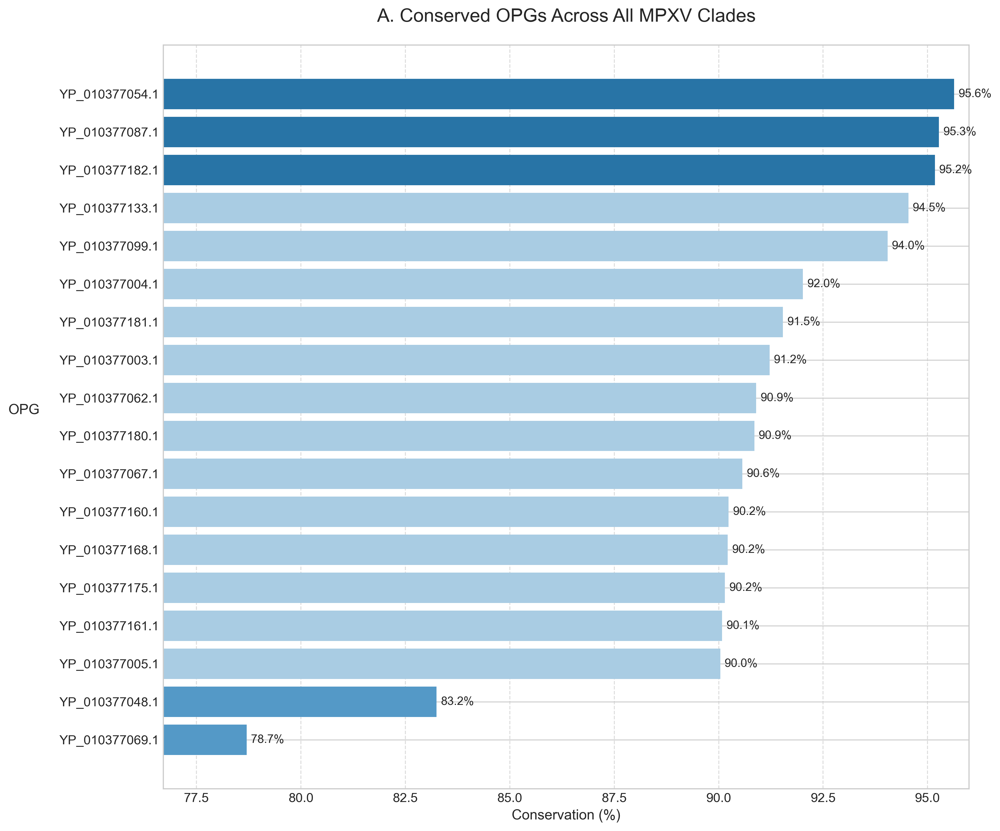

In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# CSV 파일 경로를 설정합니다.
file_path = 'opg_analysis_results/opg_analysis_summary_clade_all.csv'

try:
    # CSV 파일을 읽어옵니다.
    df = pd.read_csv(file_path)

    # 항상 포함할 OPG ID 리스트 (진단 타겟)
    target_opgs = ['YP_0010377054.1', 'YP_010377048.1', 'YP_010377069.1']

    # 1. 보존도가 90% 이상인 데이터를 선택합니다.
    df_high_conservation = df[df['Conservation'] >= 90]

    # 2. 항상 포함할 OPG 데이터를 선택합니다.
    df_targets = df[df['OPG'].isin(target_opgs)]

    # 3. 두 데이터프레임을 합치고 중복을 제거하여 플로팅할 최종 데이터를 생성합니다.
    df_plot = pd.concat([df_high_conservation, df_targets]).drop_duplicates().reset_index(drop=True)

    # --- 수정 시작 ---

    # 보존도 값이 가장 높은 상위 3개 OPG를 식별합니다.
    top_3_opgs = df_plot.nlargest(3, 'Conservation')['OPG'].tolist()
    
    # 추가로 강조할 특정 OPG 리스트를 정의합니다.
    specific_target_opgs = ['YP_010377048.1', 'YP_010377069.1']

    # 시각화를 위해 'Conservation'을 기준으로 오름차순 정렬합니다.
    df_plot_sorted = df_plot.sort_values(by='Conservation', ascending=True)

    # 막대 색상을 설정합니다: 상위 3개, 특정 타겟, 나머지 OPG에 대해 다른 색을 지정합니다.
    base_color = '#a9cce3'           # 기본: 연한 하늘색
    target_highlight_color = '#5499c7' # 특정 타겟: 중간 파란색
    top_3_highlight_color = '#2874a6'  # 상위 3개: 진한 파란색
    
    colors = []
    for opg in df_plot_sorted['OPG']:
        if opg in top_3_opgs:
            colors.append(top_3_highlight_color)
        elif opg in specific_target_opgs:
            colors.append(target_highlight_color)
        else:
            colors.append(base_color)

    # --- 수정 종료 ---

    # 수평 막대 그래프를 생성합니다 (그래프 크기 조절).
    fig, ax = plt.subplots(figsize=(12, 10))
    bars = ax.barh(df_plot_sorted['OPG'], df_plot_sorted['Conservation'], color=colors)

    # 그래프 제목 및 축 레이블을 설정합니다.
    ax.set_title('A. Conserved OPGs Across All MPXV Clades', fontsize=16, pad=20)
    ax.set_xlabel('Conservation (%)', fontsize=12)
    ax.set_ylabel('OPG', fontsize=12, rotation=0, labelpad=30)

    # x축 범위를 설정합니다 (최소값 ~ 96%).
    min_conservation = df_plot_sorted['Conservation'].min()
    ax.set_xlim(left=min_conservation - 2, right=96) # x축 최댓값을 96으로 설정

    # 각 막대에 보존도(%) 텍스트를 추가합니다.
    for bar in bars:
        width = bar.get_width()
        # 막대가 그래프 영역을 벗어나지 않도록 텍스트 위치를 조정합니다.
        if width > 96:
            label_x_pos = 95.9
            ha = 'right'
        else:
            label_x_pos = width + 0.1
            ha = 'left'
        ax.text(label_x_pos, bar.get_y() + bar.get_height()/2, f'{width:.1f}%',
                va='center', ha=ha, fontsize=10)

    # 그리드 및 레이아웃을 설정합니다.
    ax.grid(axis='x', linestyle='--', alpha=0.7)
    plt.tight_layout()

    # 그래프를 PNG 파일로 저장합니다.
    output_filename = 'conserved_opgs_figure_updated_v2.png'
    plt.savefig(output_filename, dpi=300, bbox_inches='tight')
    print(f"Figure saved as {output_filename}")
    
    # plt.show() # 화면 표시는 주석 처리

except FileNotFoundError:
    print(f"오류: '{file_path}' 파일을 찾을 수 없습니다. 경로를 확인해주세요.")
except Exception as e:
    print(f"오류가 발생했습니다: {e}")
